# Practical Application III: Comparing Classifiers

**Overview**: In this practical application, your goal is to compare the performance of the classifiers we encountered in this section, namely K Nearest Neighbor, Logistic Regression, Decision Trees, and Support Vector Machines.  We will utilize a dataset related to marketing bank products over the telephone.  



### Getting Started

Our dataset comes from the UCI Machine Learning repository [link](https://archive.ics.uci.edu/ml/datasets/bank+marketing).  The data is from a Portugese banking institution and is a collection of the results of multiple marketing campaigns.  We will make use of the article accompanying the dataset [here](CRISP-DM-BANK.pdf) for more information on the data and features.



### Problem 1: Understanding the Data

To gain a better understanding of the data, please read the information provided in the UCI link above, and examine the **Materials and Methods** section of the paper.  How many marketing campaigns does this data represent?

**Answer:**
The dataset collected is related to 17 campaigns that occurred between May 2008 and November 2010, corresponding to a total of 79354 contacts. During these phone campaigns, an attractive long-term deposit application, with good interest rates, was offered. For each contact, a large number of attributes was stored and if there was a success (the target variable). For the whole database considered, there were 6499 successes (8% success rate).

### Problem 2: Read in the Data

Use pandas to read in the dataset `bank-additional-full.csv` and assign to a meaningful variable name.

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, RocCurveDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVC
from scipy import stats
from scipy.stats import uniform, randint
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

import time
import joblib
import os
import itertools

In [ ]:
# Create images folder to save visual represenatation
os.makedirs('images', exist_ok=True)
np.set_printoptions(precision=4, suppress=True)

# Display with all columns visible (no clipping)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [ ]:
# Load Datasets
bank_df = pd.read_csv('data/bank-additional-full.csv', sep = ';')
rows, cols = bank_df.shape
print(f"The dataset has {rows} rows and {cols} columns.")

The dataset has 41188 rows and 21 columns.


In [ ]:
# Display dataframe samples
bank_df.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
18112,35,blue-collar,married,professional.course,no,yes,no,cellular,jul,wed,218,2,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,no
24258,42,housemaid,married,university.degree,no,yes,no,telephone,nov,mon,85,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no
24394,35,blue-collar,married,professional.course,no,yes,no,cellular,nov,mon,345,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no
36311,72,admin.,married,university.degree,no,yes,no,cellular,jun,mon,134,1,999,0,nonexistent,-2.9,92.963,-40.8,1.266,5076.2,no
27796,30,student,single,basic.4y,no,yes,yes,cellular,mar,tue,70,2,999,0,nonexistent,-1.8,92.843,-50.0,1.687,5099.1,no


### Problem 3: Understanding the Features


Examine the data description below, and determine if any of the features are missing values or need to be coerced to a different data type.


```
Input variables:
# bank client data:
1 - age (numeric)
2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5 - default: has credit in default? (categorical: 'no','yes','unknown')
6 - housing: has housing loan? (categorical: 'no','yes','unknown')
7 - loan: has personal loan? (categorical: 'no','yes','unknown')
# related with the last contact of the current campaign:
8 - contact: contact communication type (categorical: 'cellular','telephone')
9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
# other attributes:
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14 - previous: number of contacts performed before this campaign and for this client (numeric)
15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
# social and economic context attributes
16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
17 - cons.price.idx: consumer price index - monthly indicator (numeric)
18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)
19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
20 - nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):
21 - y - has the client subscribed a term deposit? (binary: 'yes','no')
```



**Inspect and clean datasets**
  1. Rename column names to description name with consistent naming standard.
  2. Inspect datasets
  3. Check for missing values
  4. Check for incorrect values / impossible values
  5. Check duplicates data
  6. Check if any outliers
     * box plot - visual
     * IQR
     * z-score
  7. Correct Data Types
  8. EDA analysis:

    * Univariate
    * Bivariate (Corelation)
    * Multivariate
    

**3.1. Rename column names for consistency**

In [ ]:
bank_df.rename(columns= {
    'age': 'age',
    'job': 'job_type',
    'marital': 'marital_status',
    'education': 'education_level',
    'default': 'has_credit_default',
    'housing': 'has_housing_loan',
    'loan': 'has_personal_loan',
    'contact': 'contact_communication_type',
    'month': 'last_contact_month',
    'day_of_week': 'last_contact_day_of_week',
    'duration': 'last_contact_duration_seconds',
    'campaign': 'current_campaign_num_contacts',
    'pdays': 'prev_campaign_days_since_contact',
    'previous': 'prev_campaign_num_contacts',
    'poutcome': 'prev_campaign_outcome',
    'emp.var.rate': 'employment_variation_rate',
    'cons.price.idx': 'consumer_price_index',
    'cons.conf.idx': 'consumer_confidence_index',
    'euribor3m': 'euribor_3_month_rate',
    'nr.employed': 'qtly_avg_employed',
    'y': 'has_subscribed_cd'
    }, inplace=True)

**3.2 Inspect Datasets**

In [ ]:
# Datasets information
bank_df.info()
print("=" * 70)

print(f"\033[1mSummarize numerical features\033[0m")
print(bank_df.describe())
print("=" * 70)

# Summarize categorical features
print(f"\033[1mSummarize categorical features\033[0m")
for col in bank_df.select_dtypes(include='object').columns:
    print(f"\nColumn: {col} count: {col.count}")
    display(bank_df[col].value_counts())

print("=" * 70)
bank_df.select_dtypes(include = "object").agg(["nunique"])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   age                               41188 non-null  int64  
 1   job_type                          41188 non-null  object 
 2   marital_status                    41188 non-null  object 
 3   education_level                   41188 non-null  object 
 4   has_credit_default                41188 non-null  object 
 5   has_housing_loan                  41188 non-null  object 
 6   has_personal_loan                 41188 non-null  object 
 7   contact_communication_type        41188 non-null  object 
 8   last_contact_month                41188 non-null  object 
 9   last_contact_day_of_week          41188 non-null  object 
 10  last_contact_duration_seconds     41188 non-null  int64  
 11  current_campaign_num_contacts     41188 non-null  int64  
 12  prev

,count
job_type,
admin.,10422
blue-collar,9254
technician,6743
services,3969
management,2924
retired,1720
entrepreneur,1456
self-employed,1421
housemaid,1060



Column: marital_status count: <built-in method count of str object at 0x7b9da5b93970>


,count
marital_status,
married,24928
single,11568
divorced,4612
unknown,80



Column: education_level count: <built-in method count of str object at 0x7b9da5b93830>


,count
education_level,
university.degree,12168
high.school,9515
basic.9y,6045
professional.course,5243
basic.4y,4176
basic.6y,2292
unknown,1731
illiterate,18



Column: has_credit_default count: <built-in method count of str object at 0x7b9da5b937b0>


,count
has_credit_default,
no,32588
unknown,8597
yes,3



Column: has_housing_loan count: <built-in method count of str object at 0x7b9da5b93770>


,count
has_housing_loan,
yes,21576
no,18622
unknown,990



Column: has_personal_loan count: <built-in method count of str object at 0x7b9da5b923f0>


,count
has_personal_loan,
no,33950
yes,6248
unknown,990



Column: contact_communication_type count: <built-in method count of str object at 0x7b9da5b61930>


,count
contact_communication_type,
cellular,26144
telephone,15044



Column: last_contact_month count: <built-in method count of str object at 0x7b9da5b922b0>


,count
last_contact_month,
may,13769
jul,7174
aug,6178
jun,5318
nov,4101
apr,2632
oct,718
sep,570
mar,546



Column: last_contact_day_of_week count: <built-in method count of str object at 0x7b9da5b619d0>


,count
last_contact_day_of_week,
thu,8623
mon,8514
wed,8134
tue,8090
fri,7827



Column: prev_campaign_outcome count: <built-in method count of str object at 0x7b9da5b934f0>


,count
prev_campaign_outcome,
nonexistent,35563
failure,4252
success,1373



Column: has_subscribed_cd count: <built-in method count of str object at 0x7b9da5b903b0>


,count
has_subscribed_cd,
no,36548
yes,4640


,job_type,marital_status,education_level,has_credit_default,has_housing_loan,has_personal_loan,contact_communication_type,last_contact_month,last_contact_day_of_week,prev_campaign_outcome,has_subscribed_cd
nunique,12,4,8,3,3,3,2,10,5,3,2


**3.3 Check for missing values**

In [ ]:
print(f"\033[1mChecking if having null values:\033[0m")
print(bank_df.isna().sum())
print("=" * 70)
print(bank_df.isnull().sum())
print("=" * 70)
print(f"Dimension of Dataframe is: \nRows --> {bank_df.shape[0]} \nColumns --> {bank_df.shape[1]}")
print("=" * 70)


Checking if having null values:
age                                 0
job_type                            0
marital_status                      0
education_level                     0
has_credit_default                  0
has_housing_loan                    0
has_personal_loan                   0
contact_communication_type          0
last_contact_month                  0
last_contact_day_of_week            0
last_contact_duration_seconds       0
current_campaign_num_contacts       0
prev_campaign_days_since_contact    0
prev_campaign_num_contacts          0
prev_campaign_outcome               0
employment_variation_rate           0
consumer_price_index                0
consumer_confidence_index           0
euribor_3_month_rate                0
qtly_avg_employed                   0
has_subscribed_cd                   0
dtype: int64
age                                 0
job_type                            0
marital_status                      0
education_level                     0
has_c

**3.4 Check for impossible / incorrect values**

In [ ]:
# Get the columns with "unknown", "nonexistent", impossible values(999 or 0) values and their counts
print(f"\033[1mChecking columns with 'unknown', 'nonexistent','0' or '999' values and their counts:\033[0m")
for col in bank_df.columns:
    if bank_df[col].dtype == 'object':
        unknown_count = bank_df[col].value_counts().get('unknown', 0)
        nonexistent_count = bank_df[col].value_counts().get('nonexistent', 0)
        if unknown_count > 0:
            print(f"Column '{col}': {unknown_count} unknown values")
        if nonexistent_count > 0:
            print(f"Column '{col}': {nonexistent_count} nonexistent values")

    # Check if the column is numeric and contains 999
    if bank_df[col].dtype in ['int64', 'float64'] and (bank_df[col] == 999).any():
        count_999 = (bank_df[col] == 999).sum()
        print(f"Column '{col}': {count_999} values of 999")

    # Check if the column is numeric and contains 0
    if bank_df[col].dtype in ['int64', 'float64'] and (bank_df[col] == 0).any():
        count_0 = (bank_df[col] == 0).sum()
        print(f"Column '{col}': {count_0} values of 0")

print("=" * 70)

Checking columns with 'unknown', 'nonexistent','0' or '999' values and their counts:
Column 'job_type': 330 unknown values
Column 'marital_status': 80 unknown values
Column 'education_level': 1731 unknown values
Column 'has_credit_default': 8597 unknown values
Column 'has_housing_loan': 990 unknown values
Column 'has_personal_loan': 990 unknown values
Column 'last_contact_duration_seconds': 2 values of 999
Column 'last_contact_duration_seconds': 4 values of 0
Column 'prev_campaign_days_since_contact': 39673 values of 999
Column 'prev_campaign_days_since_contact': 15 values of 0
Column 'prev_campaign_num_contacts': 35563 values of 0
Column 'prev_campaign_outcome': 35563 nonexistent values


**3.5 Check and remove duplicate data**


In [ ]:
# Check duplicate data and remove all duplicate rows
duplicate_count = bank_df.duplicated().sum()
print(f"Percentage of duplicate rows: {bank_df.duplicated().mean() * 100:.2f}%")
print(f"Total Duplicate rows: {duplicate_count}")
# Deleting duplicate rows
if duplicate_count > 0:
    bank_df = bank_df.drop_duplicates()


Percentage of duplicate rows: 0.03%
Total Duplicate rows: 12


**3.6 Check if any outliers**

    1. box plot and scatter plot - visual
    2. IQR
    3. z-score

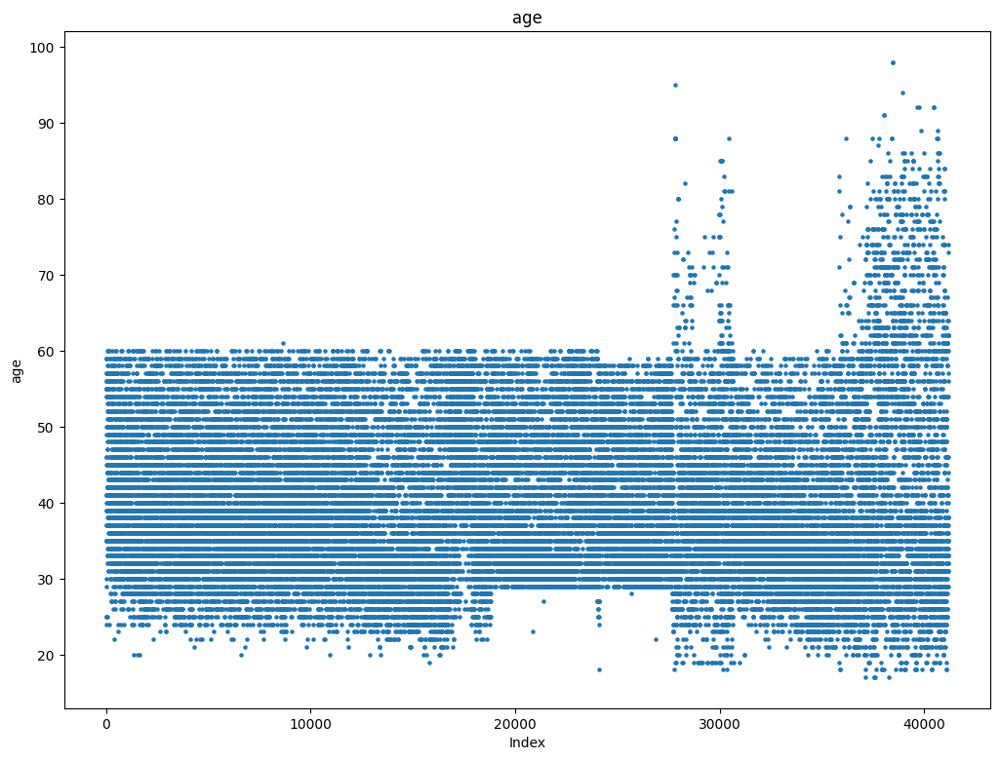

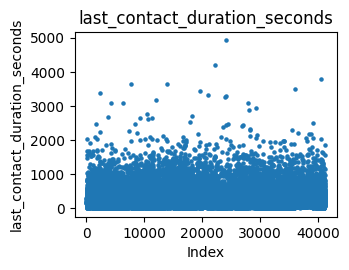

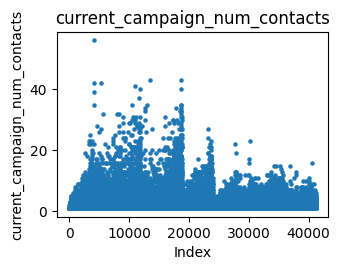

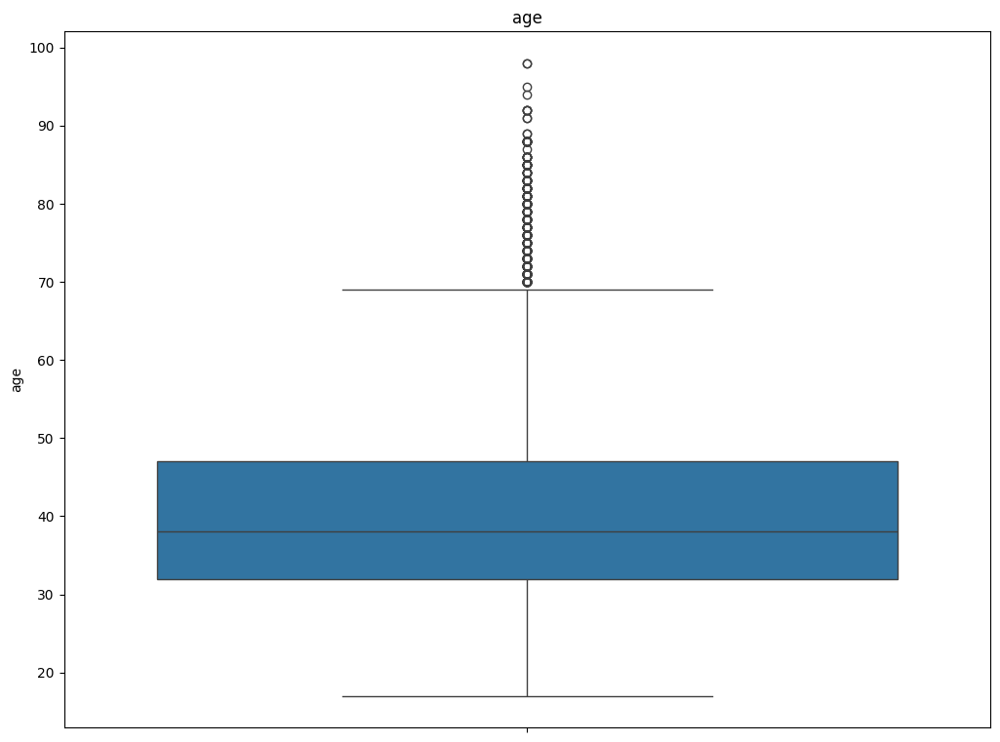

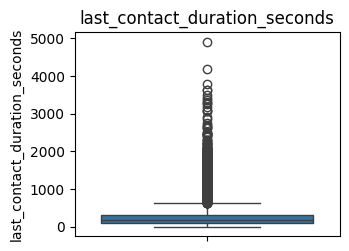

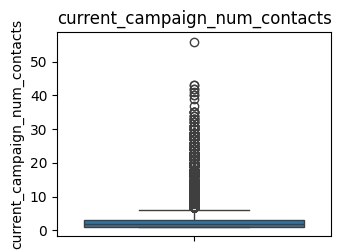

In [ ]:
# Select only necessary numerical columns
numerical_cols = ['age', 'last_contact_duration_seconds', 'current_campaign_num_contacts']

# Create Scatter plots to identify outliers
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_cols):
    plt.subplot(2, 2, i + 1)
    plt.scatter(bank_df.index, bank_df[col], s=5)
    plt.title(col)
    plt.xlabel("Index")
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()
    print('\n')
    print('\n')

# Create box plots for numerical columns
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_cols):
    plt.subplot(2, 2, i + 1)
    sns.boxplot(y=bank_df[col])
    plt.title(col)
    plt.tight_layout()
    plt.show()
    print('\n')
    print('\n')


**Use IQR to identify outliers**

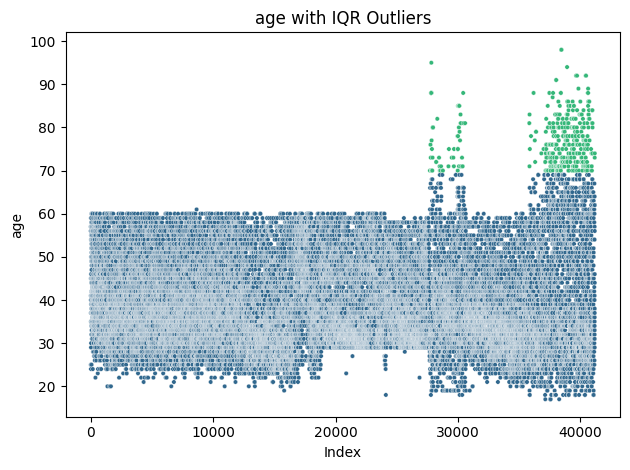

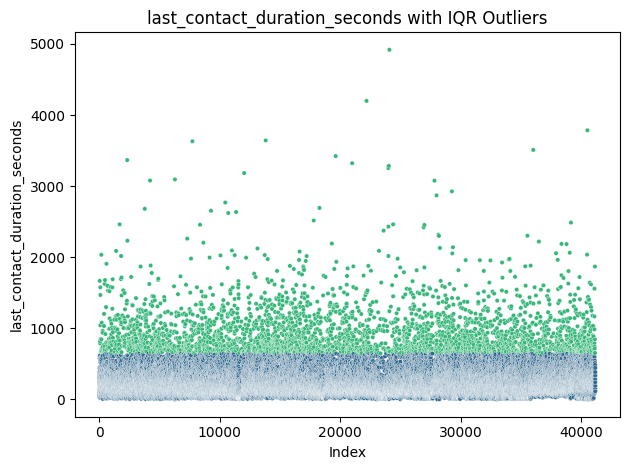

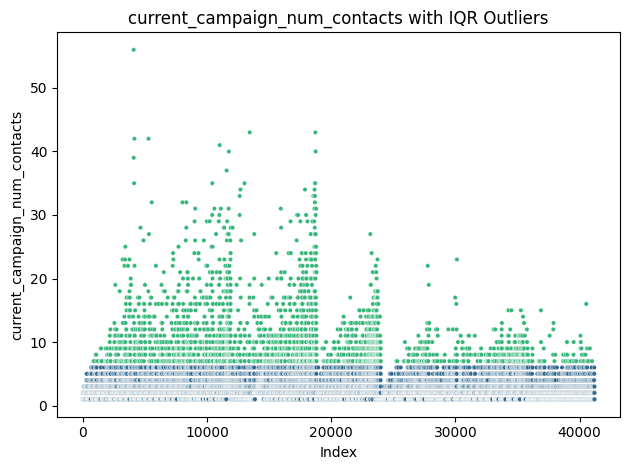

Number of outliers found using IQR method:
Column 'age': 468 outliers
Column 'last_contact_duration_seconds': 2963 outliers
Column 'current_campaign_num_contacts': 2406 outliers


In [ ]:
# Calculate IQR and identify outliers for each numerical column
outliers_iqr = {}
for col in numerical_cols:
    Q1 = bank_df[col].quantile(0.25)
    Q3 = bank_df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = bank_df[(bank_df[col] < lower_bound) | (bank_df[col] > upper_bound)]
    outliers_iqr[col] = outliers

    # Create the outliers_mask for plotting
    outliers_mask = (bank_df[col] < lower_bound) | (bank_df[col] > upper_bound)

    sns.scatterplot(x=bank_df.index, y=bank_df[col], hue=outliers_mask, s=10, palette='viridis', legend=False)
    plt.title(f'{col} with IQR Outliers')
    plt.xlabel("Index")
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()

# Display the number of outliers found for each column
print("Number of outliers found using IQR method:")
for col, outliers in outliers_iqr.items():
    print(f"Column '{col}': {len(outliers)} outliers")

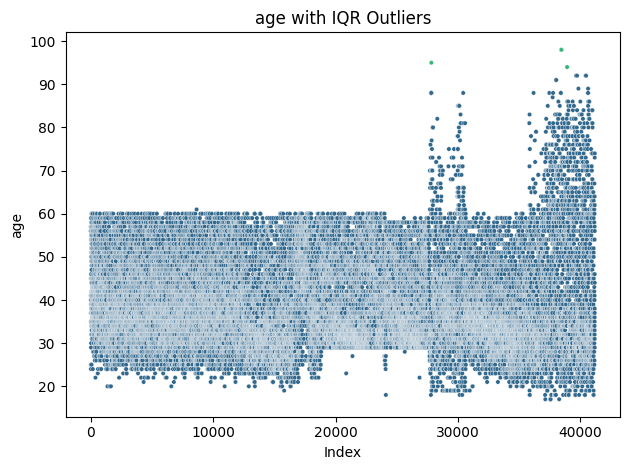

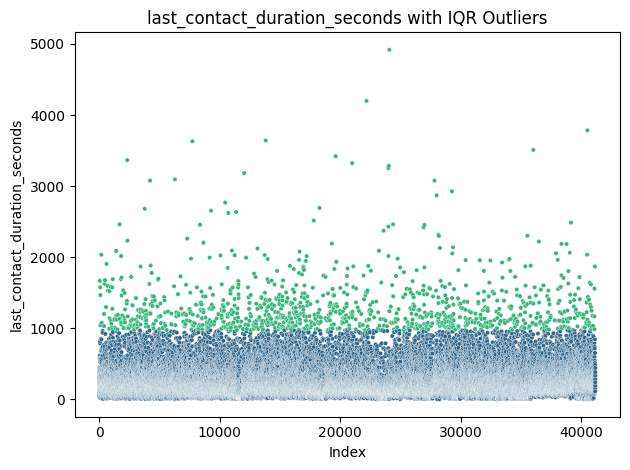

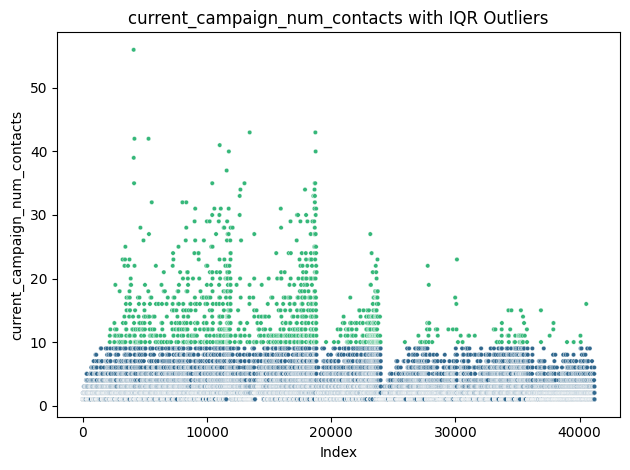

Number of outliers found using IQR method:
Column 'age': 4 outliers
Column 'last_contact_duration_seconds': 1043 outliers
Column 'current_campaign_num_contacts': 1094 outliers


In [ ]:
outliers_iqr = {}
for col in numerical_cols:
    Q1 = bank_df[col].quantile(0.25)
    Q3 = bank_df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 3 * IQR
    upper_bound = Q3 + 3 * IQR
    outliers = bank_df[(bank_df[col] < lower_bound) | (bank_df[col] > upper_bound)]
    outliers_iqr[col] = outliers

    # Create the outliers_mask for plotting
    outliers_mask = (bank_df[col] < lower_bound) | (bank_df[col] > upper_bound)

    sns.scatterplot(x=bank_df.index, y=bank_df[col], hue=outliers_mask, s=10, palette='viridis', legend=False)
    plt.title(f'{col} with IQR Outliers')
    plt.xlabel("Index")
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()

# Display the number of outliers found for each column
print("=" * 70)
print("Number of outliers found using IQR method:")
for col, outliers in outliers_iqr.items():
    print(f"Column '{col}': {len(outliers)} outliers")

**Using Z-Score to identify outliers**

In [ ]:

# Calculate Z-Scores and identify outliers for each numerical column
outliers_zscore = {}
for col in numerical_cols:
    # Calculate Z-Scores
    z_scores = np.abs(stats.zscore(bank_df[col]))

    # Define a threshold
    threshold = 3

    # Identify outliers
    outliers = bank_df[z_scores > threshold]
    outliers_zscore[col] = outliers

# Display the number of outliers found for each column
print("Number of outliers found using Z-Score method (threshold=3):")
for col, outliers in outliers_zscore.items():
    print(f"Column '{col}': {len(outliers)} outliers")

Number of outliers found using Z-Score method (threshold=3):
Column 'age': 369 outliers
Column 'last_contact_duration_seconds': 861 outliers
Column 'current_campaign_num_contacts': 869 outliers


**z-score scatter plot to identifiy outliers**

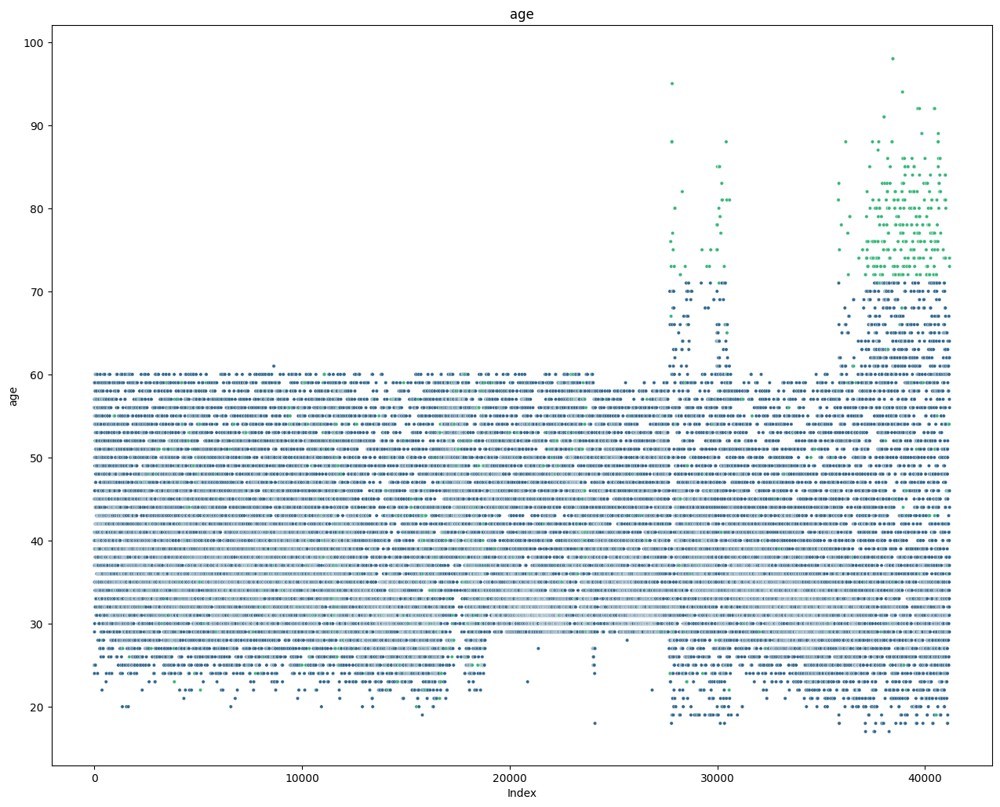

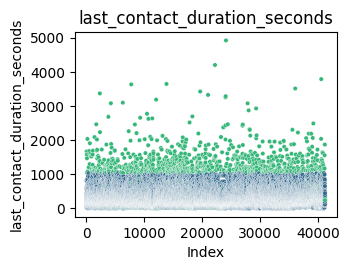

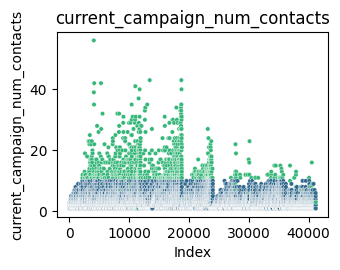

In [ ]:


# Calculate Z-Scores for numerical columns
z_scores_df = bank_df[numerical_cols].apply(lambda x: np.abs(stats.zscore(x)))

# Define a threshold
threshold = 3

# Identify outliers
outliers_mask = (z_scores_df > threshold).any(axis=1)

# Create scatter plots for numerical columns highlighting outliers
plt.figure(figsize=(25, 20))
for i, col in enumerate(numerical_cols):
    plt.subplot(2, 2, i + 1)
    sns.scatterplot(x=bank_df.index, y=bank_df[col], hue=outliers_mask, s=10, palette='viridis', legend=False)
    plt.title(col)
    plt.xlabel("Index")
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()
    print('\n')
    print('\n')
    print('\n')

**Decision based on outliers identified:**

Transforming skewed data can help improve the performance of many machine learning models. Apply log transformations to the numerical columns that appeared skewed in our earlier visualizations.

Log Transformation will be done after splitting train and test data to avoid any data leakages.

**3.7 Correct datatypes**

Based on the output of bank_df.info(), the data types for each column appear to be appropriate.

* Numerical columns are correctly identified as int64 or float64.

* Categorical columns are correctly identified as object.

Therefore, don't need to make any datatype corrections at this point.

**3.8 EDA**
  * Univariate
  * Bivariate
    * Corelation for numeric features
    * Two categorical variables
    * One numerical and one categorical variable

  * Multivariate

**3.8.1 Univariate**
  * Plot histogram for numerical columns

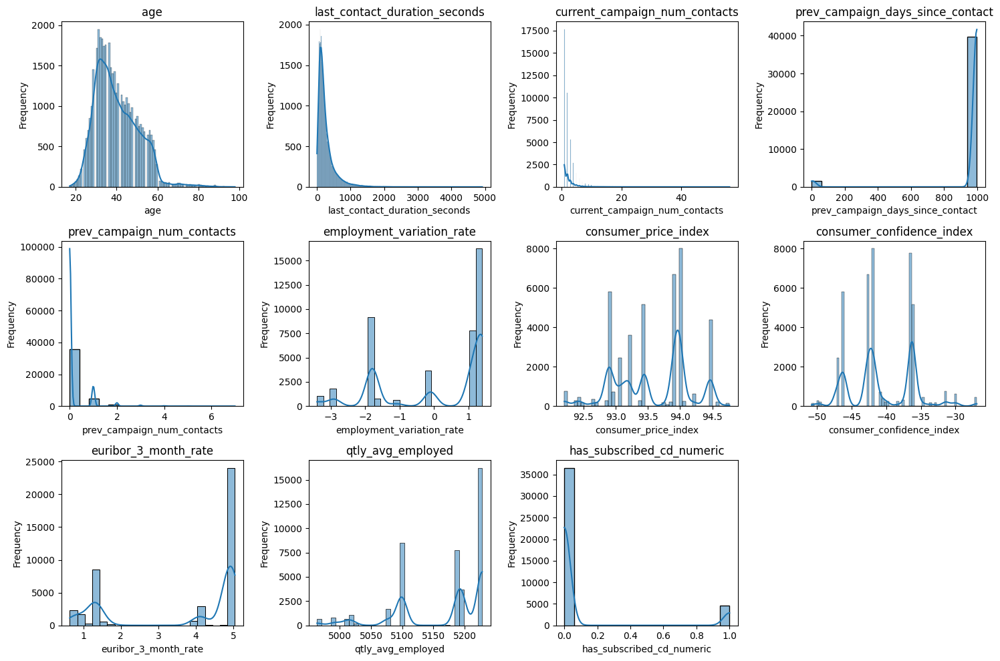

In [60]:


# Select numerical columns
numerical_cols = bank_df.select_dtypes(include=np.number).columns

# Plot histograms for numerical columns
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(3, 4, i + 1)
    sns.histplot(bank_df[col], kde=True)
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig('images/histograms.png')
plt.show()

Based on the univariate histograms for the numerical features, here is an analysis of each column:

* **age:** The distribution of age appears to be slightly right-skewed, with a peak around 30-40 years old and a tail extending towards older ages. There are also some individuals in their 80s and 90s.
* **last_contact_duration_seconds:** This feature is highly right-skewed. The majority of contact durations are short, with a long tail of longer durations. This is expected, as most phone calls in a marketing campaign would likely be brief. The note in the data description about duration significantly affecting the target variable is important to remember, though it should be excluded for a realistic predictive model.
* **current_campaign_num_contacts:** This feature is also heavily right-skewed, with most clients being contacted only a few times during the current campaign. There are a few instances of clients being contacted many times, which could be outliers or indicate specific campaign strategies.
* **prev_campaign_days_since_contact:** This histogram shows a large spike at 999, which, as we noted earlier, indicates that the client was not previously contacted. There's a smaller distribution of values for clients who were contacted in previous campaigns, showing the number of days since that contact. This feature is highly bimodal due to the large number of 999 values.
* **prev_campaign_num_contacts:** This feature is also highly skewed towards zero, indicating that most clients were not contacted in previous campaigns. There are very few instances of clients being contacted multiple times in previous campaigns.
* **employment_variation_rate, consumer_price_index, consumer_confidence_index, euribor_3_month_rate, qtly_avg_employed:** These social and economic context attributes appear to have distributions that show distinct peaks or clusters, likely reflecting the quarterly or monthly nature of these indicators during the campaign period. They don't show a clear single peak like a normal distribution.

**Univariate for the categorical columns**
* plot count plots for categorical columns

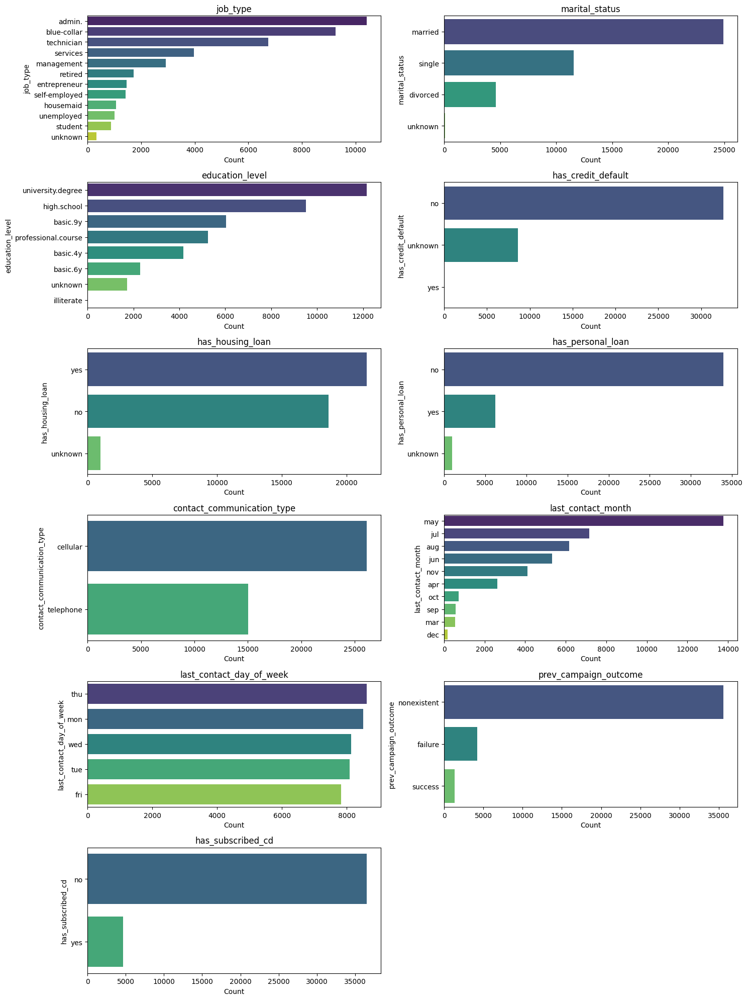

In [59]:

# Select categorical columns
categorical_cols = bank_df.select_dtypes(include='object').columns

# Plot count plots for categorical columns
plt.figure(figsize=(15, 20))
for i, col in enumerate(categorical_cols):
    plt.subplot(6, 2, i + 1) # Adjust subplot grid as needed
    sns.countplot(y=bank_df[col], order=bank_df[col].value_counts().index, palette='viridis')
    plt.title(col)
    plt.xlabel("Count")
    plt.ylabel(col)
plt.tight_layout()
plt.savefig('images/count_plots.png')
plt.show()

Based on the count plots for the categorical columns, here's an analysis of each feature:

* **job_type:** The most frequent job types are 'admin.' and 'blue-collar', followed by 'technician' and 'services'. There's a long tail of less frequent job types, including 'unknown'.
* **marital_status:** 'married' is the most common marital status, significantly more frequent than 'single' and 'divorced'. The 'unknown' category is present but relatively small.
* **education_level:** 'university.degree' is the most frequent education level, followed by 'high.school' and 'basic.9y'. There's a distribution across several basic and professional levels, with a small number of 'illiterate' and 'unknown' entries.
* **has_credit_default:** The vast majority of clients have 'no' credit in default. There's a significant number of 'unknown' values and only a very small number of clients with 'yes'. This feature is highly imbalanced.
* **has_housing_loan:** There's a fairly even split between clients with 'yes' and 'no' housing loans, with a small number of 'unknown' values.
* **has_personal_loan:** Most clients have 'no' personal loan, with a smaller proportion having 'yes' and a small number of 'unknown' values.
* **contact_communication_type:** 'cellular' is the dominant contact type, used much more frequently than 'telephone'.
* **last_contact_month:** May is by far the most frequent month of last contact, followed by July and August. The other months have significantly fewer contacts.
* **last_contact_day_of_week:** The contact days are relatively evenly distributed across the week (Monday to Friday).
* **prev_campaign_outcome:** 'nonexistent' is the overwhelming outcome of the previous campaign, indicating that most clients were not contacted previously. 'failure' is the next most frequent, and 'success' is the least frequent outcome. This feature is highly imbalanced.
* **has_subscribed_cd (Target Variable):** This is a highly imbalanced target variable. The vast majority of clients did not subscribe to the term deposit ('no'), while a much smaller number did subscribe ('yes'). This class imbalance will be important to consider when building and evaluating classification models.

These analyses of the categorical features highlight the distribution of clients across different groups and reveal potential imbalances in some features, including the target variable. This information is crucial for subsequent data preprocessing and model selection steps.

**3.8.2 Bivariate**
Perform bivariate analysis on the dataset to understand the relationships between different features and the target variable has_subscribed_cd.



## Numerical-numerical relationships
Visualize the relationships between pairs of numerical features using a correlation matrix.


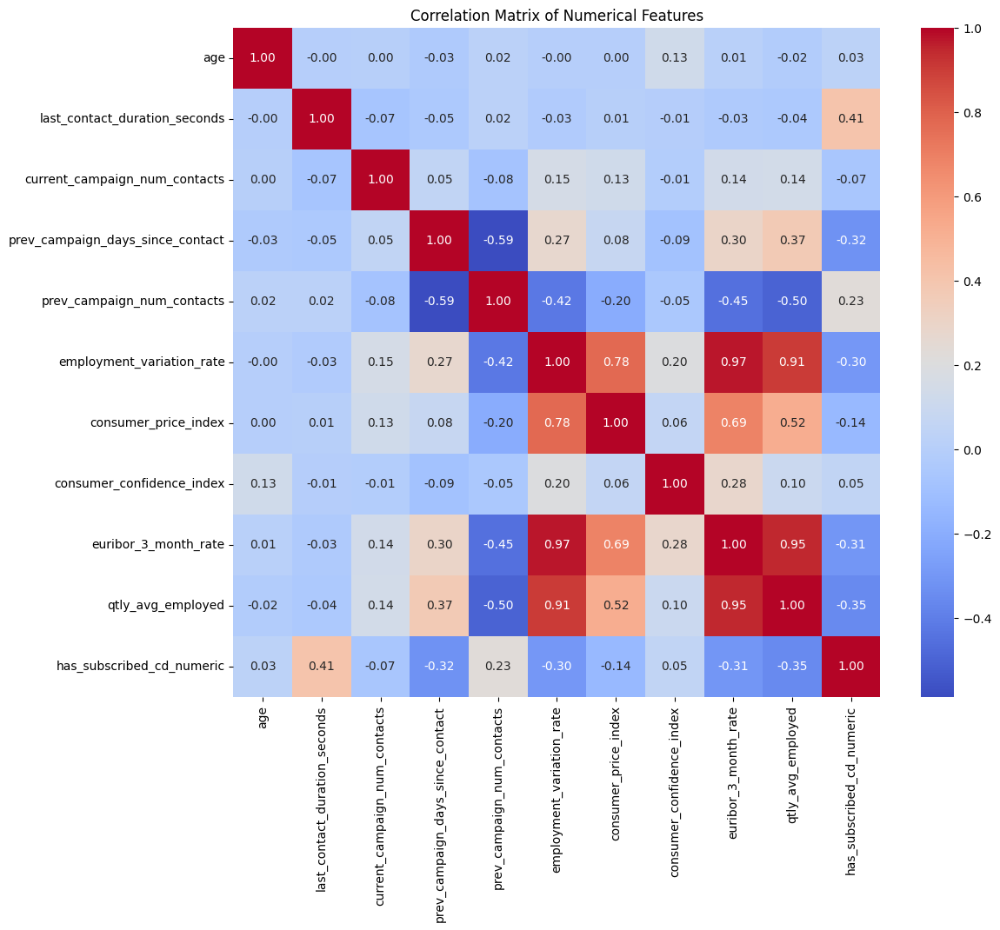

In [58]:
# Select only numerical columns
numerical_cols = bank_df.select_dtypes(include=np.number).columns

# Calculate the correlation matrix
correlation_matrix = bank_df[numerical_cols].corr()

# Generate a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.savefig('images/correlation_heatmap.png')
plt.show()

## Categorical-categorical relationships
Analyze the relationships between pairs of categorical features using cross-tabulations, stacked bar plots, or chi-squared tests.


In [ ]:
# Select categorical columns
categorical_cols = bank_df.select_dtypes(include='object').columns
print("Categorical columns selected.")

Categorical columns selected.


To analyze the relationships between pairs of categorical features, iterate through all possible pairs of categorical columns, create a cross-tabulation for each pair, and then generate stacked bar plots to visualize their distributions.


Analyzing relationship between 'job_type' and 'marital_status':
Cross-tabulation:


marital_status,divorced,married,single,unknown
job_type,,,,
admin.,1280,5250,3875,14
blue-collar,728,6686,1825,14
entrepreneur,179,1071,203,3
housemaid,161,777,119,3
management,331,2089,501,3
retired,348,1273,92,5
self-employed,133,904,379,5
services,532,2293,1136,6
student,9,41,824,1


<Figure size 1000x600 with 0 Axes>

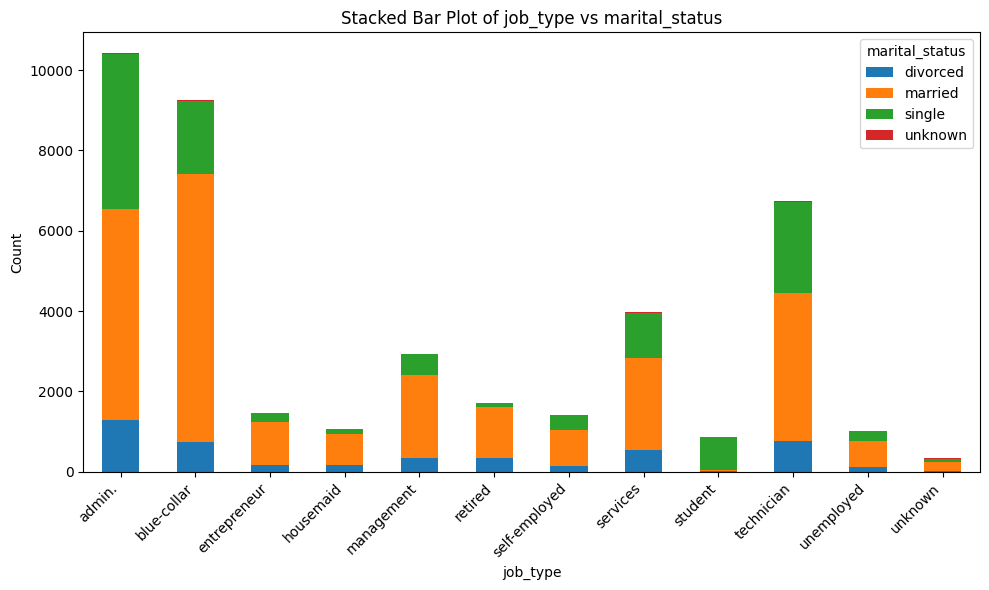


Analyzing relationship between 'job_type' and 'education_level':
Cross-tabulation:


education_level,basic.4y,basic.6y,basic.9y,high.school,illiterate,professional.course,university.degree,unknown
job_type,,,,,,,,
admin.,77,151,499,3329,1,363,5750,249
blue-collar,2318,1425,3623,878,8,453,94,454
entrepreneur,137,71,210,234,2,135,610,57
housemaid,474,77,94,174,1,59,139,42
management,100,85,166,298,0,89,2063,123
retired,597,75,145,276,3,241,284,97
self-employed,93,25,220,118,3,168,765,29
services,132,226,388,2680,0,218,173,150
student,26,13,99,357,0,43,170,167


<Figure size 1000x600 with 0 Axes>

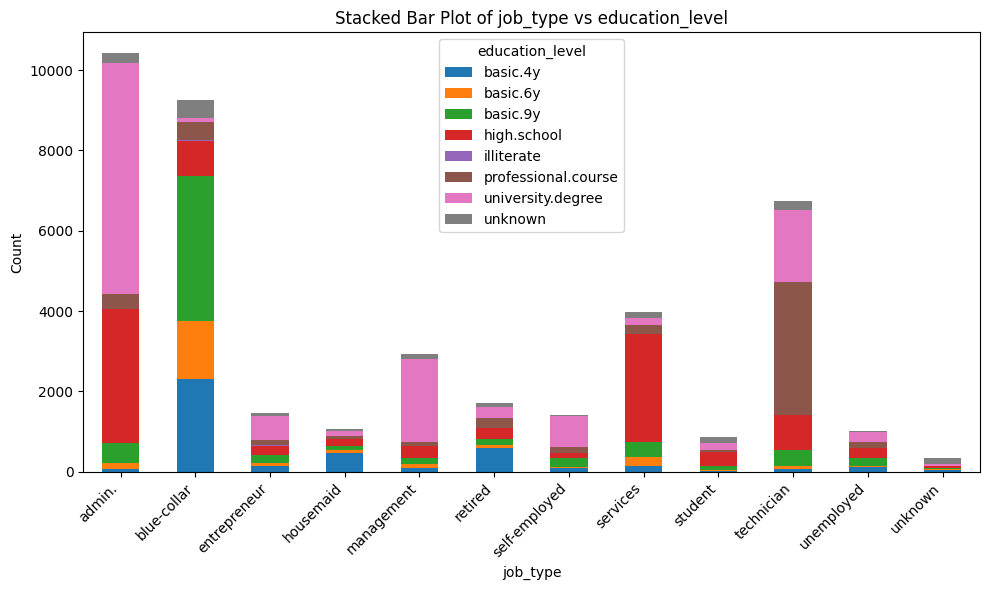


Analyzing relationship between 'job_type' and 'has_credit_default':
Cross-tabulation:


has_credit_default,no,unknown,yes
job_type,,,
admin.,9126,1293,0
blue-collar,6087,3166,0
entrepreneur,1155,301,0
housemaid,741,319,0
management,2466,458,0
retired,1325,393,0
self-employed,1139,282,0
services,3052,915,0
student,771,104,0


<Figure size 1000x600 with 0 Axes>

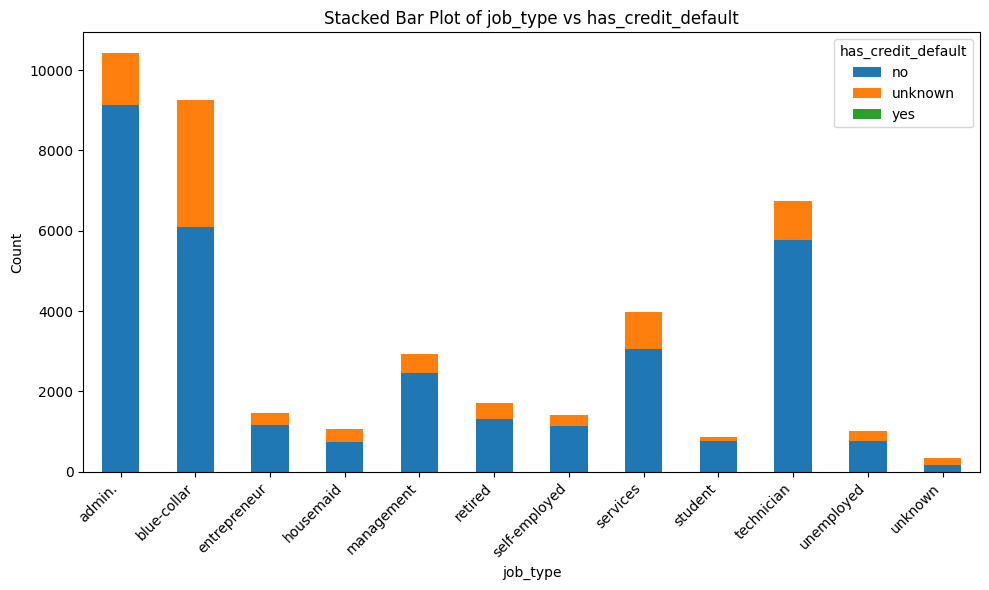


Analyzing relationship between 'job_type' and 'has_housing_loan':
Cross-tabulation:


has_housing_loan,no,unknown,yes
job_type,,,
admin.,4634,227,5558
blue-collar,4303,240,4710
entrepreneur,641,36,779
housemaid,491,29,540
management,1363,71,1490
retired,782,44,892
self-employed,641,40,740
services,1817,101,2049
student,381,23,471


<Figure size 1000x600 with 0 Axes>

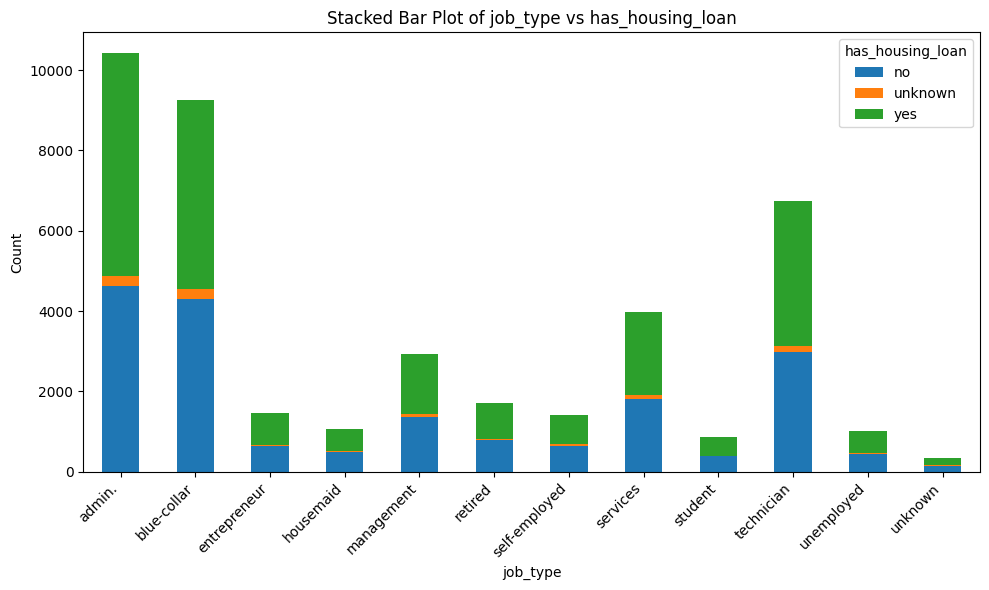


Analyzing relationship between 'job_type' and 'has_personal_loan':
Cross-tabulation:


has_personal_loan,no,unknown,yes
job_type,,,
admin.,8482,227,1710
blue-collar,7647,240,1366
entrepreneur,1214,36,206
housemaid,877,29,154
management,2414,71,439
retired,1434,44,240
self-employed,1186,40,195
services,3265,101,601
student,710,23,142


<Figure size 1000x600 with 0 Axes>

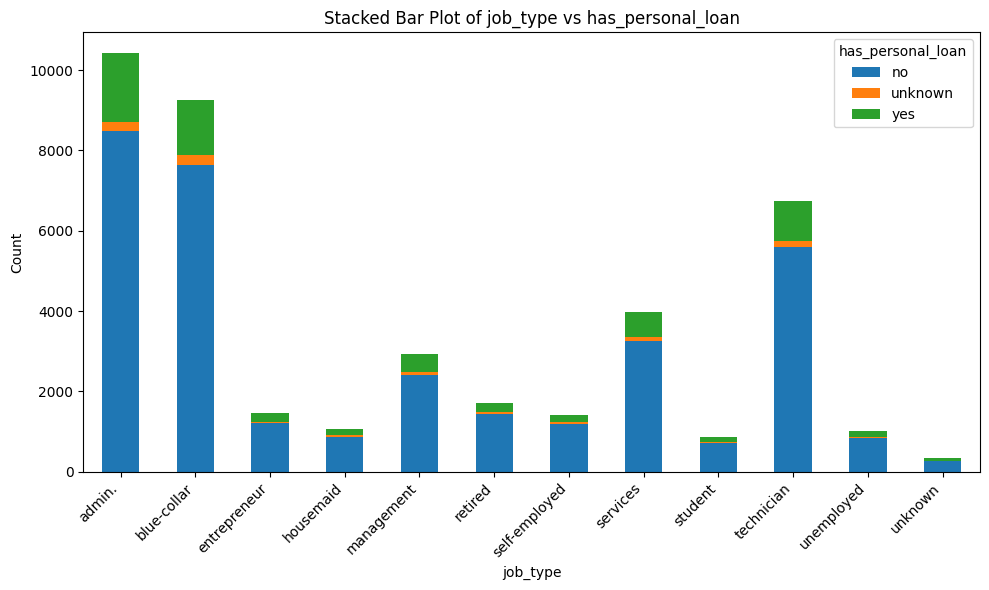


Analyzing relationship between 'job_type' and 'contact_communication_type':
Cross-tabulation:


contact_communication_type,cellular,telephone
job_type,,
admin.,7123,3296
blue-collar,5090,4163
entrepreneur,855,601
housemaid,640,420
management,1902,1022
retired,1231,487
self-employed,893,528
services,2309,1658
student,671,204


<Figure size 1000x600 with 0 Axes>

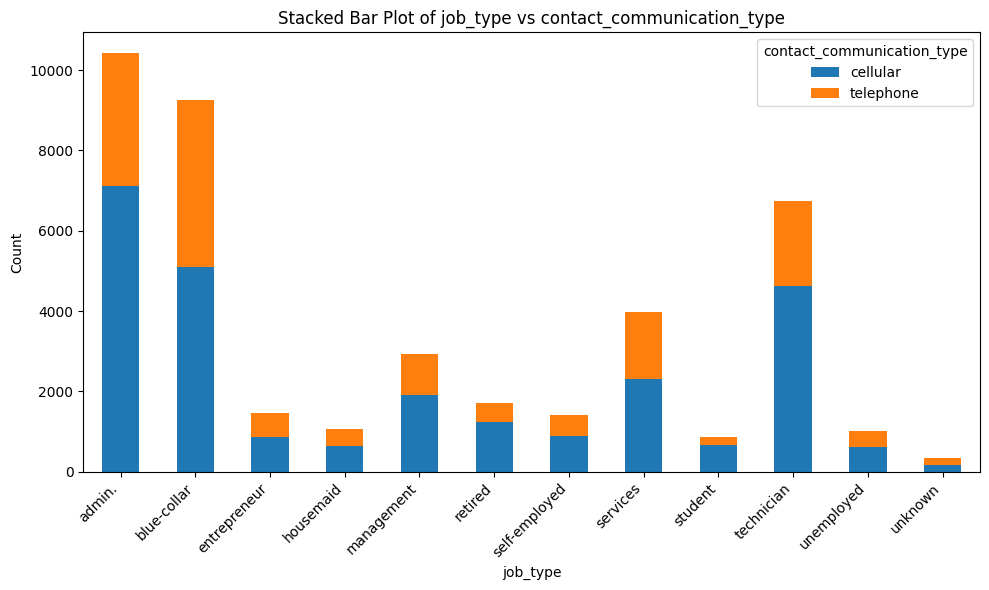


Analyzing relationship between 'job_type' and 'last_contact_month':
Cross-tabulation:


last_contact_month,apr,aug,dec,jul,jun,mar,may,nov,oct,sep
job_type,,,,,,,,,,
admin.,644,2039,50,1814,1238,169,3018,1084,197,166
blue-collar,565,582,12,1789,1385,50,4198,602,51,19
entrepreneur,109,74,1,273,217,2,484,269,15,12
housemaid,47,208,10,239,136,6,296,87,19,12
management,195,357,12,399,352,42,909,561,51,46
retired,160,342,33,270,173,64,329,136,125,86
self-employed,97,212,6,220,204,25,418,198,21,20
services,280,279,2,790,542,25,1666,321,33,29
student,104,116,20,105,101,41,232,54,53,49


<Figure size 1000x600 with 0 Axes>

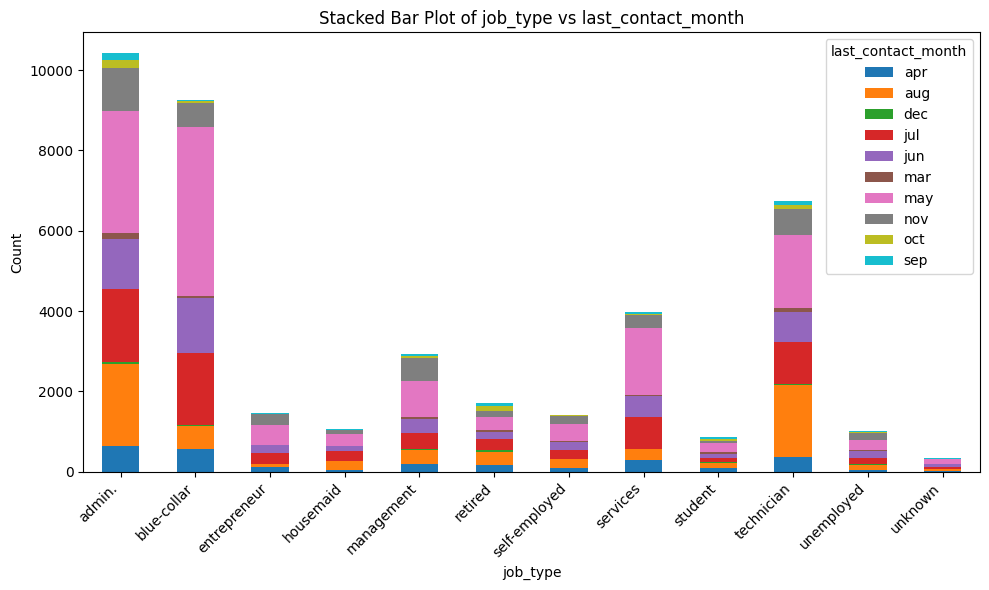


Analyzing relationship between 'job_type' and 'last_contact_day_of_week':
Cross-tabulation:


last_contact_day_of_week,fri,mon,thu,tue,wed
job_type,,,,,
admin.,2049,2149,2152,2033,2036
blue-collar,1781,1845,1887,1771,1969
entrepreneur,271,322,322,264,277
housemaid,182,228,198,238,214
management,531,640,587,581,585
retired,333,348,316,376,345
self-employed,279,310,336,255,241
services,750,834,830,792,761
student,162,177,197,172,167


<Figure size 1000x600 with 0 Axes>

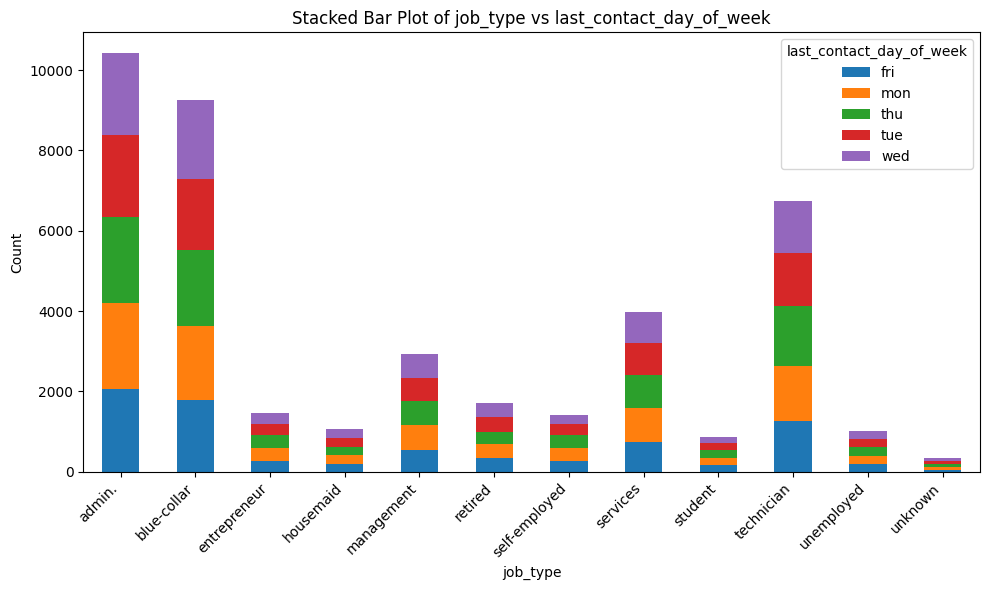


Analyzing relationship between 'job_type' and 'prev_campaign_outcome':
Cross-tabulation:


prev_campaign_outcome,failure,nonexistent,success
job_type,,,
admin.,1091,8900,428
blue-collar,886,8248,119
entrepreneur,154,1277,25
housemaid,74,948,38
management,331,2498,95
retired,230,1330,158
self-employed,145,1246,30
services,448,3449,70
student,163,594,118


<Figure size 1000x600 with 0 Axes>

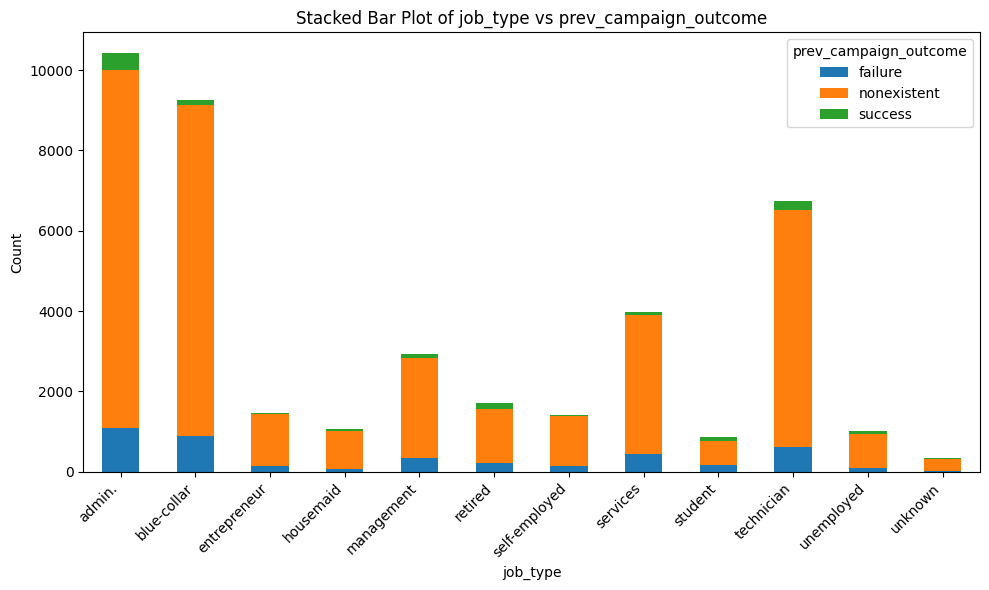


Analyzing relationship between 'job_type' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
job_type,,
admin.,9068,1351
blue-collar,8615,638
entrepreneur,1332,124
housemaid,954,106
management,2596,328
retired,1284,434
self-employed,1272,149
services,3644,323
student,600,275


<Figure size 1000x600 with 0 Axes>

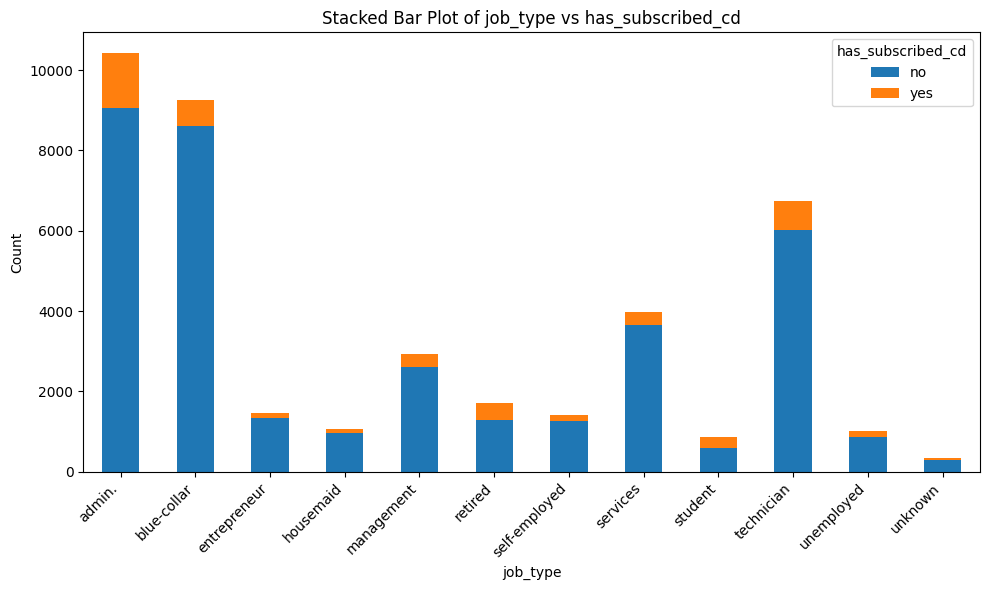


Analyzing relationship between 'marital_status' and 'education_level':
Cross-tabulation:


education_level,basic.4y,basic.6y,basic.9y,high.school,illiterate,professional.course,university.degree,unknown
marital_status,,,,,,,,
divorced,489,182,565,1192,2,657,1337,187
married,3228,1766,4156,5157,15,3155,6391,1053
single,453,337,1316,3149,1,1422,4405,481
unknown,6,6,8,14,0,6,31,9


<Figure size 1000x600 with 0 Axes>

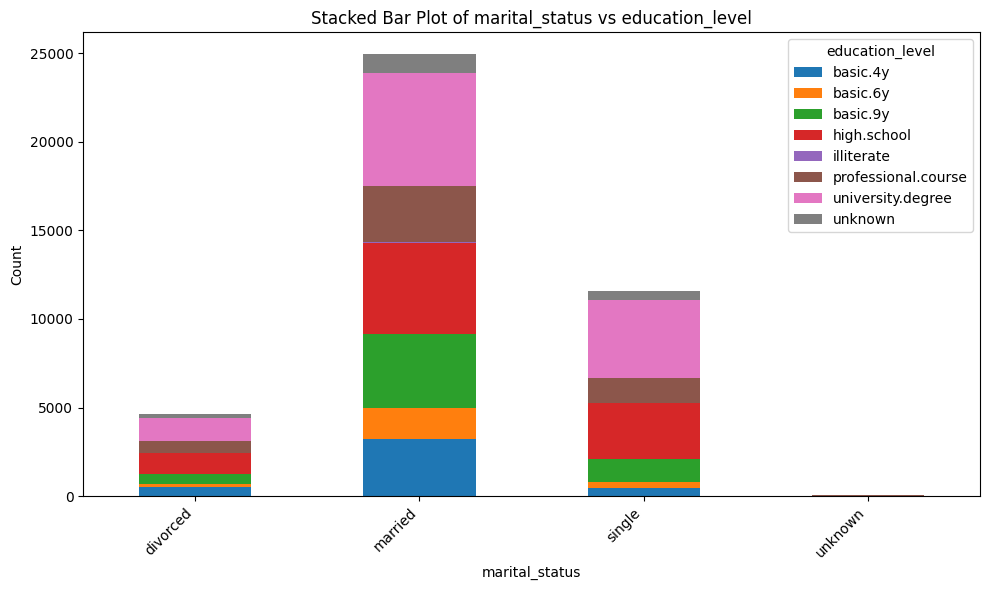


Analyzing relationship between 'marital_status' and 'has_credit_default':
Cross-tabulation:


has_credit_default,no,unknown,yes
marital_status,,,
divorced,3780,831,0
married,18649,6269,3
single,10079,1485,0
unknown,69,11,0


<Figure size 1000x600 with 0 Axes>

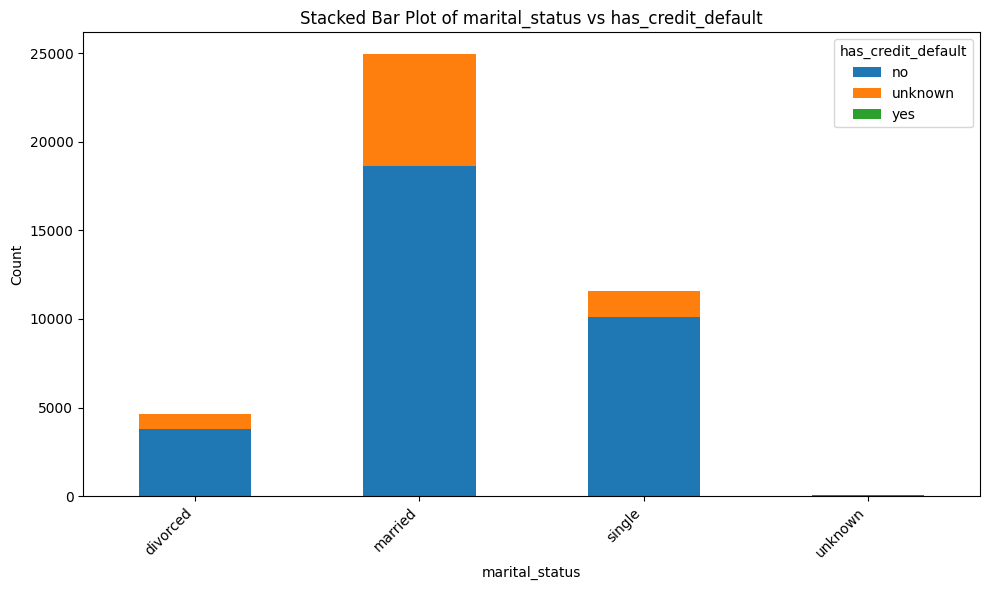


Analyzing relationship between 'marital_status' and 'has_housing_loan':
Cross-tabulation:


has_housing_loan,no,unknown,yes
marital_status,,,
divorced,2092,121,2398
married,11384,588,12949
single,5095,280,6189
unknown,44,1,35


<Figure size 1000x600 with 0 Axes>

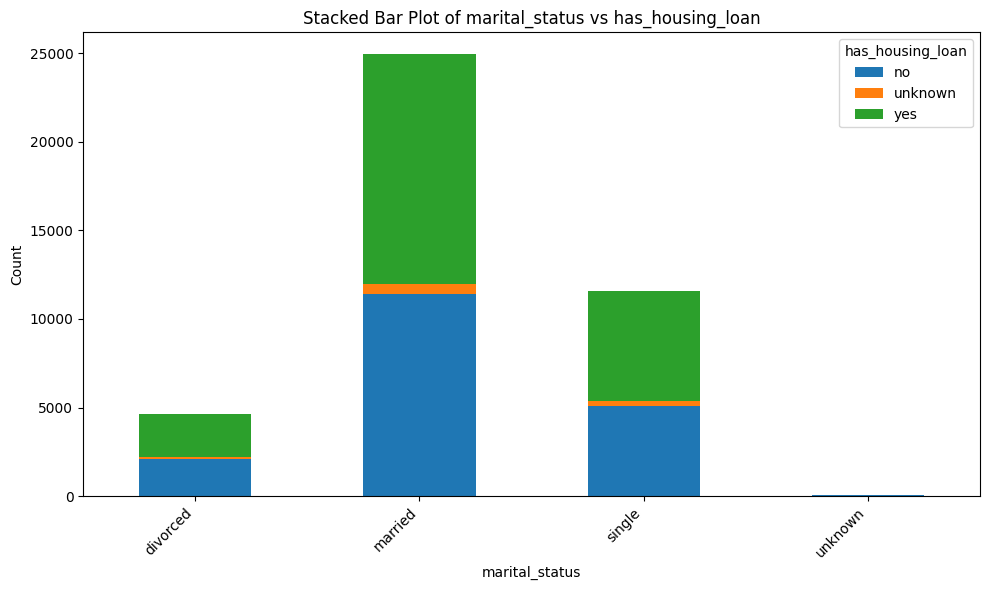


Analyzing relationship between 'marital_status' and 'has_personal_loan':
Cross-tabulation:


has_personal_loan,no,unknown,yes
marital_status,,,
divorced,3815,121,675
married,20560,588,3773
single,9496,280,1788
unknown,67,1,12


<Figure size 1000x600 with 0 Axes>

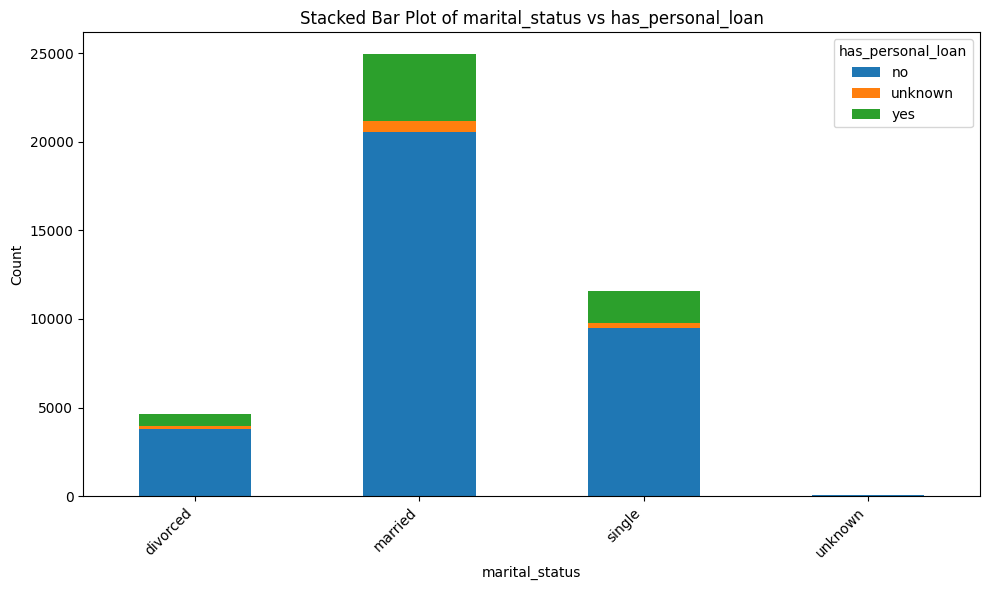


Analyzing relationship between 'marital_status' and 'contact_communication_type':
Cross-tabulation:


contact_communication_type,cellular,telephone
marital_status,,
divorced,2907,1704
married,15201,9720
single,7974,3590
unknown,53,27


<Figure size 1000x600 with 0 Axes>

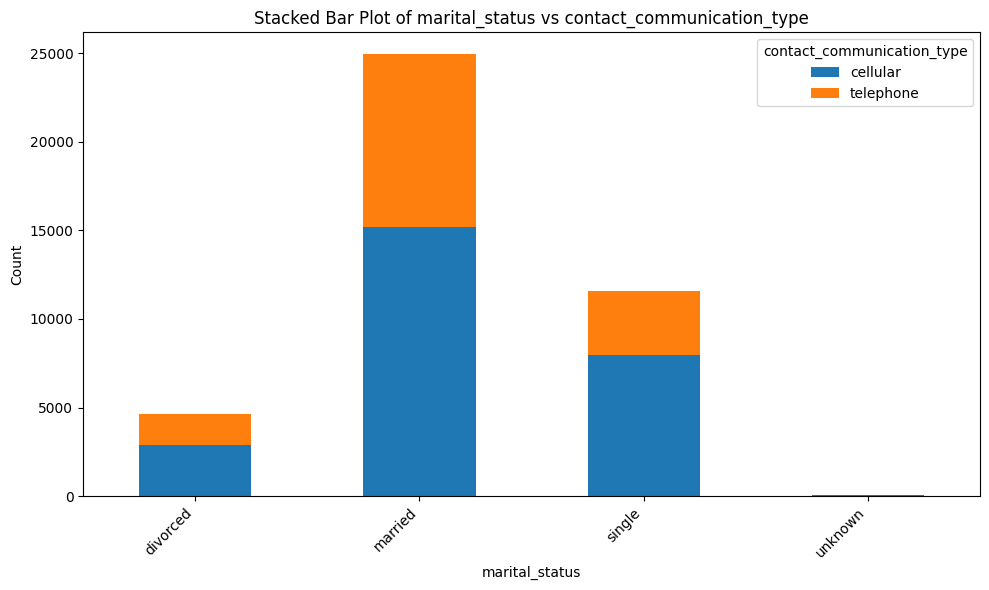


Analyzing relationship between 'marital_status' and 'last_contact_month':
Cross-tabulation:


last_contact_month,apr,aug,dec,jul,jun,mar,may,nov,oct,sep
marital_status,,,,,,,,,,
divorced,311,571,19,925,570,60,1488,550,67,50
married,1512,4010,114,3946,3350,234,8512,2513,399,331
single,805,1585,49,2289,1386,249,3734,1030,248,189
unknown,3,10,0,9,12,3,33,7,3,0


<Figure size 1000x600 with 0 Axes>

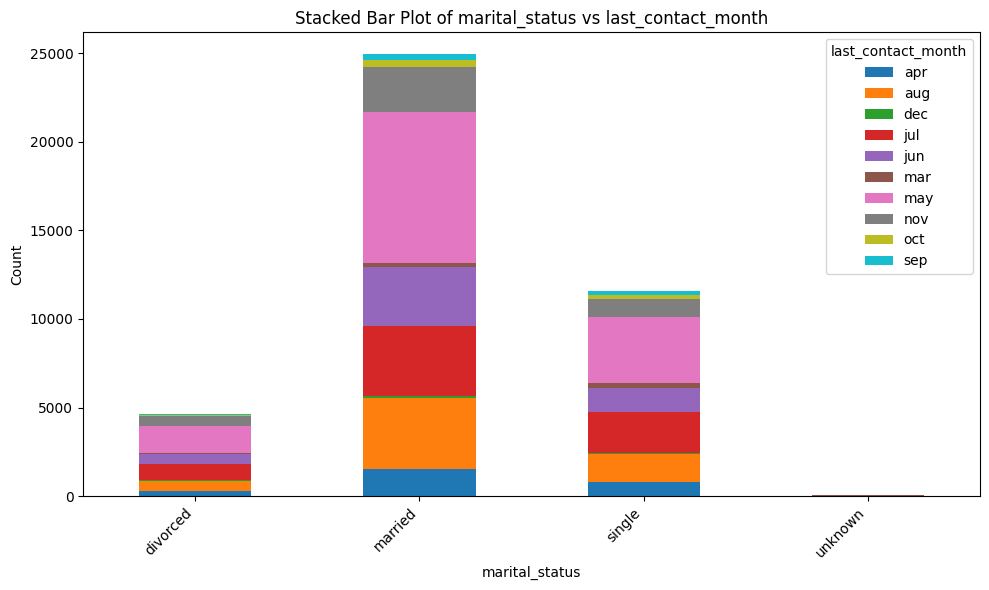


Analyzing relationship between 'marital_status' and 'last_contact_day_of_week':
Cross-tabulation:


last_contact_day_of_week,fri,mon,thu,tue,wed
marital_status,,,,,
divorced,848,986,914,961,902
married,4790,5193,5144,4904,4890
single,2176,2314,2536,2210,2328
unknown,12,19,24,11,14


<Figure size 1000x600 with 0 Axes>

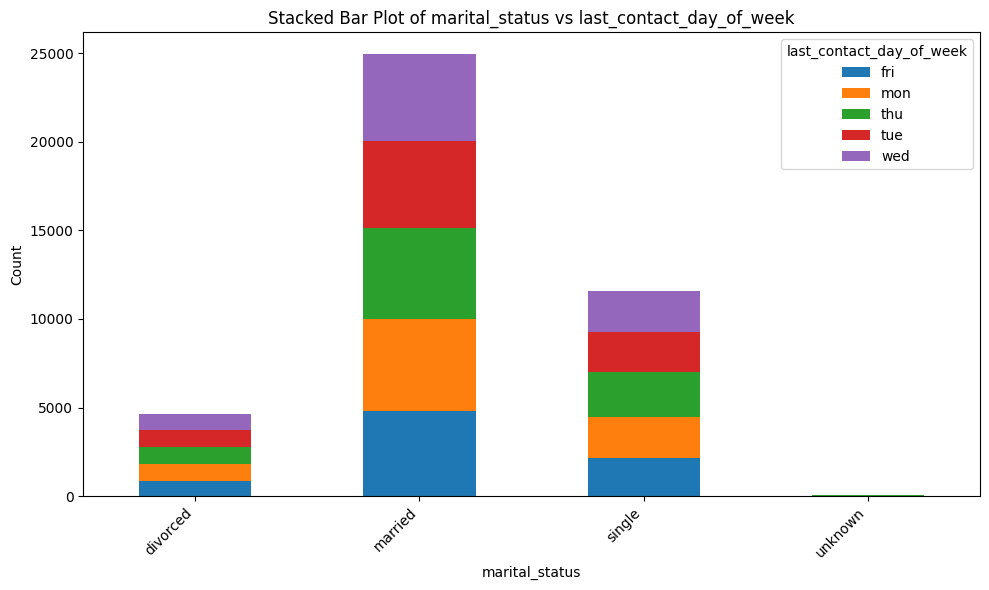


Analyzing relationship between 'marital_status' and 'prev_campaign_outcome':
Cross-tabulation:


prev_campaign_outcome,failure,nonexistent,success
marital_status,,,
divorced,502,3980,129
married,2384,21814,723
single,1353,9695,516
unknown,13,62,5


<Figure size 1000x600 with 0 Axes>

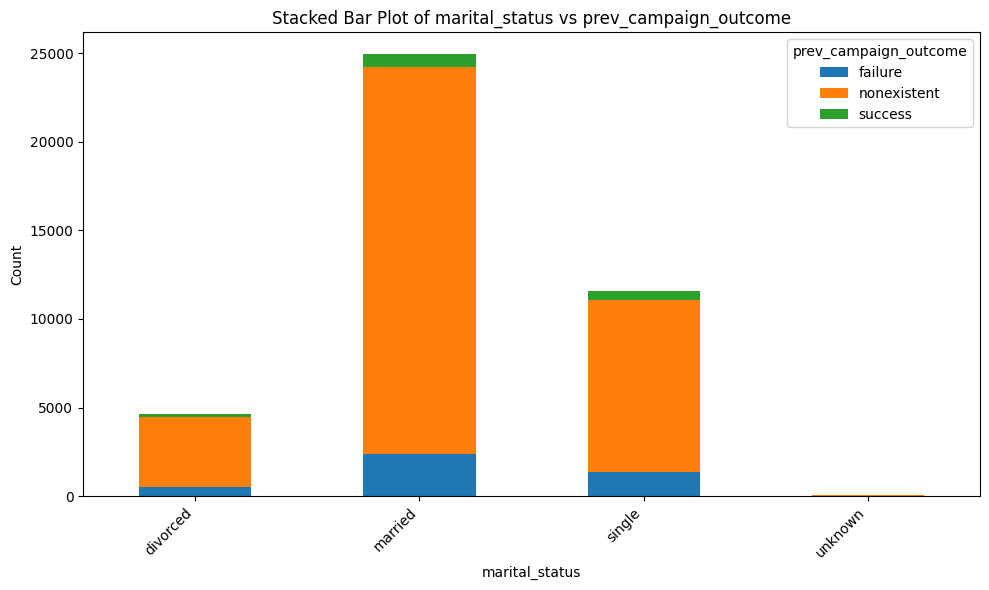


Analyzing relationship between 'marital_status' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
marital_status,,
divorced,4135,476
married,22390,2531
single,9944,1620
unknown,68,12


<Figure size 1000x600 with 0 Axes>

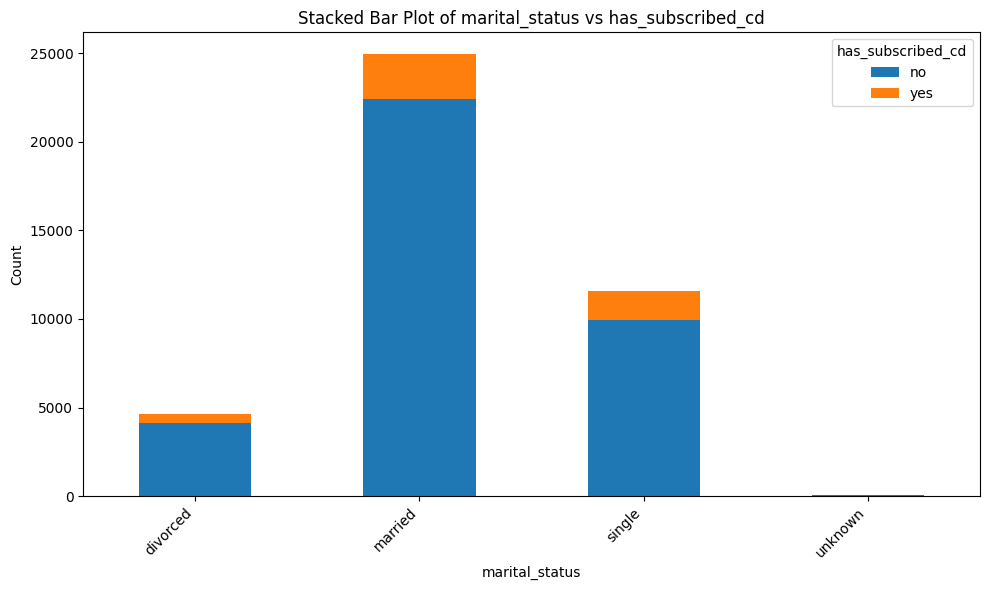


Analyzing relationship between 'education_level' and 'has_credit_default':
Cross-tabulation:


has_credit_default,no,unknown,yes
education_level,,,
basic.4y,2477,1699,0
basic.6y,1440,851,0
basic.9y,4418,1627,0
high.school,7902,1609,1
illiterate,11,7,0
professional.course,4433,805,2
university.degree,10714,1450,0
unknown,1182,548,0


<Figure size 1000x600 with 0 Axes>

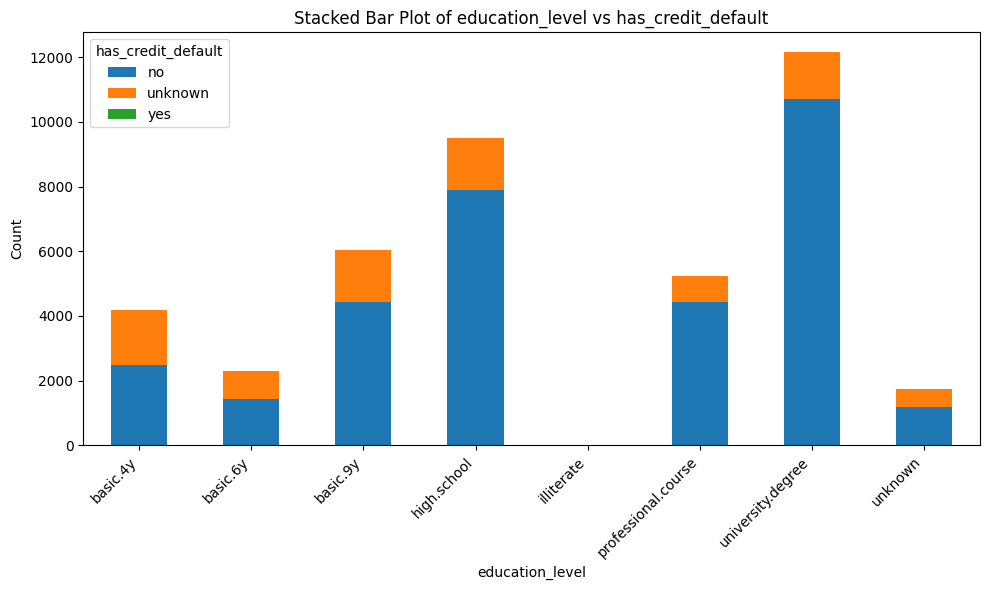


Analyzing relationship between 'education_level' and 'has_housing_loan':
Cross-tabulation:


has_housing_loan,no,unknown,yes
education_level,,,
basic.4y,1955,117,2104
basic.6y,1069,60,1162
basic.9y,2743,151,3151
high.school,4362,220,4930
illiterate,8,0,10
professional.course,2279,125,2836
university.degree,5384,277,6503
unknown,815,40,875


<Figure size 1000x600 with 0 Axes>

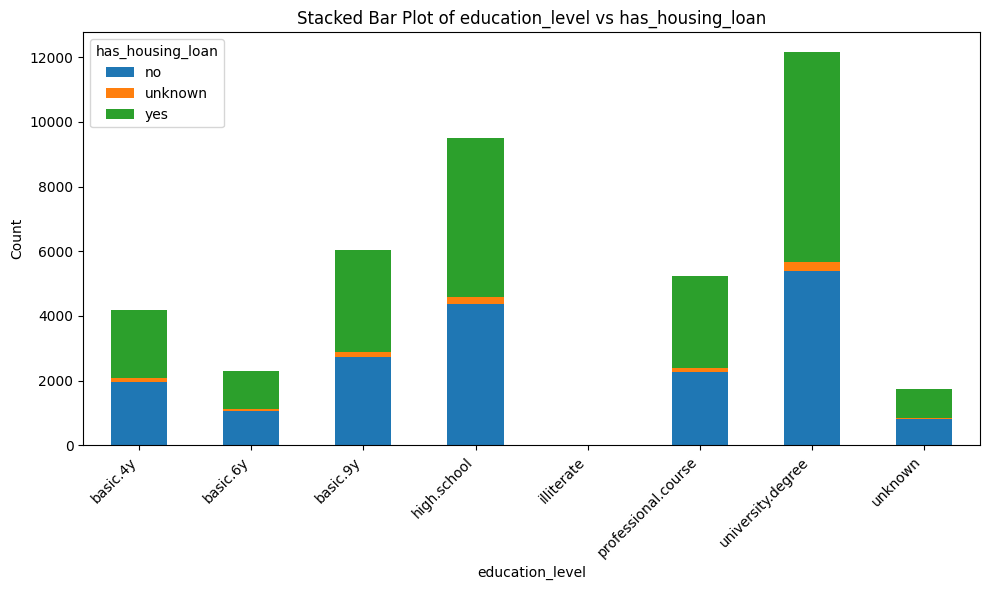


Analyzing relationship between 'education_level' and 'has_personal_loan':
Cross-tabulation:


has_personal_loan,no,unknown,yes
education_level,,,
basic.4y,3435,117,624
basic.6y,1901,60,330
basic.9y,5011,151,883
high.school,7849,220,1443
illiterate,15,0,3
professional.course,4322,125,793
university.degree,9957,277,1930
unknown,1448,40,242


<Figure size 1000x600 with 0 Axes>

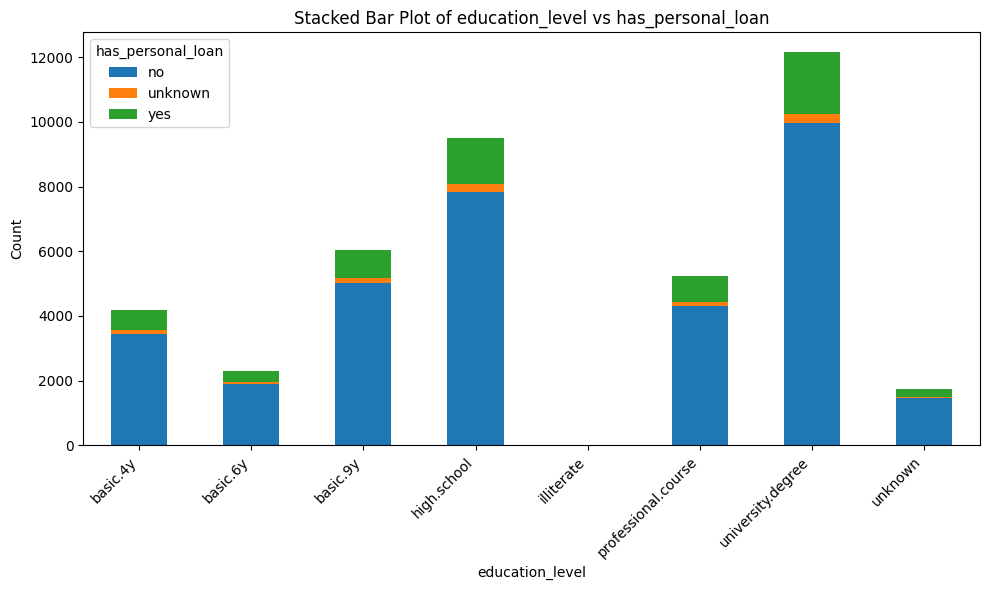


Analyzing relationship between 'education_level' and 'contact_communication_type':
Cross-tabulation:


contact_communication_type,cellular,telephone
education_level,,
basic.4y,2350,1826
basic.6y,1247,1044
basic.9y,3452,2593
high.school,5925,3587
illiterate,15,3
professional.course,3475,1765
university.degree,8654,3510
unknown,1017,713


<Figure size 1000x600 with 0 Axes>

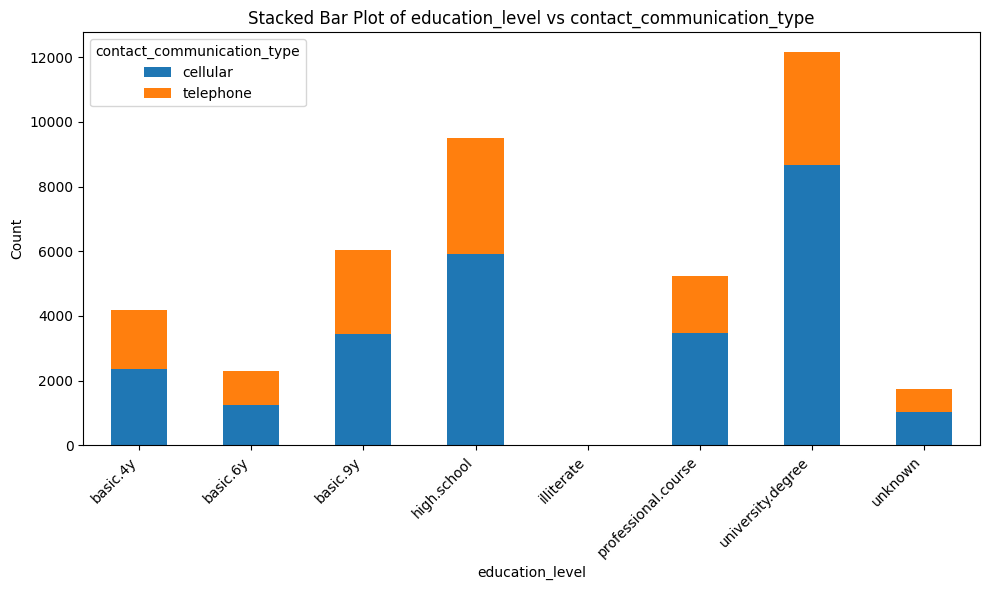


Analyzing relationship between 'education_level' and 'last_contact_month':
Cross-tabulation:


last_contact_month,apr,aug,dec,jul,jun,mar,may,nov,oct,sep
education_level,,,,,,,,,,
basic.4y,267,512,20,744,626,50,1519,293,93,52
basic.6y,128,141,0,439,337,11,1036,161,22,16
basic.9y,380,372,16,1165,836,42,2634,525,50,25
high.school,617,971,40,1859,1252,90,3515,894,167,107
illiterate,2,5,0,5,0,0,3,3,0,0
professional.course,313,1144,22,800,632,84,1531,522,101,91
university.degree,795,2836,70,1784,1380,236,2998,1584,253,228
unknown,129,195,14,373,255,33,531,118,31,51


<Figure size 1000x600 with 0 Axes>

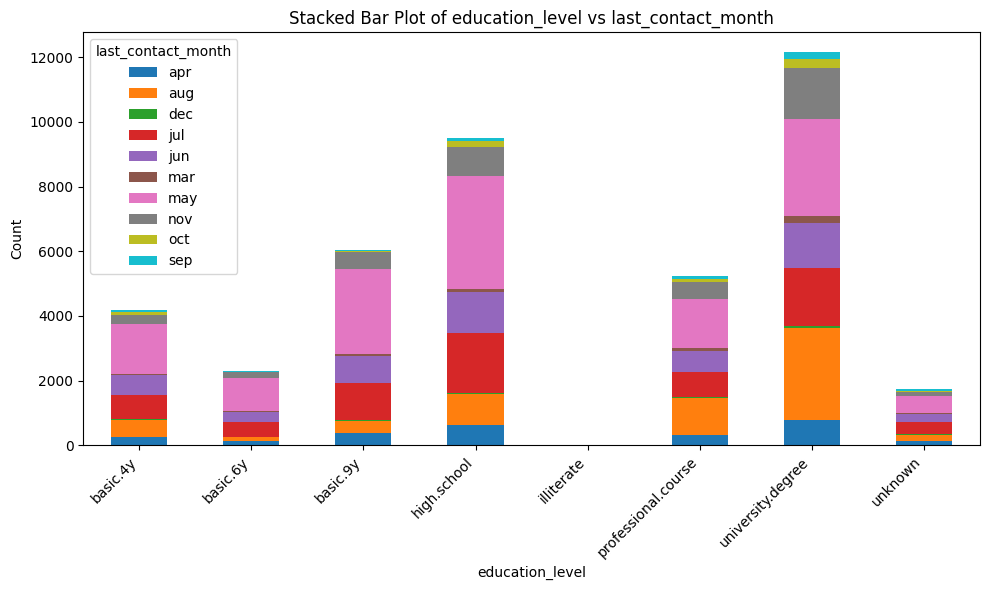


Analyzing relationship between 'education_level' and 'last_contact_day_of_week':
Cross-tabulation:


last_contact_day_of_week,fri,mon,thu,tue,wed
education_level,,,,,
basic.4y,738,839,861,902,836
basic.6y,422,423,485,462,499
basic.9y,1187,1244,1236,1111,1267
high.school,1855,2036,1851,1873,1897
illiterate,4,1,6,5,2
professional.course,968,1052,1155,1080,985
university.degree,2270,2571,2657,2305,2361
unknown,382,346,367,348,287


<Figure size 1000x600 with 0 Axes>

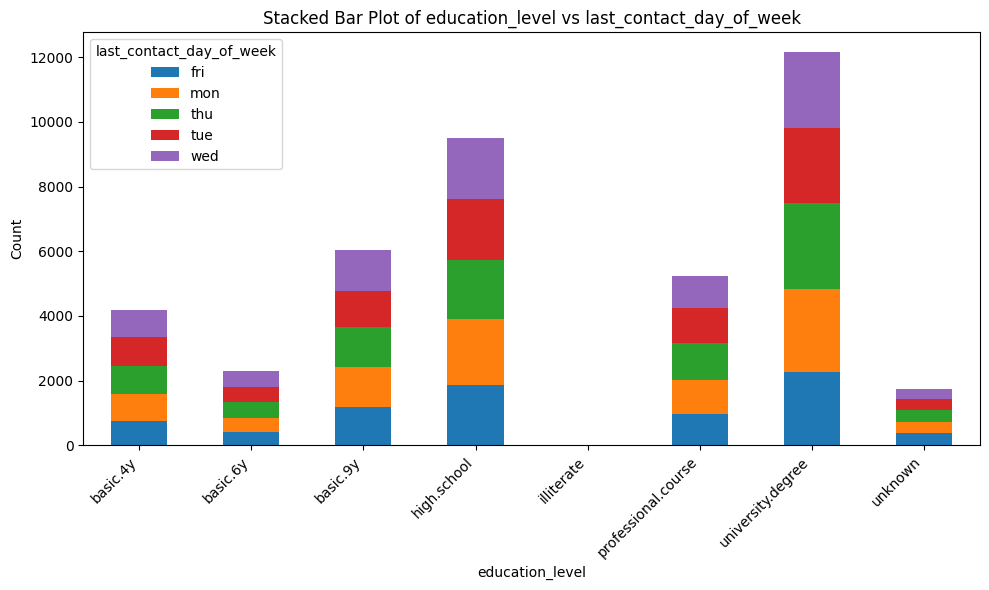


Analyzing relationship between 'education_level' and 'prev_campaign_outcome':
Cross-tabulation:


prev_campaign_outcome,failure,nonexistent,success
education_level,,,
basic.4y,354,3696,126
basic.6y,218,2033,40
basic.9y,630,5304,111
high.school,1119,8099,294
illiterate,1,16,1
professional.course,503,4554,183
university.degree,1242,10389,533
unknown,185,1460,85


<Figure size 1000x600 with 0 Axes>

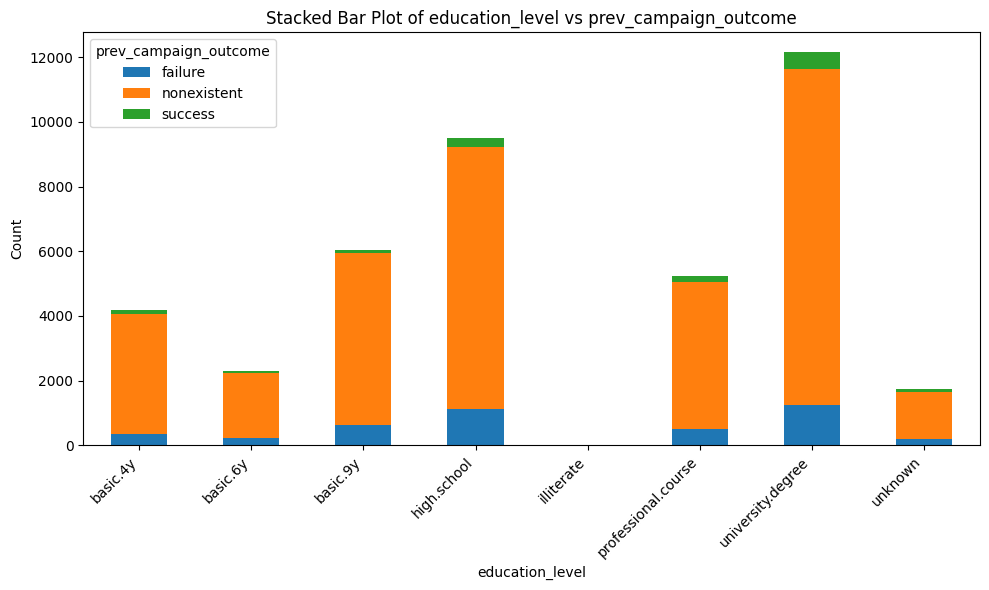


Analyzing relationship between 'education_level' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
education_level,,
basic.4y,3748,428
basic.6y,2103,188
basic.9y,5572,473
high.school,8481,1031
illiterate,14,4
professional.course,4645,595
university.degree,10495,1669
unknown,1479,251


<Figure size 1000x600 with 0 Axes>

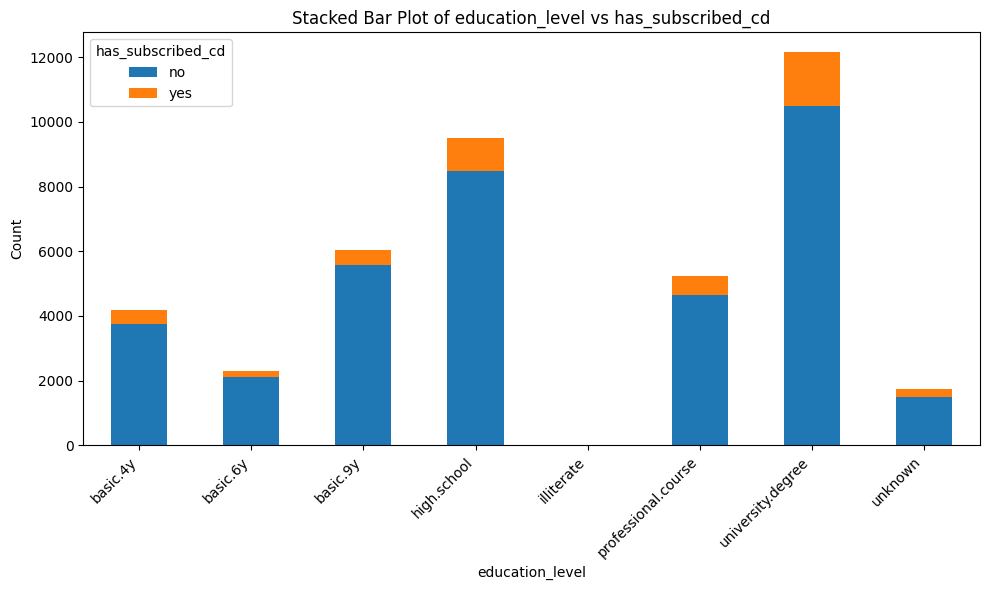


Analyzing relationship between 'has_credit_default' and 'has_housing_loan':
Cross-tabulation:


has_housing_loan,no,unknown,yes
has_credit_default,,,
no,14608,763,17206
unknown,4005,227,4364
yes,2,0,1


<Figure size 1000x600 with 0 Axes>

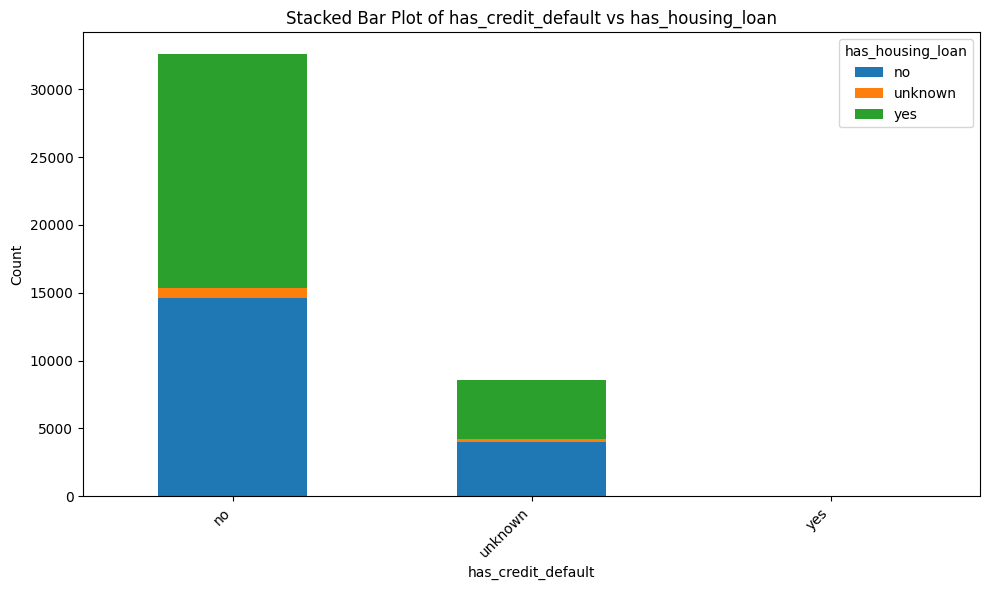


Analyzing relationship between 'has_credit_default' and 'has_personal_loan':
Cross-tabulation:


has_personal_loan,no,unknown,yes
has_credit_default,,,
no,26838,763,4976
unknown,7097,227,1272
yes,3,0,0


<Figure size 1000x600 with 0 Axes>

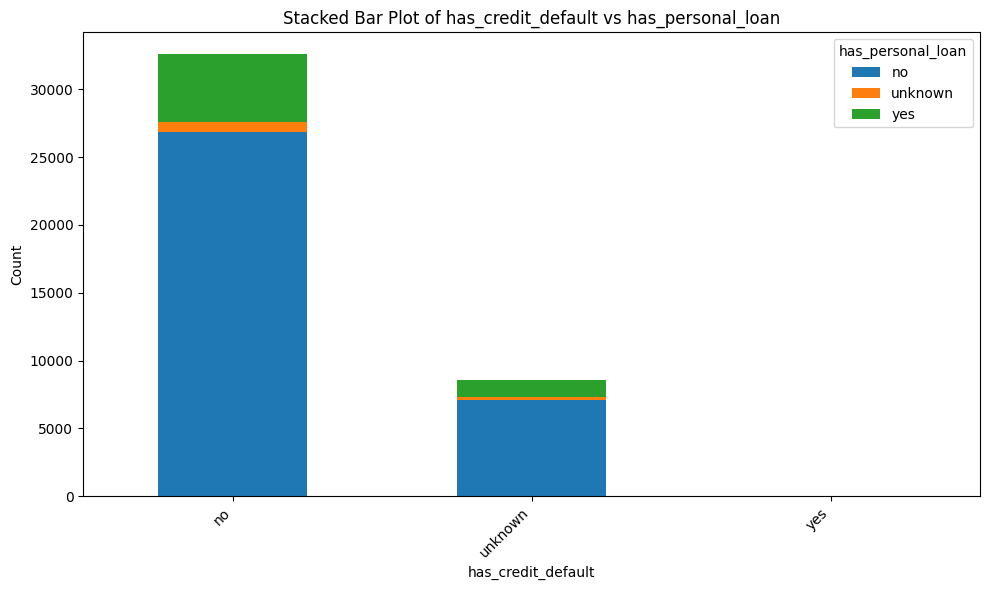


Analyzing relationship between 'has_credit_default' and 'contact_communication_type':
Cross-tabulation:


contact_communication_type,cellular,telephone
has_credit_default,,
no,21769,10808
unknown,4363,4233
yes,3,0


<Figure size 1000x600 with 0 Axes>

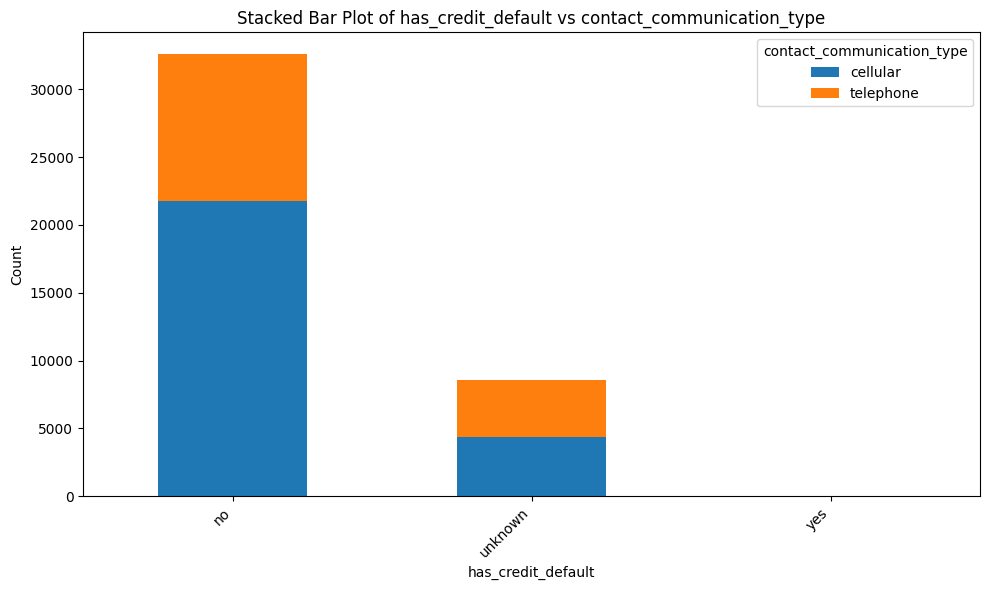


Analyzing relationship between 'has_credit_default' and 'last_contact_month':
Cross-tabulation:


last_contact_month,apr,aug,dec,jul,jun,mar,may,nov,oct,sep
has_credit_default,,,,,,,,,,
no,2282,4938,176,5432,3926,530,10362,3674,699,558
unknown,349,1236,6,1737,1392,16,3405,425,18,12
yes,0,2,0,0,0,0,0,1,0,0


<Figure size 1000x600 with 0 Axes>

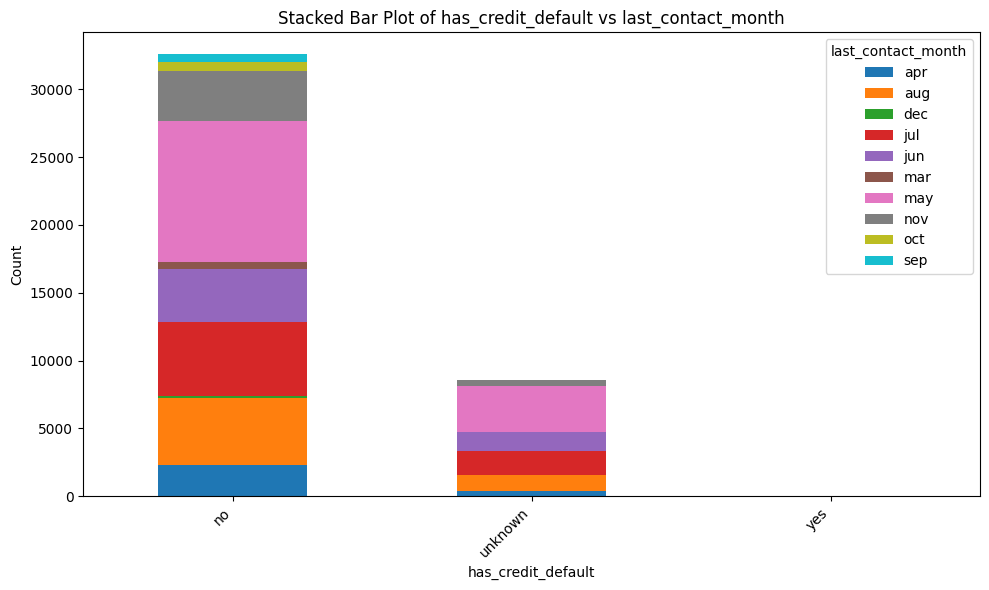


Analyzing relationship between 'has_credit_default' and 'last_contact_day_of_week':
Cross-tabulation:


last_contact_day_of_week,fri,mon,thu,tue,wed
has_credit_default,,,,,
no,6165,6687,6851,6375,6499
unknown,1661,1825,1767,1708,1635
yes,0,0,0,3,0


<Figure size 1000x600 with 0 Axes>

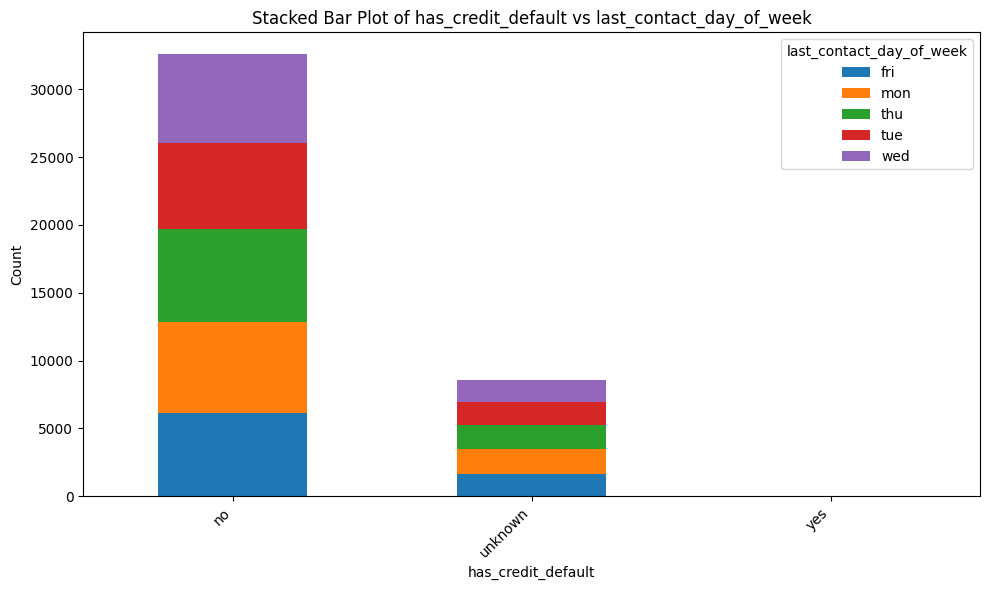


Analyzing relationship between 'has_credit_default' and 'prev_campaign_outcome':
Cross-tabulation:


prev_campaign_outcome,failure,nonexistent,success
has_credit_default,,,
no,3735,27528,1314
unknown,516,8021,59
yes,1,2,0


<Figure size 1000x600 with 0 Axes>

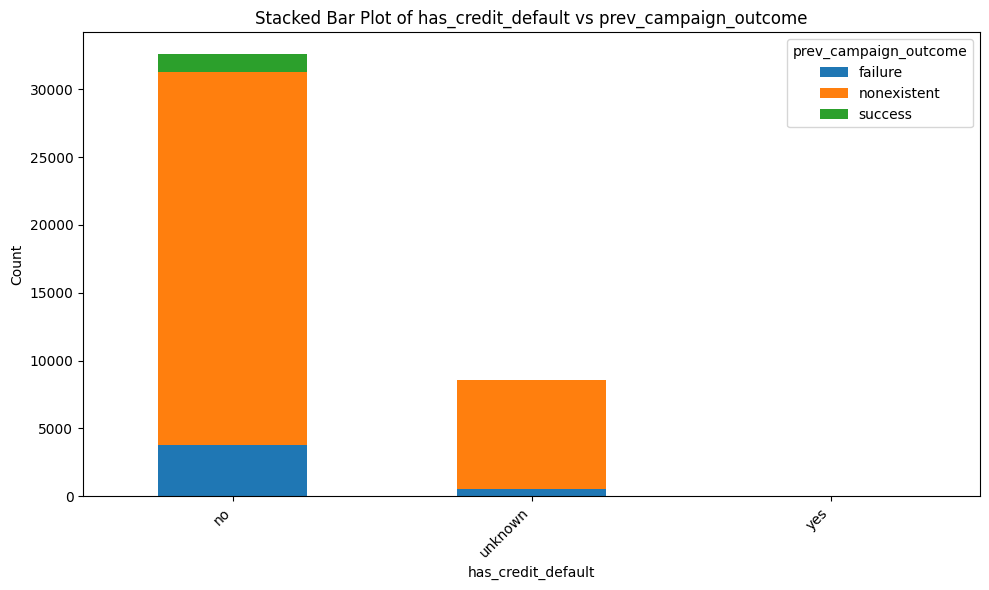


Analyzing relationship between 'has_credit_default' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
has_credit_default,,
no,28381,4196
unknown,8153,443
yes,3,0


<Figure size 1000x600 with 0 Axes>

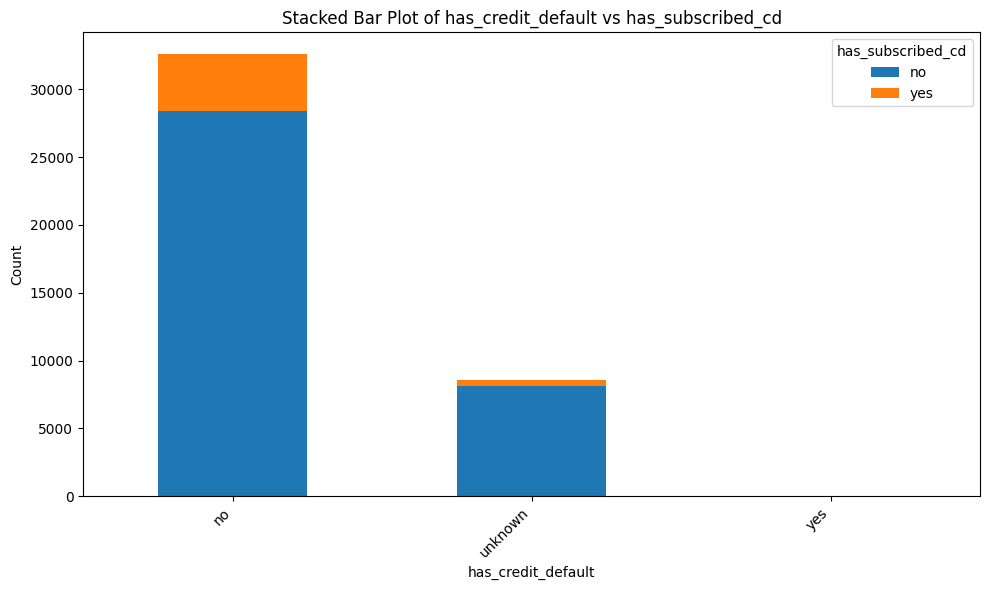


Analyzing relationship between 'has_housing_loan' and 'has_personal_loan':
Cross-tabulation:


has_personal_loan,no,unknown,yes
has_housing_loan,,,
no,16058,0,2557
unknown,0,990,0
yes,17880,0,3691


<Figure size 1000x600 with 0 Axes>

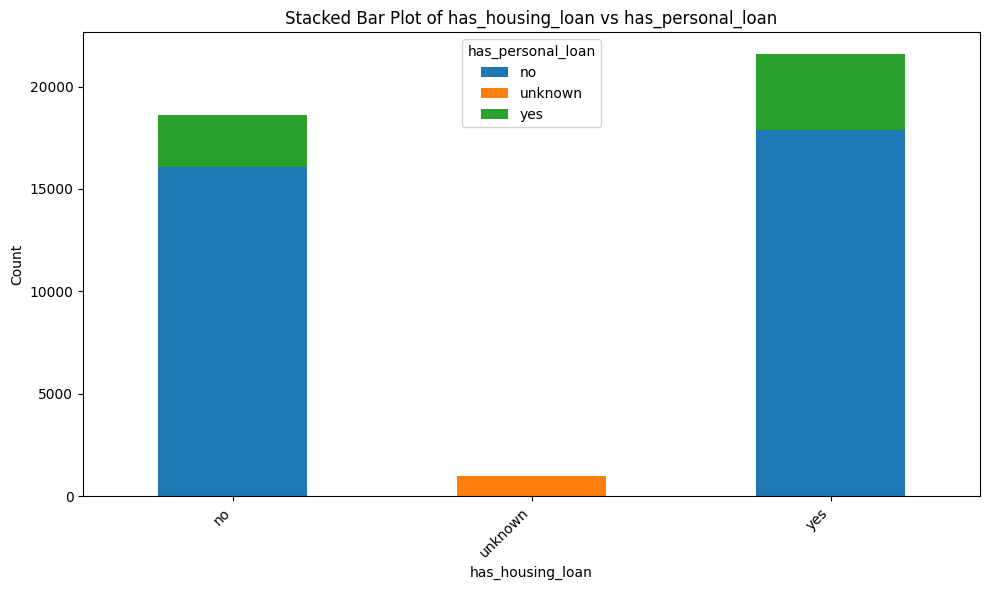


Analyzing relationship between 'has_housing_loan' and 'contact_communication_type':
Cross-tabulation:


contact_communication_type,cellular,telephone
has_housing_loan,,
no,11047,7568
unknown,561,429
yes,14527,7044


<Figure size 1000x600 with 0 Axes>

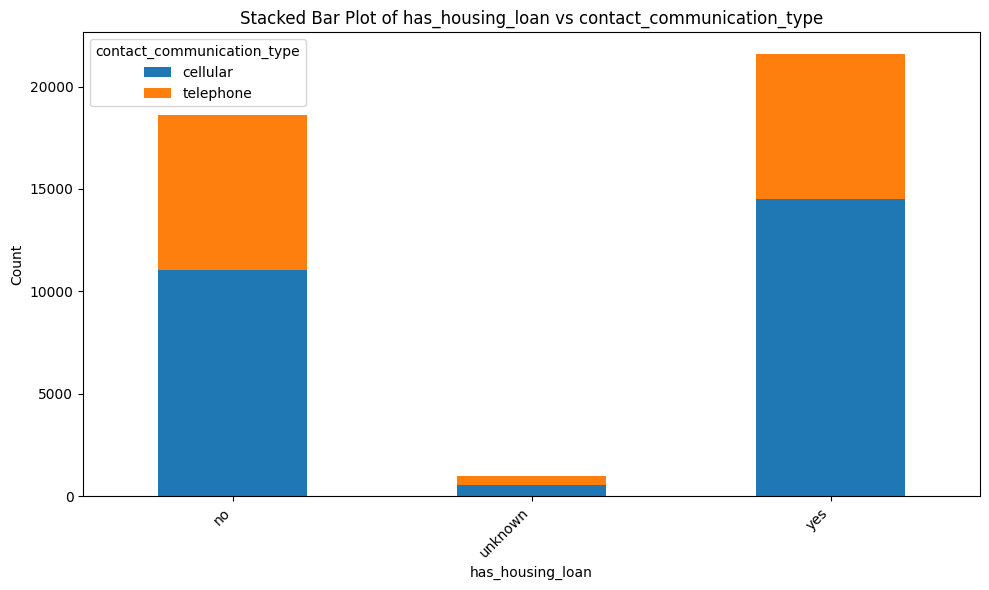


Analyzing relationship between 'has_housing_loan' and 'last_contact_month':
Cross-tabulation:


last_contact_month,apr,aug,dec,jul,jun,mar,may,nov,oct,sep
has_housing_loan,,,,,,,,,,
no,1046,2614,72,3260,2755,217,6429,1668,314,240
unknown,58,130,6,147,175,12,350,76,20,16
yes,1527,3432,104,3762,2388,317,6988,2356,383,314


<Figure size 1000x600 with 0 Axes>

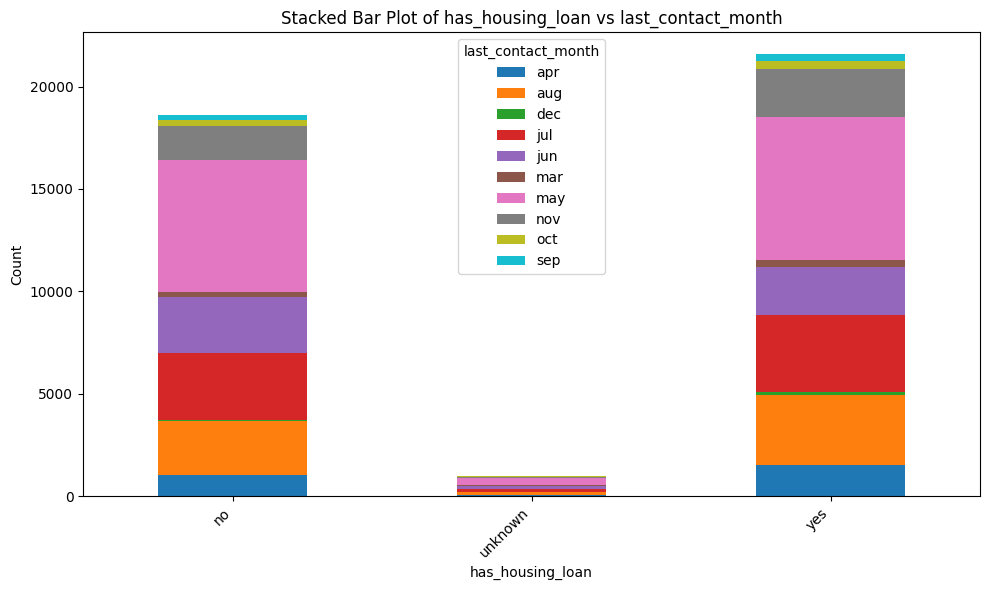


Analyzing relationship between 'has_housing_loan' and 'last_contact_day_of_week':
Cross-tabulation:


last_contact_day_of_week,fri,mon,thu,tue,wed
has_housing_loan,,,,,
no,3655,3758,3807,3732,3663
unknown,203,191,189,210,197
yes,3968,4563,4622,4144,4274


<Figure size 1000x600 with 0 Axes>

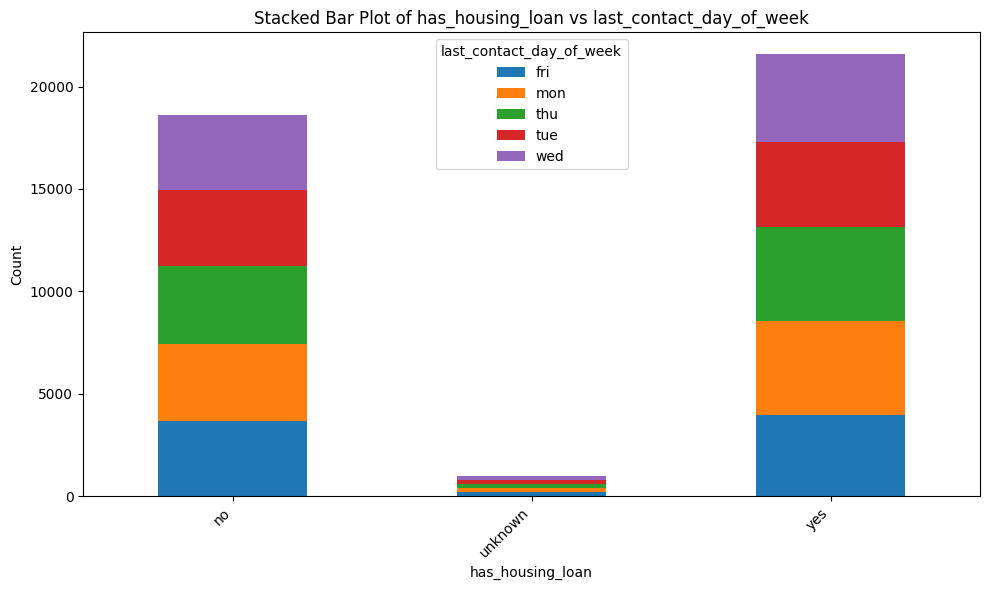


Analyzing relationship between 'has_housing_loan' and 'prev_campaign_outcome':
Cross-tabulation:


prev_campaign_outcome,failure,nonexistent,success
has_housing_loan,,,
no,1787,16249,579
unknown,111,851,28
yes,2354,18451,766


<Figure size 1000x600 with 0 Axes>

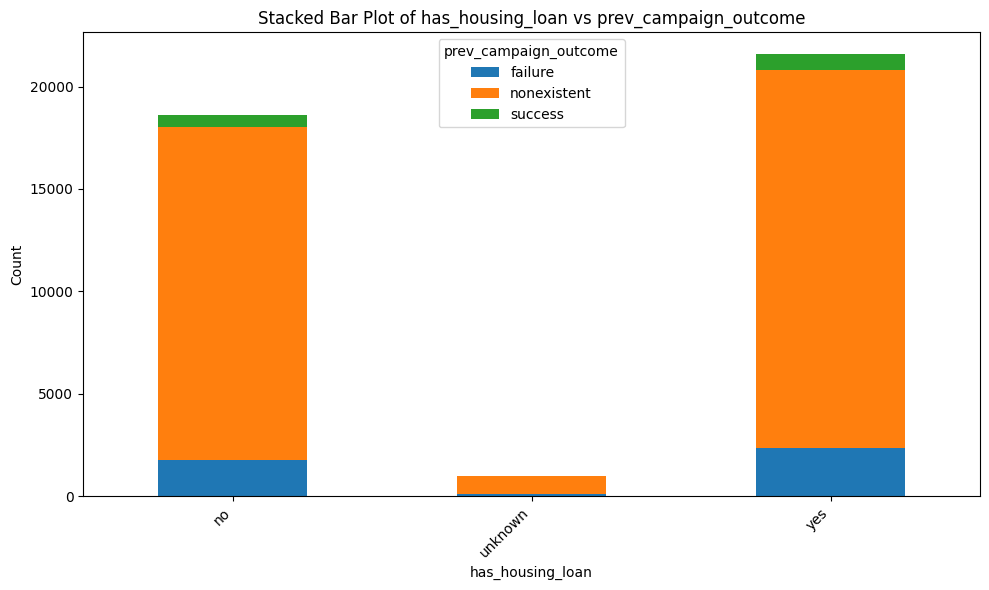


Analyzing relationship between 'has_housing_loan' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
has_housing_loan,,
no,16590,2025
unknown,883,107
yes,19064,2507


<Figure size 1000x600 with 0 Axes>

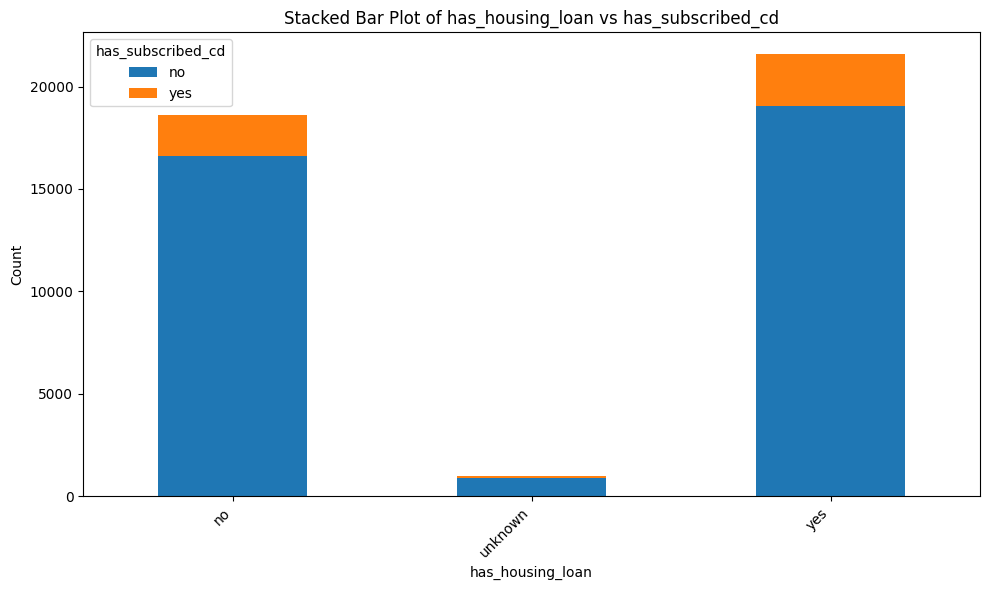


Analyzing relationship between 'has_personal_loan' and 'contact_communication_type':
Cross-tabulation:


contact_communication_type,cellular,telephone
has_personal_loan,,
no,21513,12425
unknown,561,429
yes,4061,2187


<Figure size 1000x600 with 0 Axes>

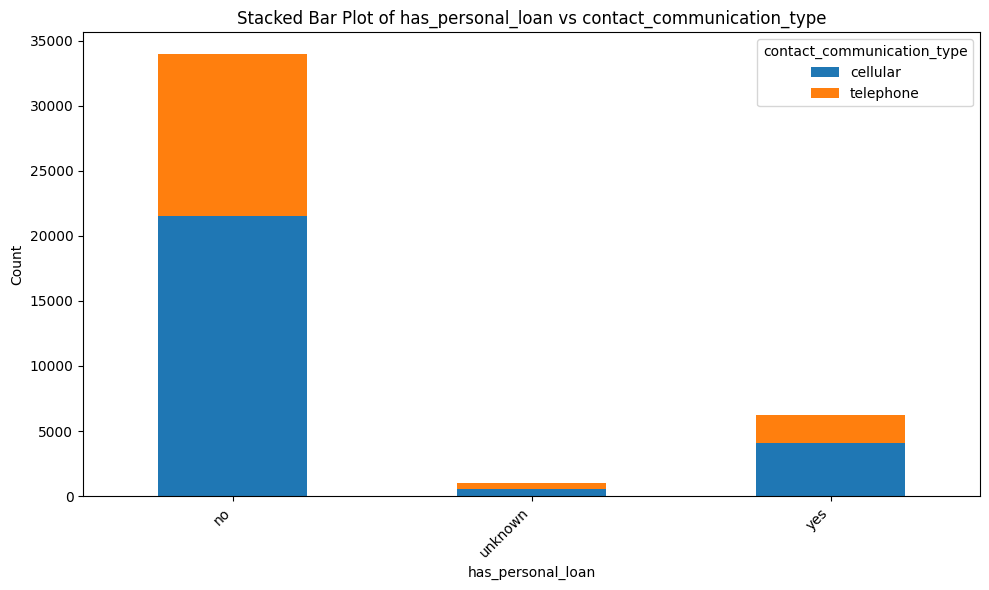


Analyzing relationship between 'has_personal_loan' and 'last_contact_month':
Cross-tabulation:


last_contact_month,apr,aug,dec,jul,jun,mar,may,nov,oct,sep
has_personal_loan,,,,,,,,,,
no,2169,5118,142,5844,4384,458,11326,3418,607,472
unknown,58,130,6,147,175,12,350,76,20,16
yes,404,928,34,1178,759,76,2091,606,90,82


<Figure size 1000x600 with 0 Axes>

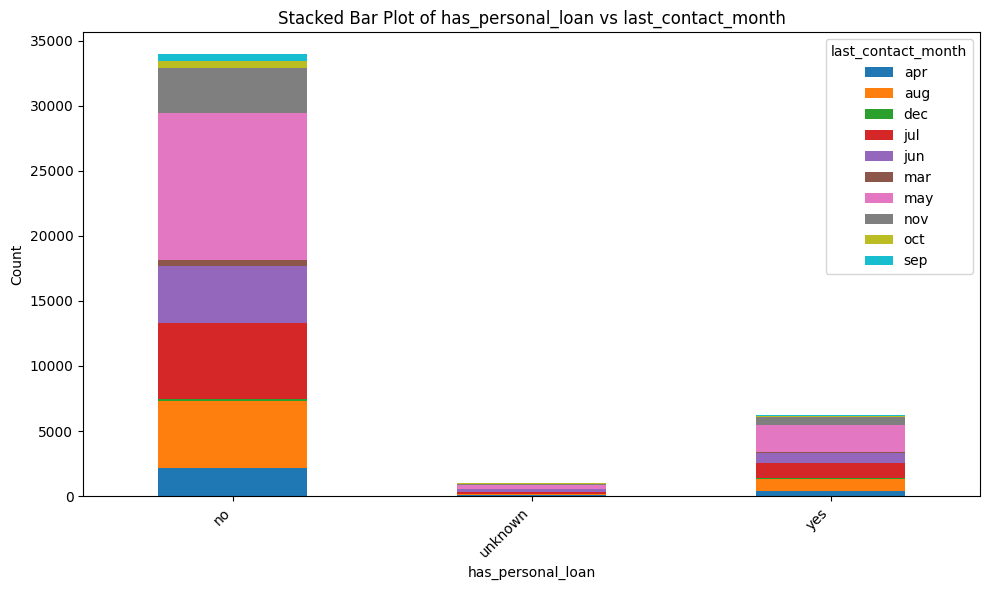


Analyzing relationship between 'has_personal_loan' and 'last_contact_day_of_week':
Cross-tabulation:


last_contact_day_of_week,fri,mon,thu,tue,wed
has_personal_loan,,,,,
no,6400,6988,7128,6706,6716
unknown,203,191,189,210,197
yes,1223,1333,1301,1170,1221


<Figure size 1000x600 with 0 Axes>

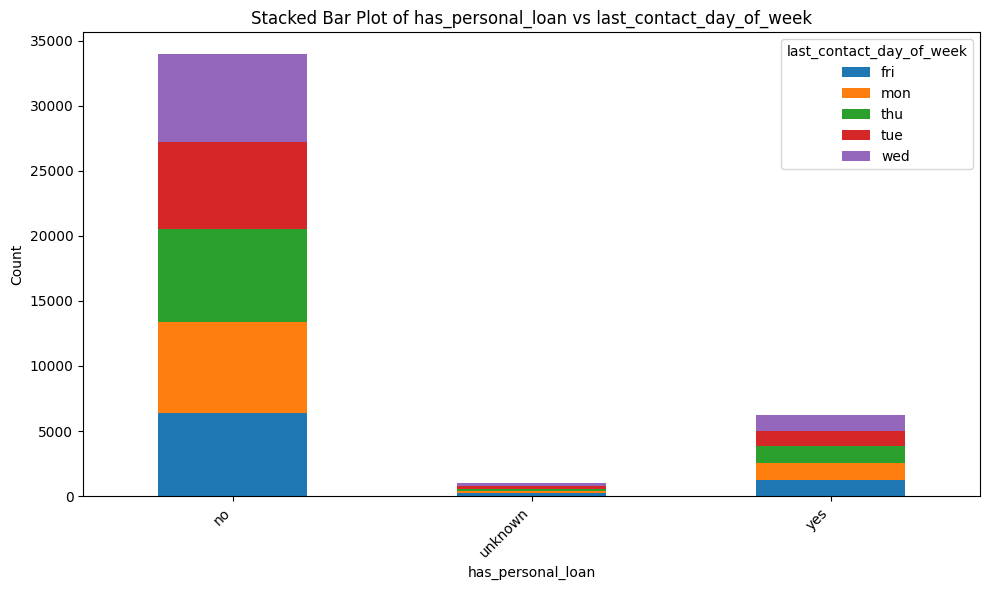


Analyzing relationship between 'has_personal_loan' and 'prev_campaign_outcome':
Cross-tabulation:


prev_campaign_outcome,failure,nonexistent,success
has_personal_loan,,,
no,3496,29304,1138
unknown,111,851,28
yes,645,5396,207


<Figure size 1000x600 with 0 Axes>

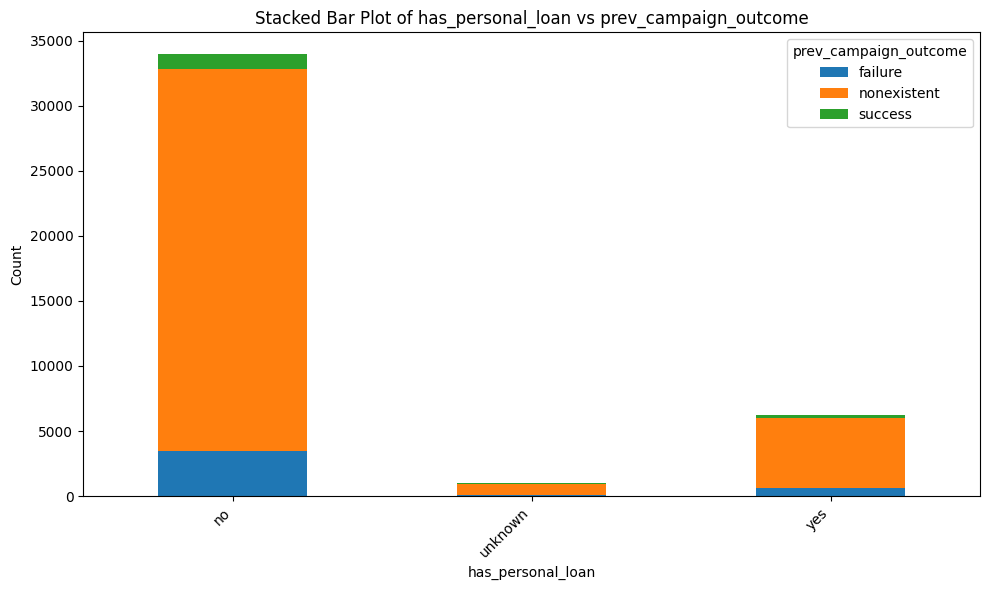


Analyzing relationship between 'has_personal_loan' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
has_personal_loan,,
no,30089,3849
unknown,883,107
yes,5565,683


<Figure size 1000x600 with 0 Axes>

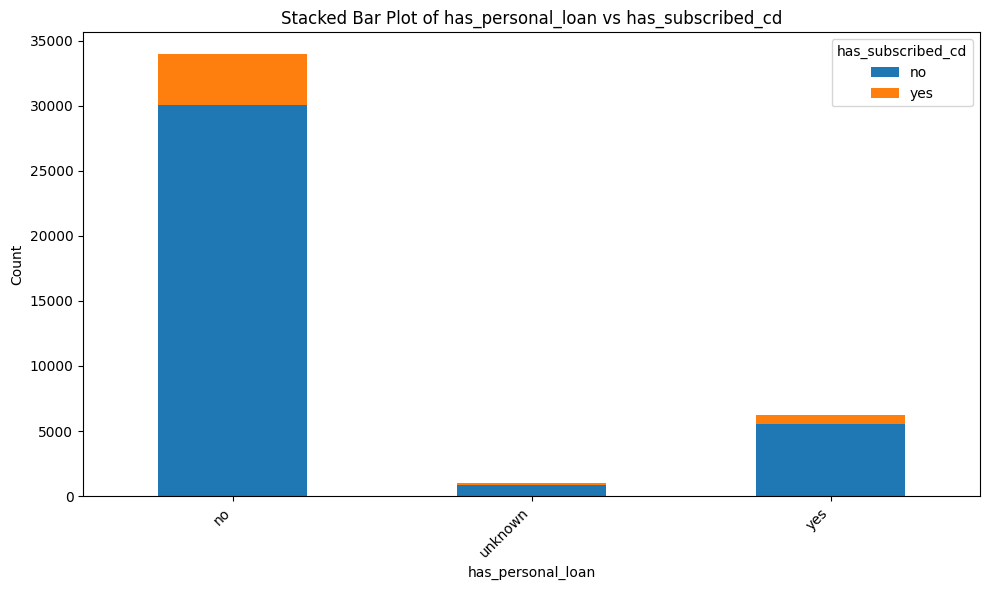


Analyzing relationship between 'contact_communication_type' and 'last_contact_month':
Cross-tabulation:


last_contact_month,apr,aug,dec,jul,jun,mar,may,nov,oct,sep
contact_communication_type,,,,,,,,,,
cellular,2444,5907,149,6092,820,486,5517,3675,563,482
telephone,187,269,33,1077,4498,60,8250,425,154,88


<Figure size 1000x600 with 0 Axes>

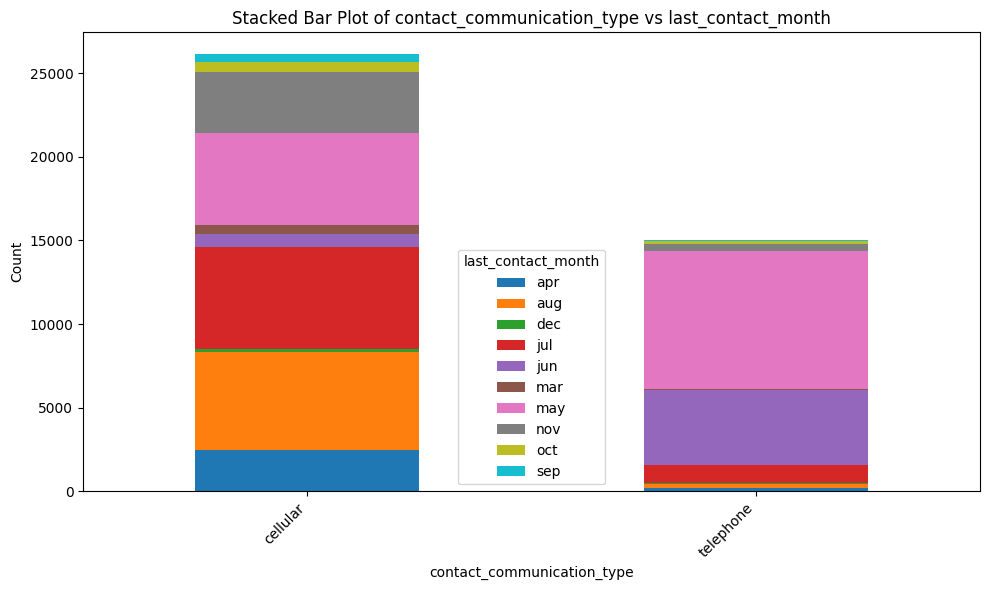


Analyzing relationship between 'contact_communication_type' and 'last_contact_day_of_week':
Cross-tabulation:


last_contact_day_of_week,fri,mon,thu,tue,wed
contact_communication_type,,,,,
cellular,4644,5533,5802,5104,5052
telephone,3182,2979,2816,2982,3082


<Figure size 1000x600 with 0 Axes>

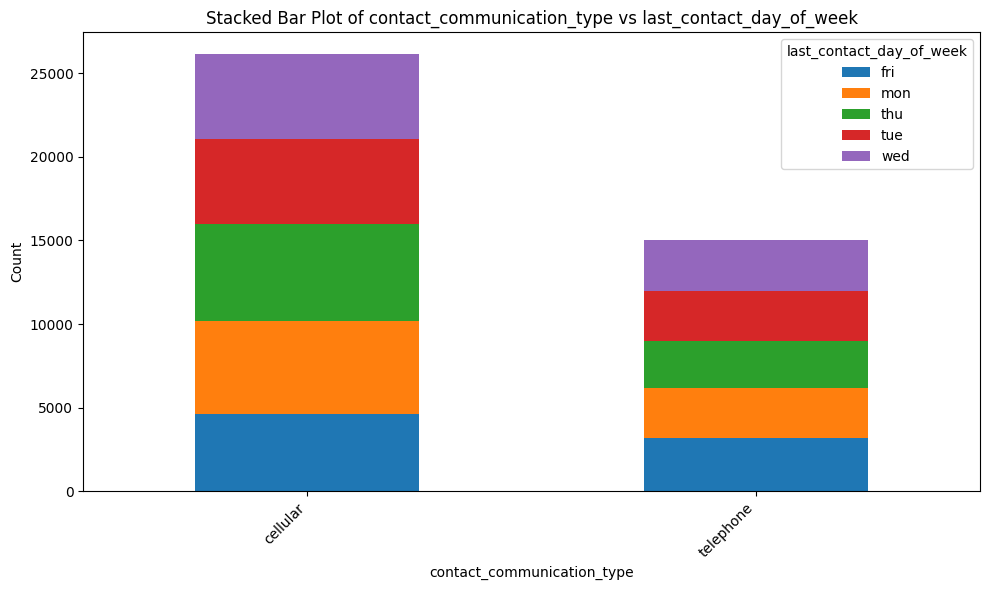


Analyzing relationship between 'contact_communication_type' and 'prev_campaign_outcome':
Cross-tabulation:


prev_campaign_outcome,failure,nonexistent,success
contact_communication_type,,,
cellular,3952,20913,1270
telephone,300,14638,103


<Figure size 1000x600 with 0 Axes>

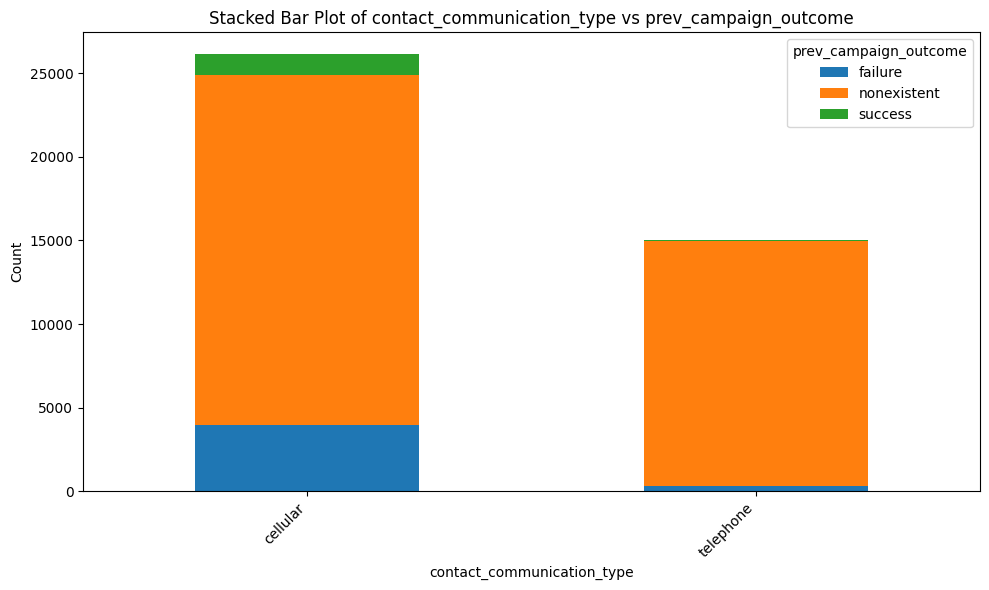


Analyzing relationship between 'contact_communication_type' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
contact_communication_type,,
cellular,22283,3852
telephone,14254,787


<Figure size 1000x600 with 0 Axes>

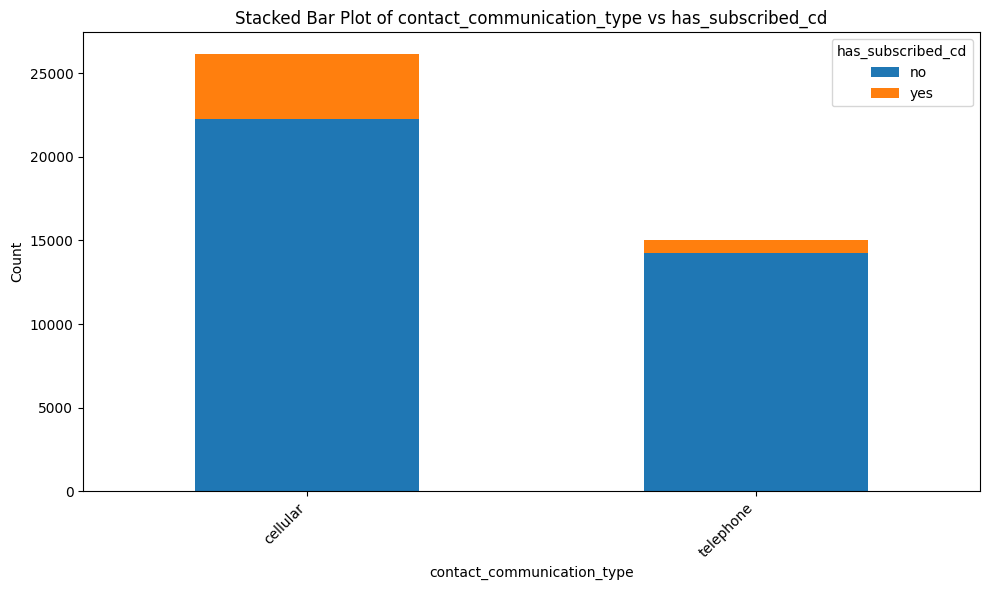


Analyzing relationship between 'last_contact_month' and 'last_contact_day_of_week':
Cross-tabulation:


last_contact_day_of_week,fri,mon,thu,tue,wed
last_contact_month,,,,,
apr,610,702,768,251,300
aug,1070,1221,1347,1295,1243
dec,24,53,45,25,35
jul,1012,1515,1668,1517,1457
jun,1147,1251,967,970,983
mar,94,143,99,140,70
may,2857,2642,2536,2809,2923
nov,755,766,903,813,863
oct,142,129,163,148,135


<Figure size 1000x600 with 0 Axes>

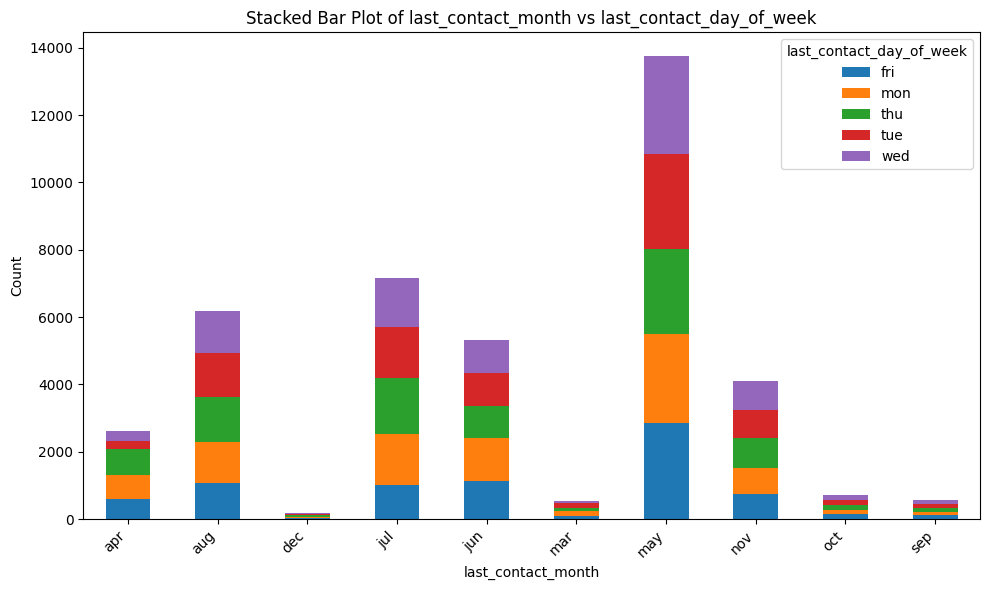


Analyzing relationship between 'last_contact_month' and 'prev_campaign_outcome':
Cross-tabulation:


prev_campaign_outcome,failure,nonexistent,success
last_contact_month,,,
apr,647,1873,111
aug,254,5717,205
dec,39,98,45
jul,120,6941,108
jun,171,5003,144
mar,98,367,81
may,1779,11758,230
nov,839,3096,165
oct,168,413,136


<Figure size 1000x600 with 0 Axes>

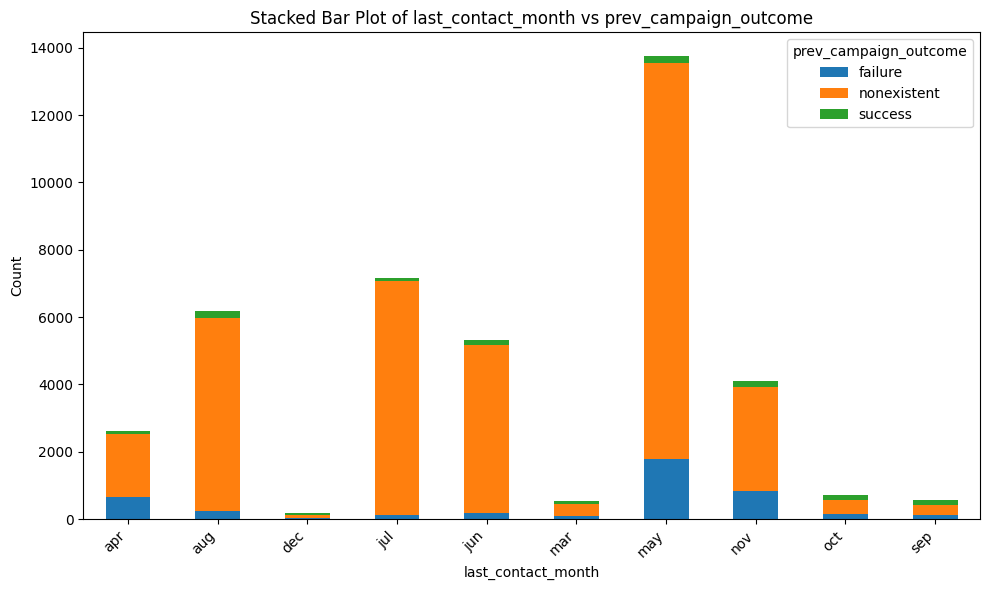


Analyzing relationship between 'last_contact_month' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
last_contact_month,,
apr,2092,539
aug,5521,655
dec,93,89
jul,6521,648
jun,4759,559
mar,270,276
may,12881,886
nov,3684,416
oct,402,315


<Figure size 1000x600 with 0 Axes>

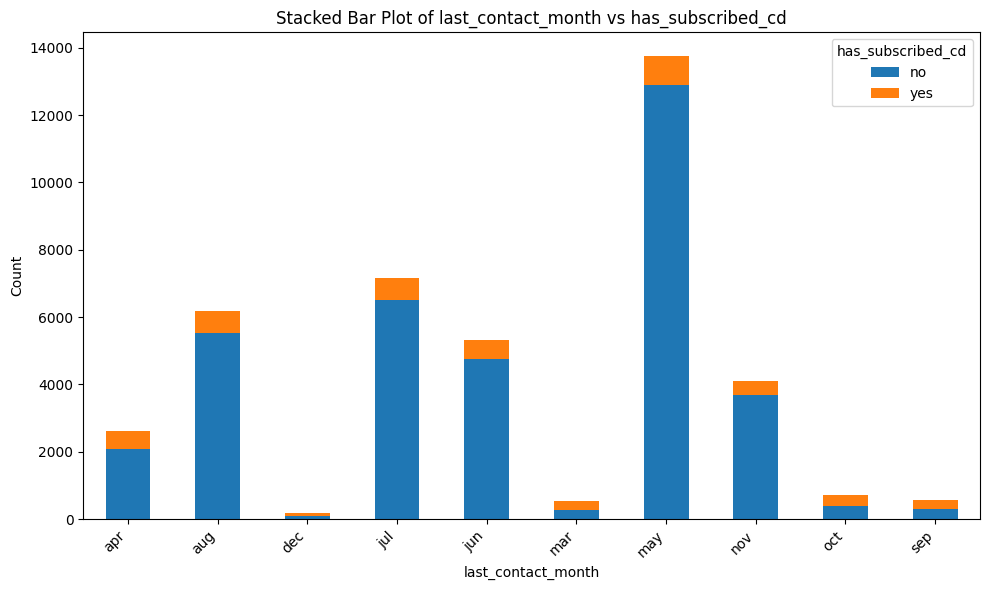


Analyzing relationship between 'last_contact_day_of_week' and 'prev_campaign_outcome':
Cross-tabulation:


prev_campaign_outcome,failure,nonexistent,success
last_contact_day_of_week,,,
fri,903,6702,221
mon,873,7362,277
thu,867,7437,314
tue,805,6990,291
wed,804,7060,270


<Figure size 1000x600 with 0 Axes>

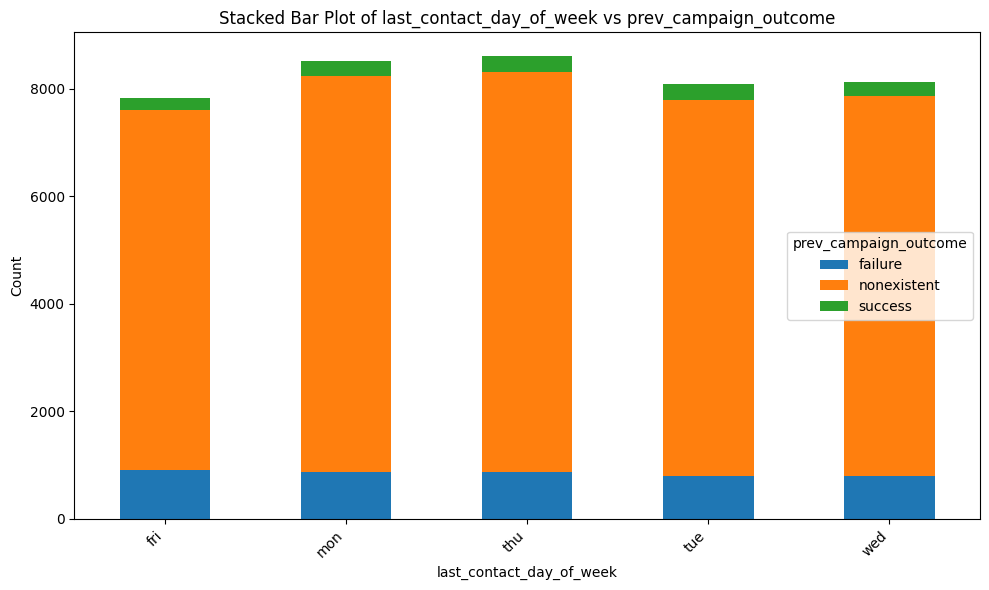


Analyzing relationship between 'last_contact_day_of_week' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
last_contact_day_of_week,,
fri,6980,846
mon,7665,847
thu,7574,1044
tue,7133,953
wed,7185,949


<Figure size 1000x600 with 0 Axes>

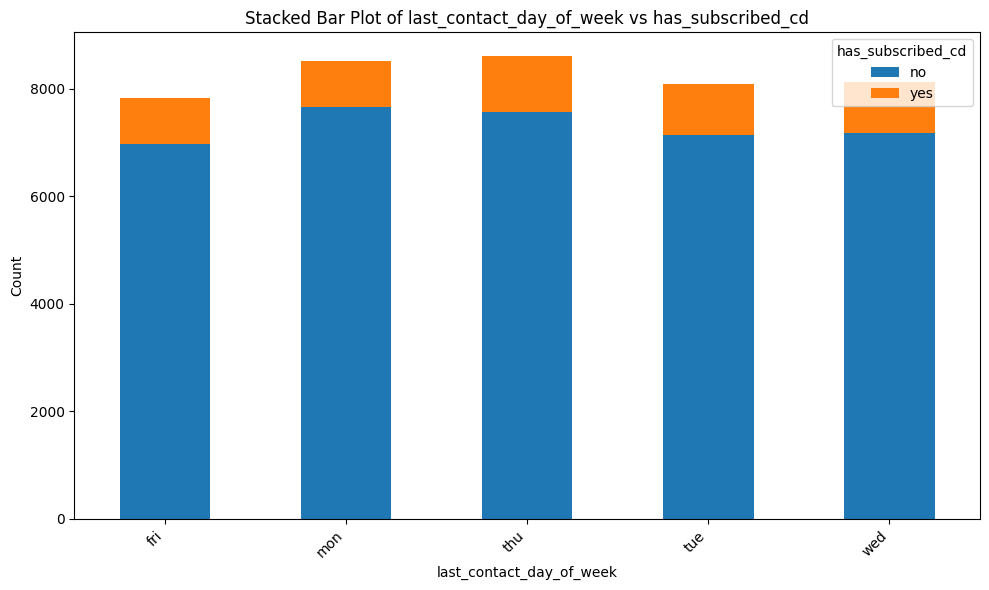


Analyzing relationship between 'prev_campaign_outcome' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
prev_campaign_outcome,,
failure,3647,605
nonexistent,32411,3140
success,479,894


<Figure size 1000x600 with 0 Axes>

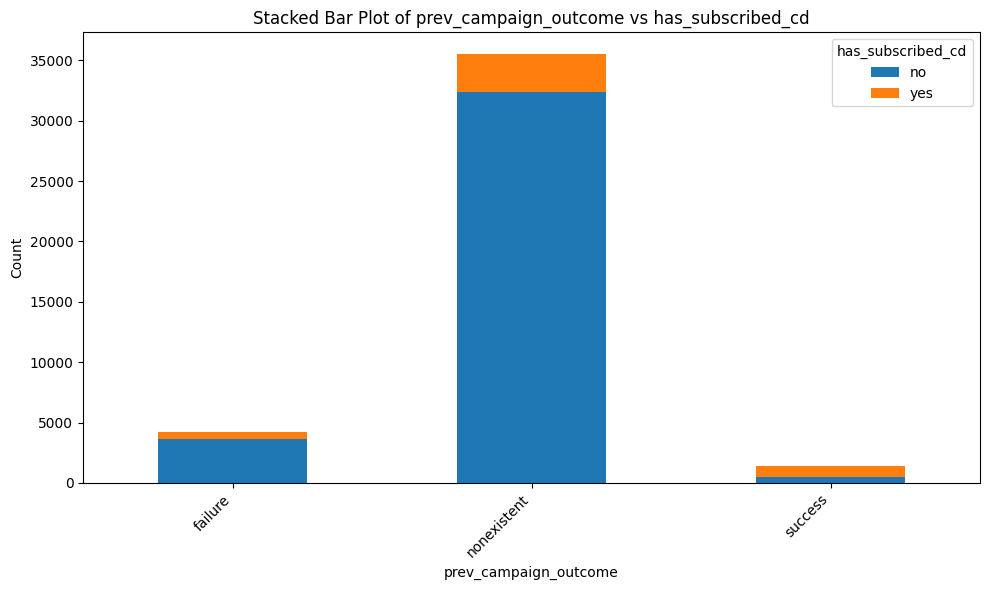

In [ ]:


# Iterate through pairs of selected categorical columns
for col1, col2 in itertools.combinations(categorical_cols, 2):
    print(f"\nAnalyzing relationship between '{col1}' and '{col2}':")

    # Create a cross-tabulation
    crosstab = pd.crosstab(bank_df[col1], bank_df[col2])
    print("Cross-tabulation:")
    display(crosstab)

    # Create a stacked bar plot
    plt.figure(figsize=(10, 6))
    crosstab.plot(kind='bar', stacked=True, figsize=(10, 6))
    plt.title(f'Stacked Bar Plot of {col1} vs {col2}')
    plt.xlabel(col1)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

## Numerical-categorical relationships
Explore how numerical features vary across different categories of categorical features using box plots, or grouped bar plots.

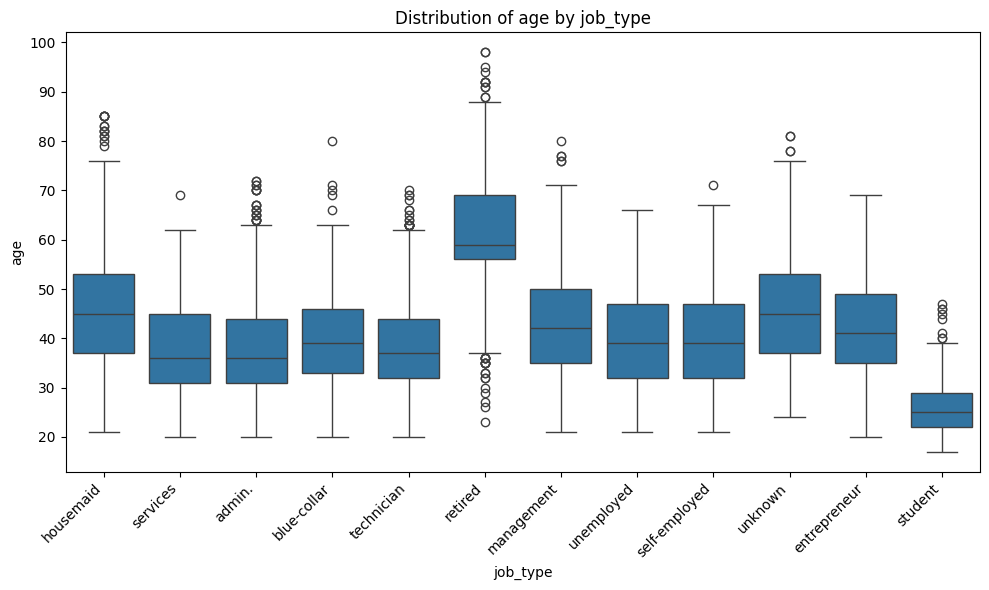

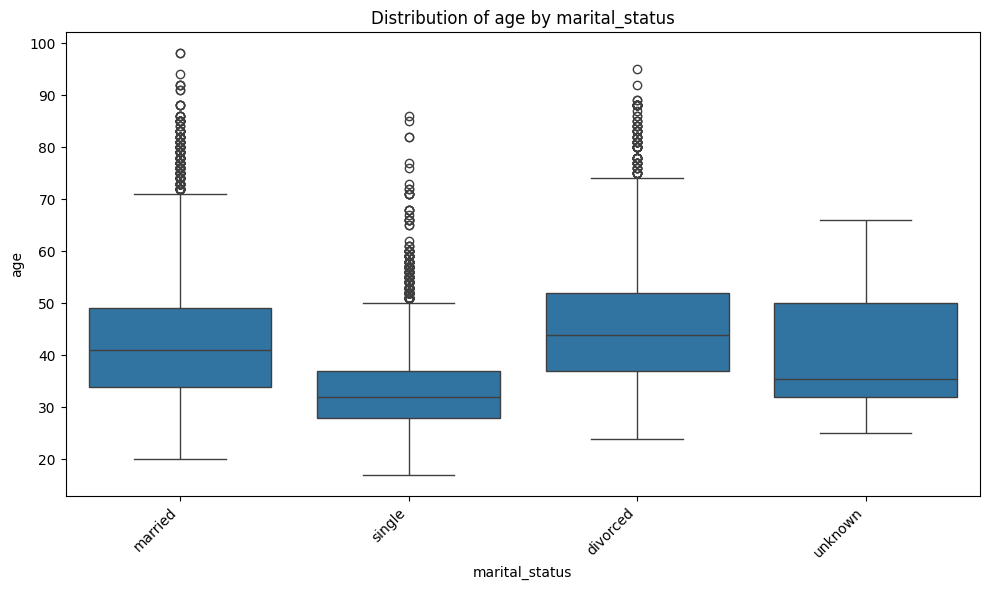

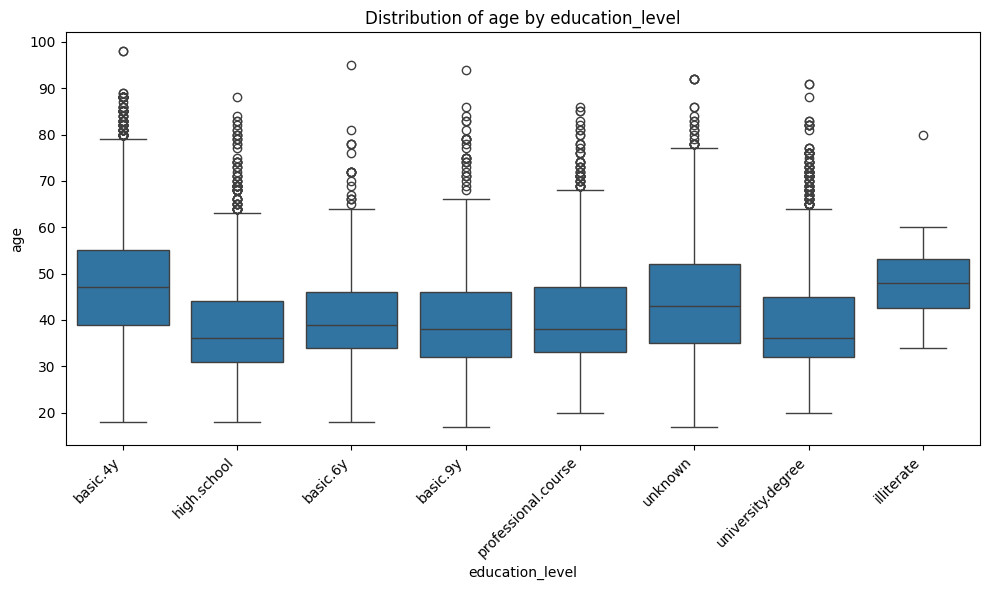

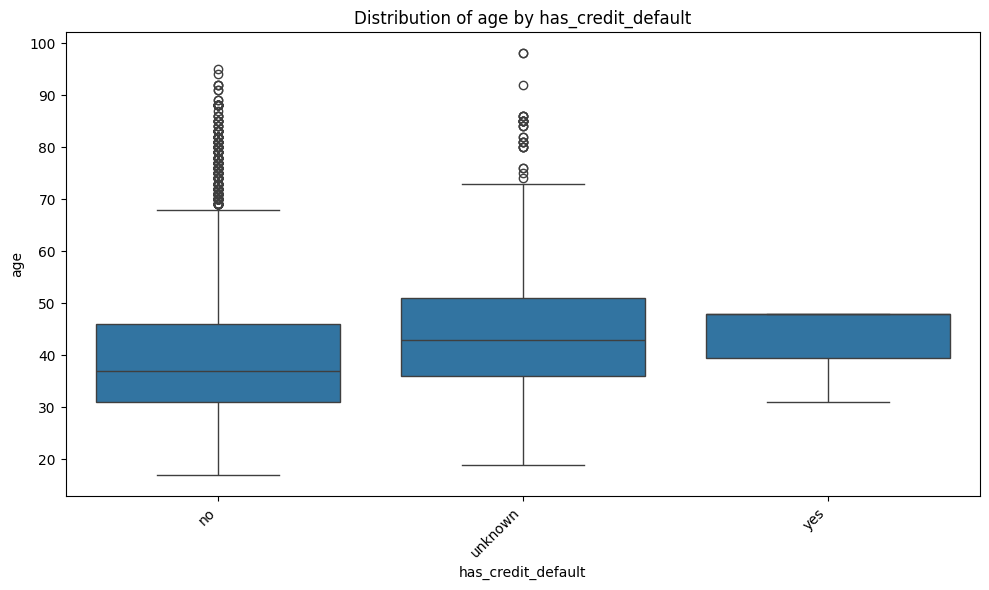

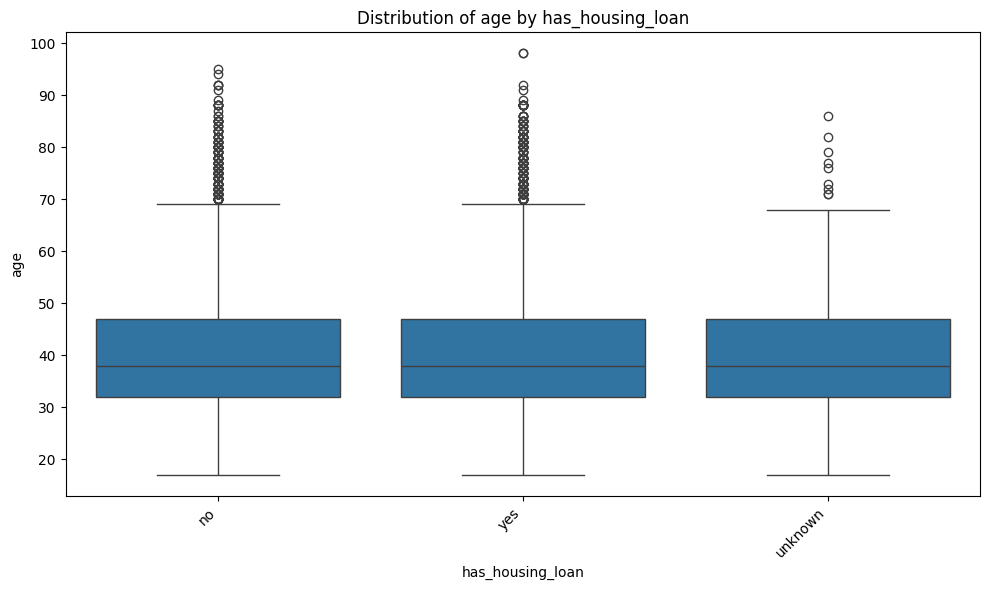

...

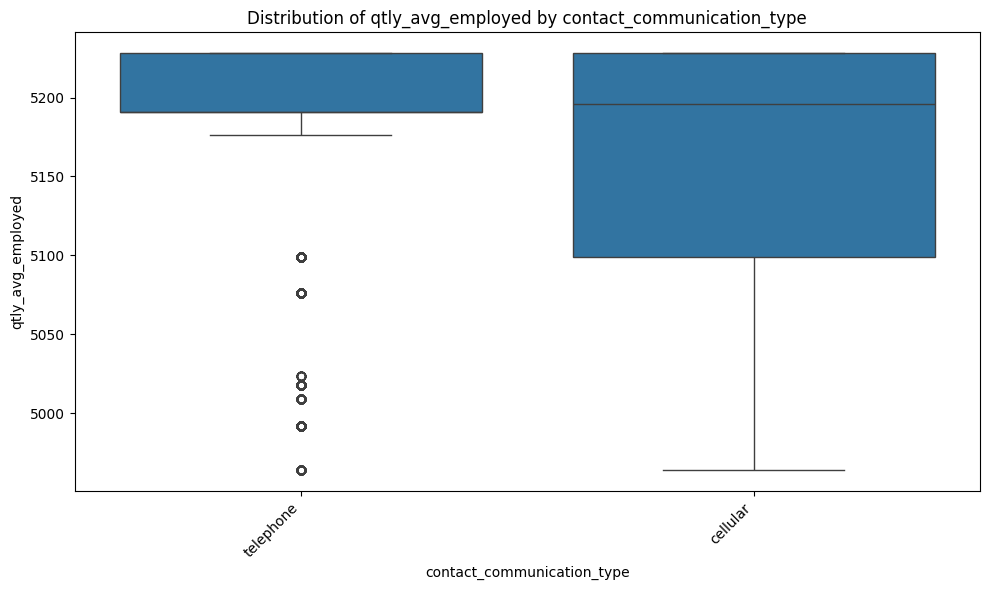

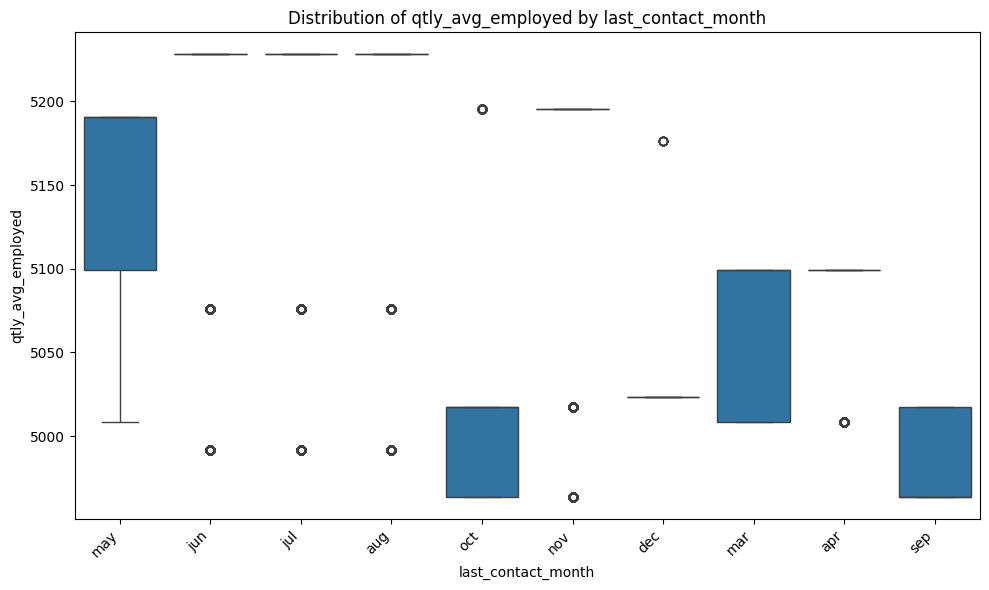

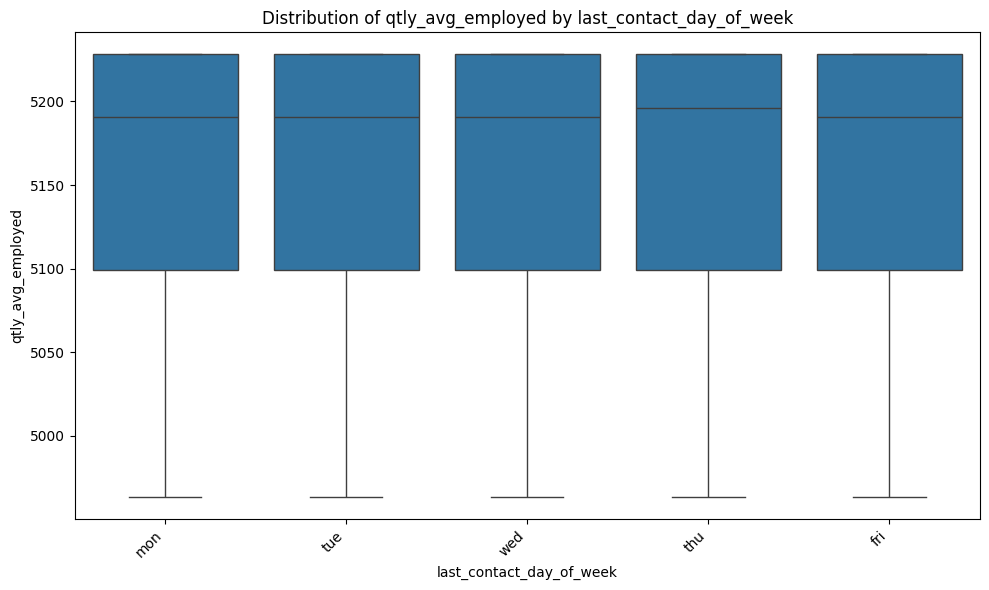

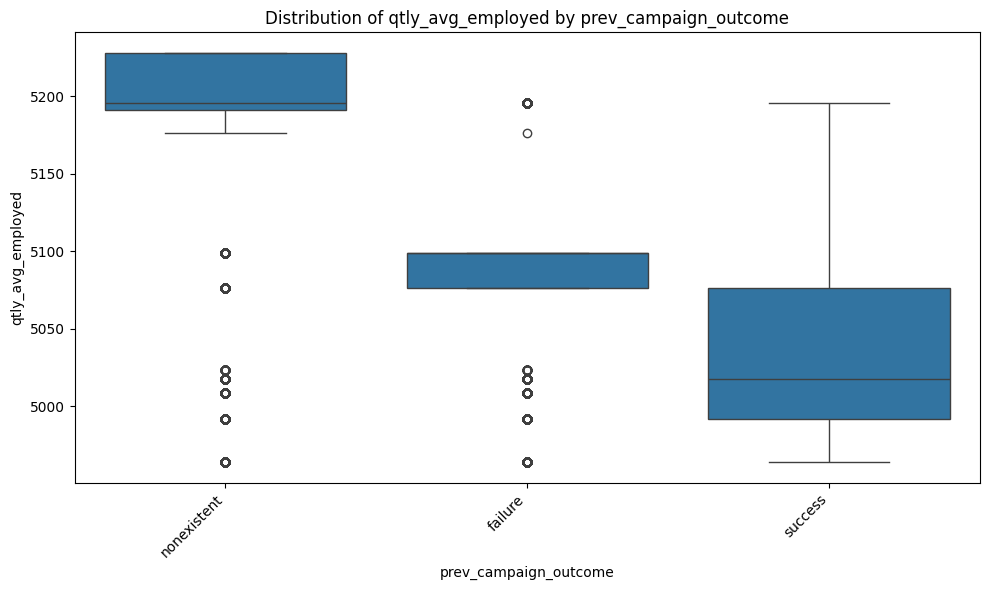

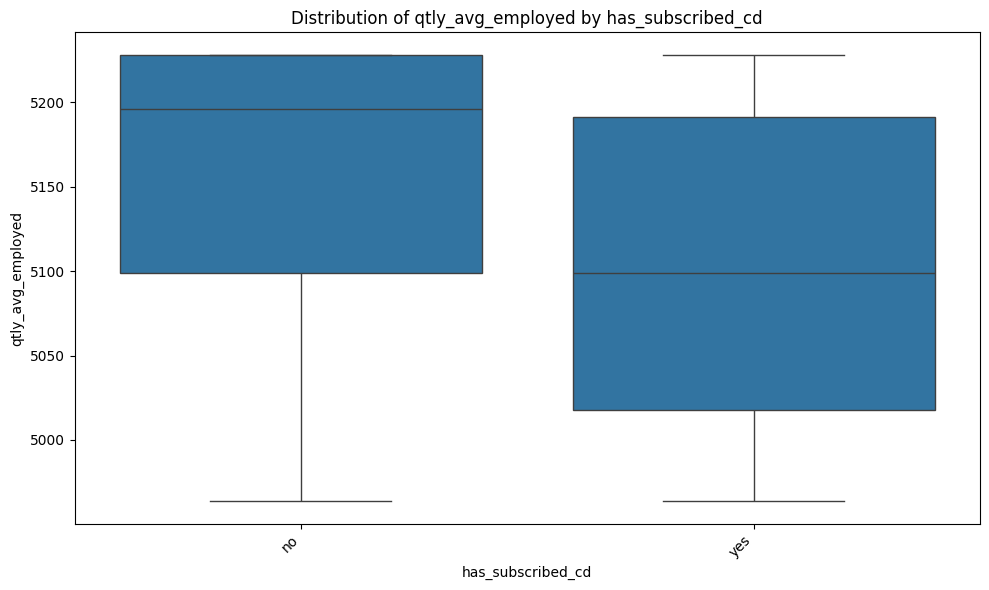

In [ ]:


# Select numerical and categorical columns
numerical_cols = bank_df.select_dtypes(include=np.number).columns
categorical_cols = bank_df.select_dtypes(include='object').columns

# Iterate through each numerical column
for num_col in numerical_cols:
    # Iterate through each categorical column
    for cat_col in categorical_cols:
        # Create box plot
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=bank_df[cat_col], y=bank_df[num_col])
        plt.title(f'Distribution of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

## Relationship with Target Variable

Analyze the relationship between numerical features and the target variable (`has_subscribed_cd`) using box plots.

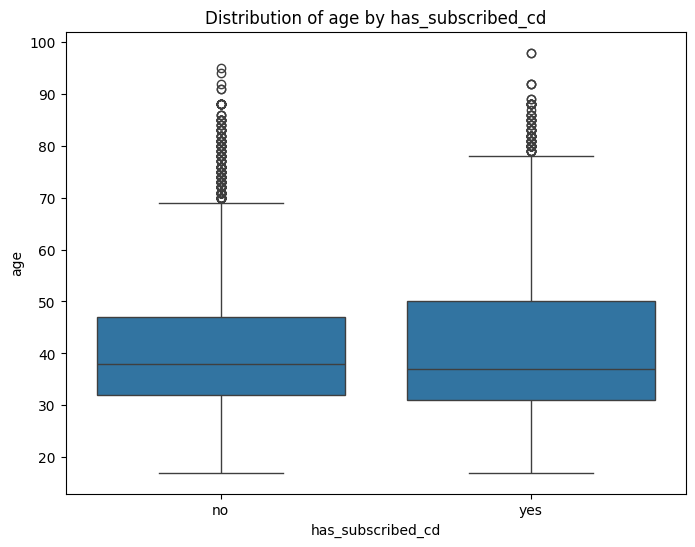

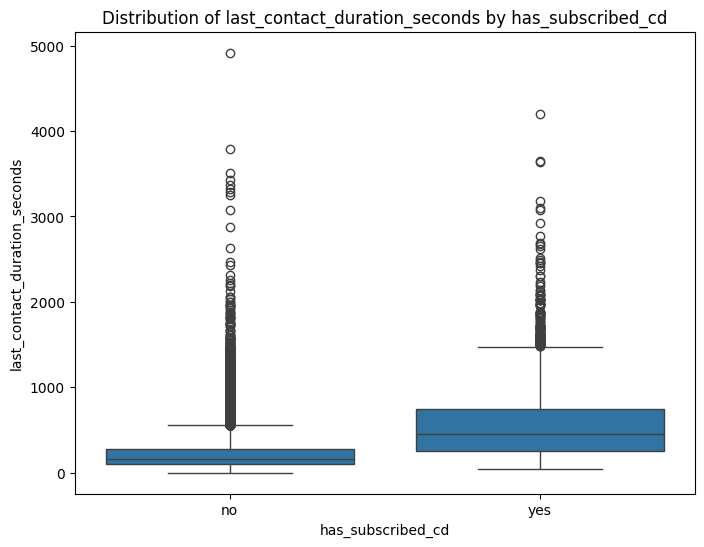

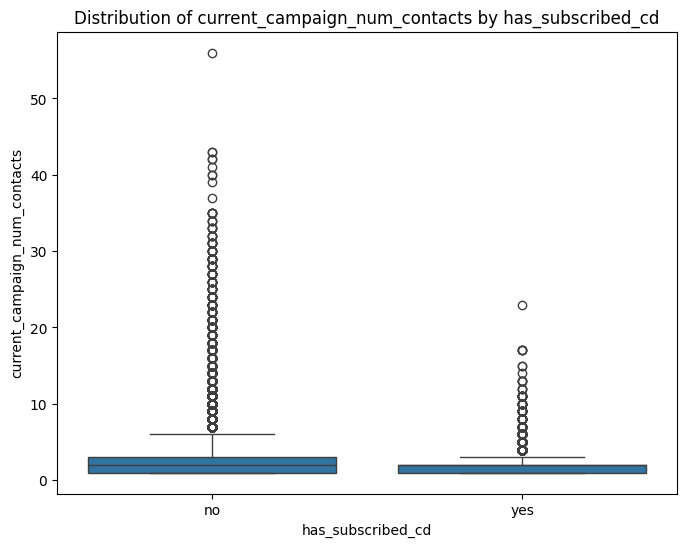

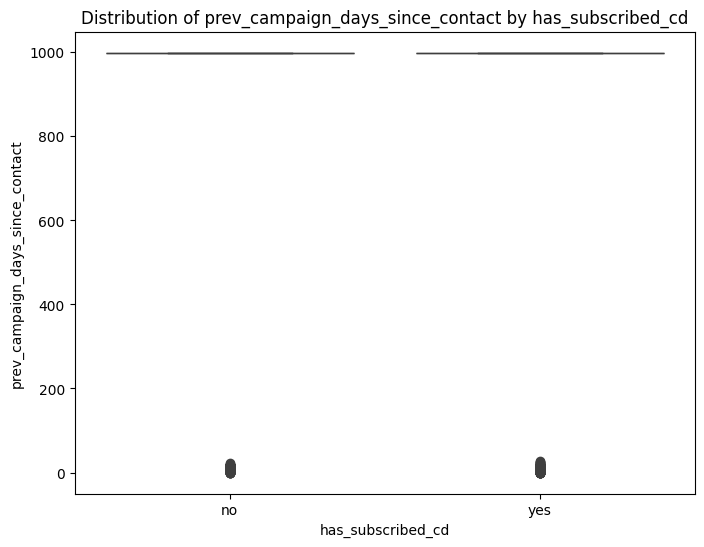

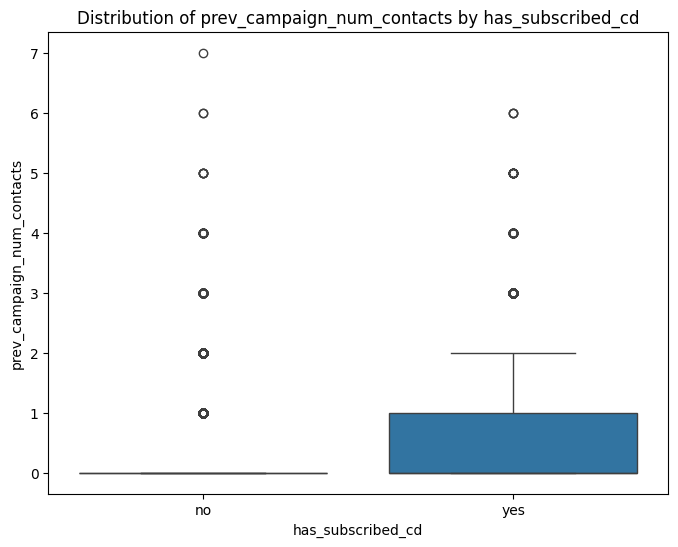

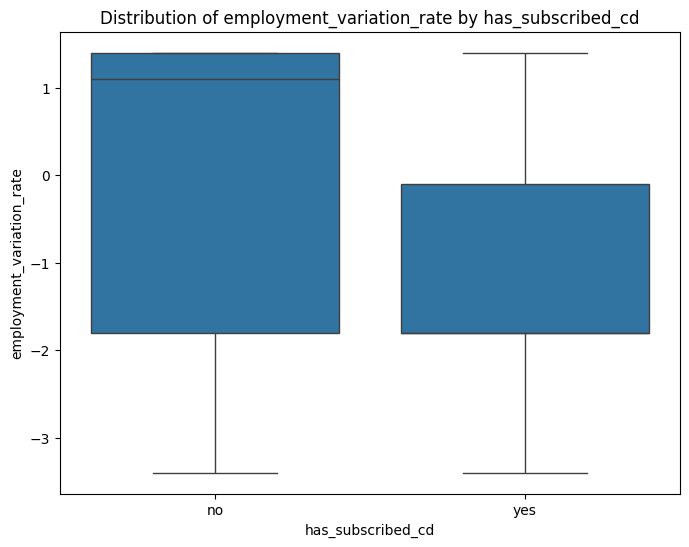

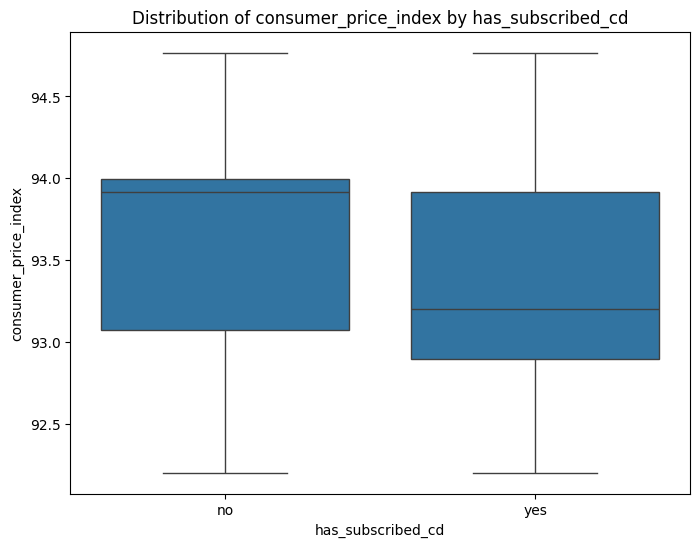

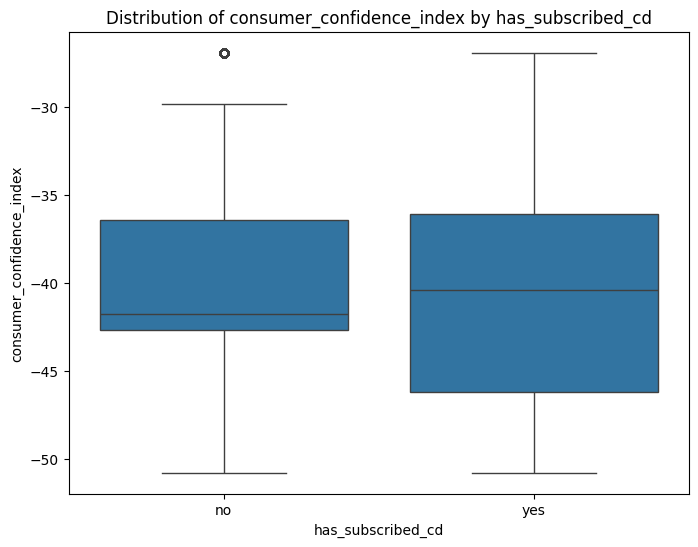

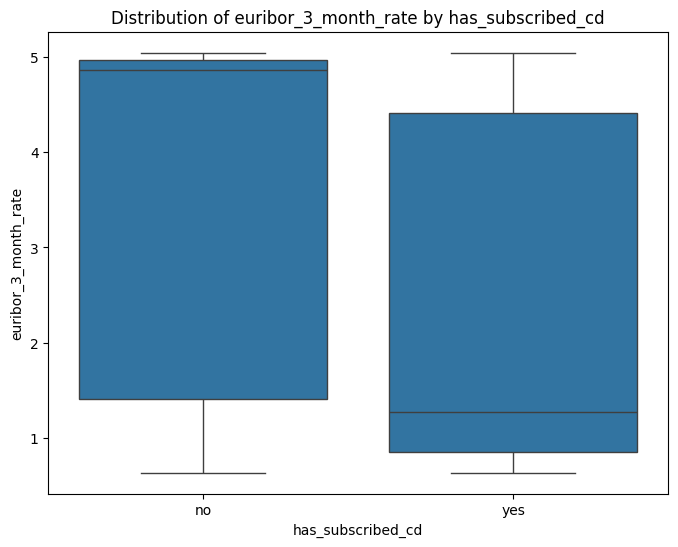

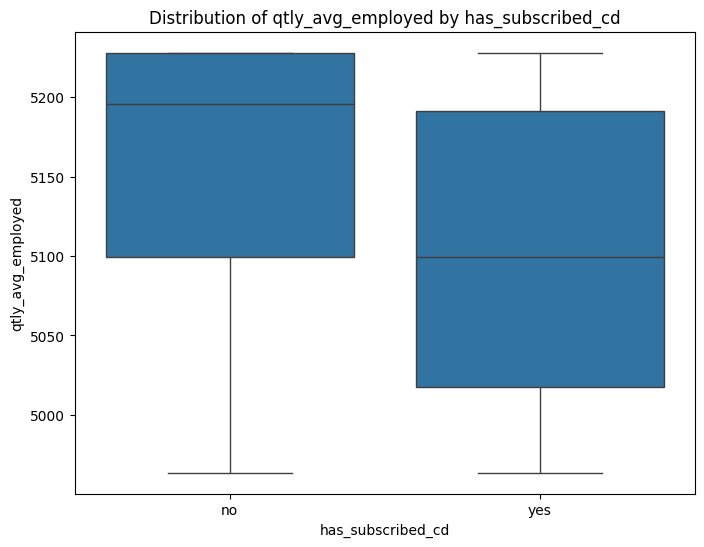

In [ ]:

# Select numerical columns and the target variable
numerical_cols = bank_df.select_dtypes(include=np.number).columns
target_col = 'has_subscribed_cd'

# Iterate through each numerical column
for num_col in numerical_cols:
    # Create box plot
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=bank_df[target_col], y=bank_df[num_col])
    plt.title(f'Distribution of {num_col} by {target_col}')
    plt.xlabel(target_col)
    plt.ylabel(num_col)
    plt.show()

    # Create violin plot for a different perspective
    # plt.figure(figsize=(8, 6))
    # sns.violinplot(x=bank_df[target_col], y=bank_df[num_col])
    # plt.title(f'Distribution Shape of {num_col} by {target_col}')
    # plt.xlabel(target_col)
    # plt.ylabel(num_col)
    # plt.show()

Analyze the relationship between categorical features and the target variable (`has_subscribed_cd`) using grouped bar plots or cross-tabulations with percentages.


Analyzing relationship between 'job_type' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
job_type,,
admin.,9068,1351
blue-collar,8615,638
entrepreneur,1332,124
housemaid,954,106
management,2596,328
retired,1284,434
self-employed,1272,149
services,3644,323
student,600,275



Normalized Cross-tabulation (Percentages):


has_subscribed_cd,no,yes
job_type,,
admin.,0.870333,0.129667
blue-collar,0.931049,0.068951
entrepreneur,0.914835,0.085165
housemaid,0.900000,0.100000
management,0.887825,0.112175
retired,0.747381,0.252619
self-employed,0.895144,0.104856
services,0.918578,0.081422
student,0.685714,0.314286


<Figure size 1000x600 with 0 Axes>

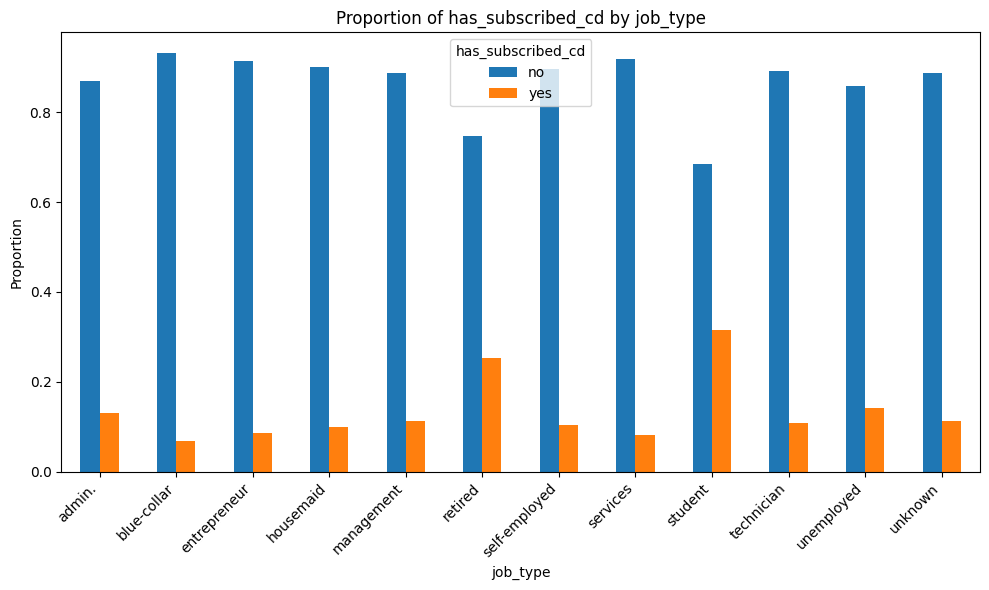


Analyzing relationship between 'marital_status' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
marital_status,,
divorced,4135,476
married,22390,2531
single,9944,1620
unknown,68,12



Normalized Cross-tabulation (Percentages):


has_subscribed_cd,no,yes
marital_status,,
divorced,0.896769,0.103231
married,0.898439,0.101561
single,0.859910,0.140090
unknown,0.850000,0.150000


<Figure size 1000x600 with 0 Axes>

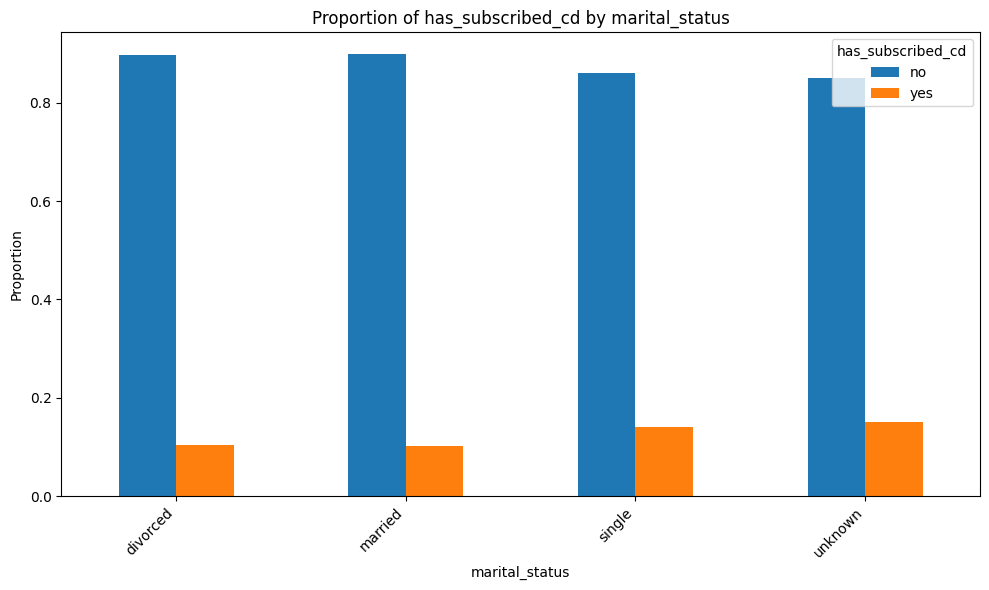


Analyzing relationship between 'education_level' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
education_level,,
basic.4y,3748,428
basic.6y,2103,188
basic.9y,5572,473
high.school,8481,1031
illiterate,14,4
professional.course,4645,595
university.degree,10495,1669
unknown,1479,251



Normalized Cross-tabulation (Percentages):


has_subscribed_cd,no,yes
education_level,,
basic.4y,0.897510,0.102490
basic.6y,0.917940,0.082060
basic.9y,0.921754,0.078246
high.school,0.891611,0.108389
illiterate,0.777778,0.222222
professional.course,0.886450,0.113550
university.degree,0.862792,0.137208
unknown,0.854913,0.145087


<Figure size 1000x600 with 0 Axes>

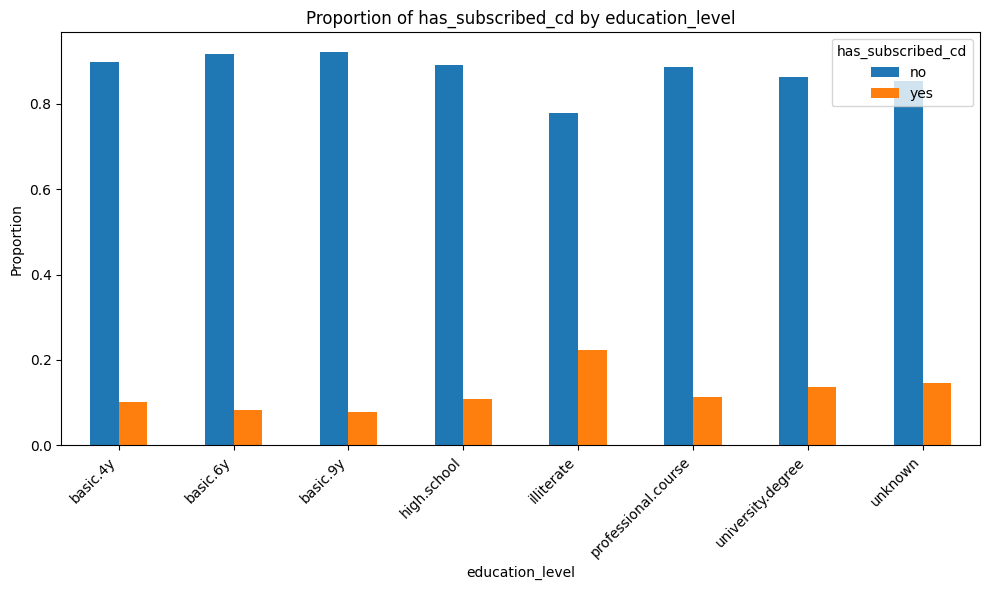


Analyzing relationship between 'has_credit_default' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
has_credit_default,,
no,28381,4196
unknown,8153,443
yes,3,0



Normalized Cross-tabulation (Percentages):


has_subscribed_cd,no,yes
has_credit_default,,
no,0.871197,0.128803
unknown,0.948464,0.051536
yes,1.000000,0.000000


<Figure size 1000x600 with 0 Axes>

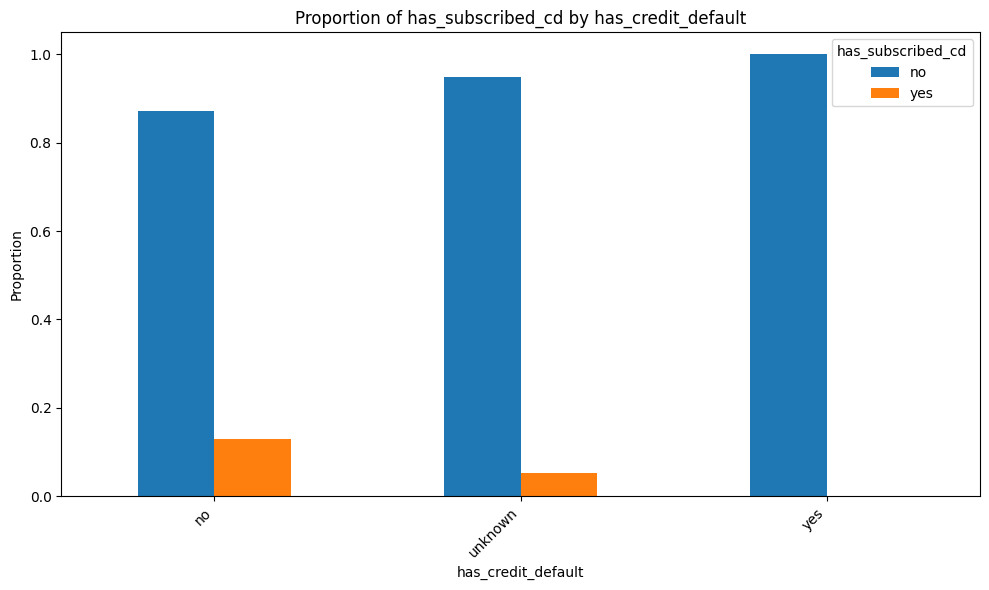


Analyzing relationship between 'has_housing_loan' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
has_housing_loan,,
no,16590,2025
unknown,883,107
yes,19064,2507



Normalized Cross-tabulation (Percentages):


has_subscribed_cd,no,yes
has_housing_loan,,
no,0.891217,0.108783
unknown,0.891919,0.108081
yes,0.883779,0.116221


<Figure size 1000x600 with 0 Axes>

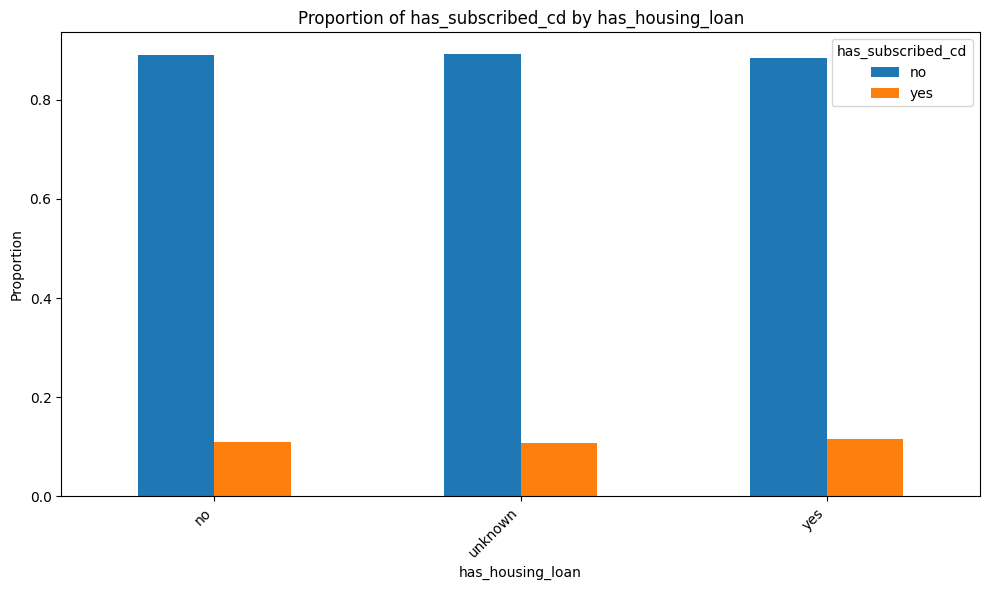


Analyzing relationship between 'has_personal_loan' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
has_personal_loan,,
no,30089,3849
unknown,883,107
yes,5565,683



Normalized Cross-tabulation (Percentages):


has_subscribed_cd,no,yes
has_personal_loan,,
no,0.886587,0.113413
unknown,0.891919,0.108081
yes,0.890685,0.109315


<Figure size 1000x600 with 0 Axes>

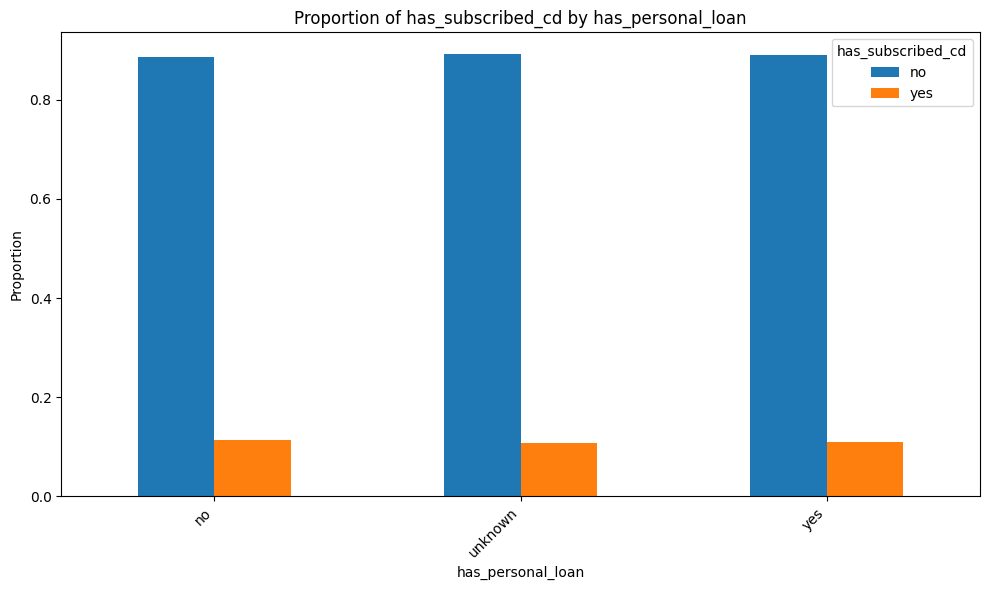


Analyzing relationship between 'contact_communication_type' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
contact_communication_type,,
cellular,22283,3852
telephone,14254,787



Normalized Cross-tabulation (Percentages):


has_subscribed_cd,no,yes
contact_communication_type,,
cellular,0.852611,0.147389
telephone,0.947676,0.052324


<Figure size 1000x600 with 0 Axes>

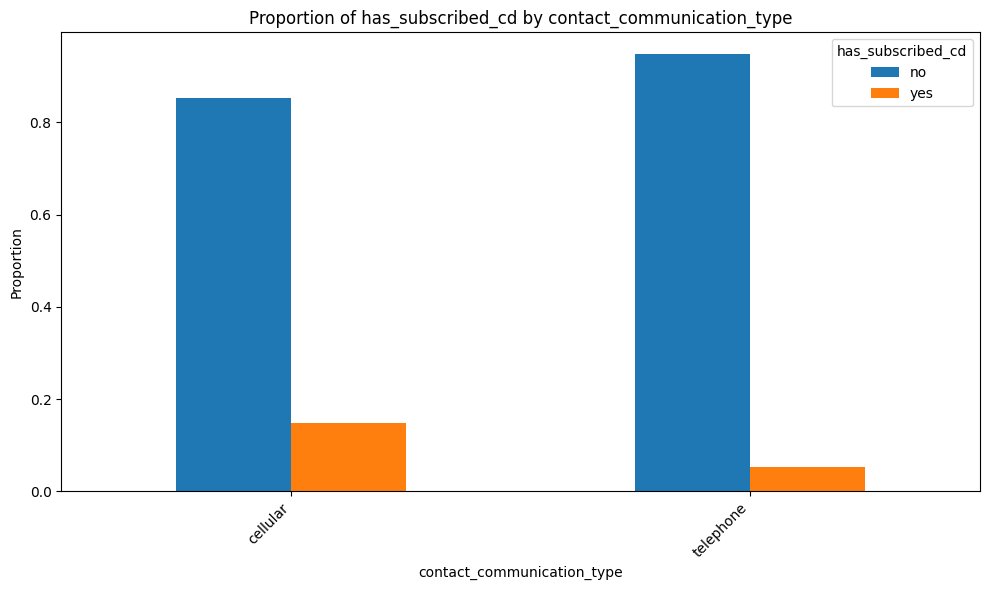


Analyzing relationship between 'last_contact_month' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
last_contact_month,,
apr,2092,539
aug,5521,655
dec,93,89
jul,6521,648
jun,4759,559
mar,270,276
may,12881,886
nov,3684,416
oct,402,315



Normalized Cross-tabulation (Percentages):


has_subscribed_cd,no,yes
last_contact_month,,
apr,0.795135,0.204865
aug,0.893944,0.106056
dec,0.510989,0.489011
jul,0.909611,0.090389
jun,0.894885,0.105115
mar,0.494505,0.505495
may,0.935643,0.064357
nov,0.898537,0.101463
oct,0.560669,0.439331


<Figure size 1000x600 with 0 Axes>

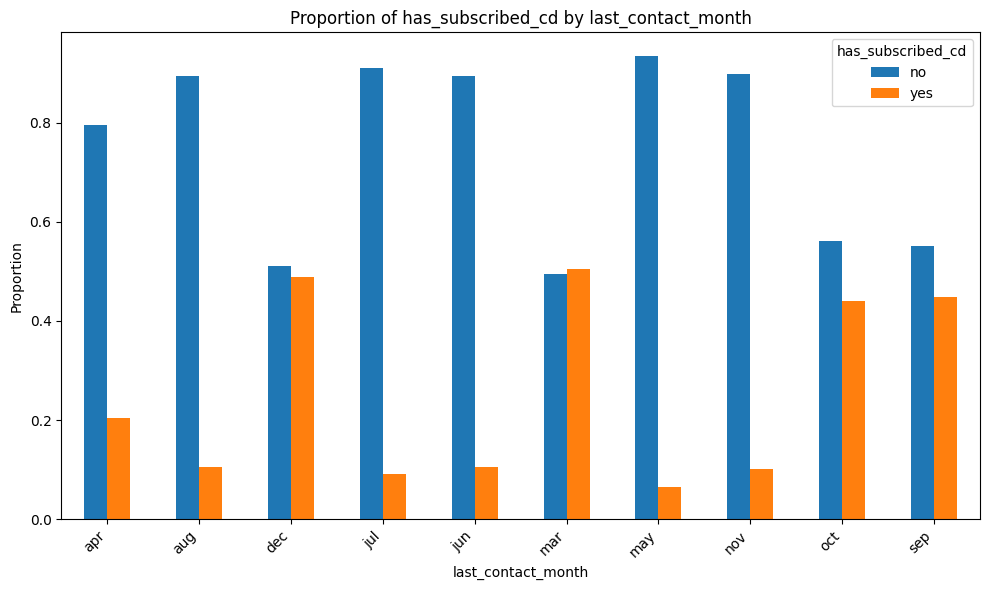


Analyzing relationship between 'last_contact_day_of_week' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
last_contact_day_of_week,,
fri,6980,846
mon,7665,847
thu,7574,1044
tue,7133,953
wed,7185,949



Normalized Cross-tabulation (Percentages):


has_subscribed_cd,no,yes
last_contact_day_of_week,,
fri,0.891899,0.108101
mon,0.900493,0.099507
thu,0.878858,0.121142
tue,0.882142,0.117858
wed,0.883329,0.116671


<Figure size 1000x600 with 0 Axes>

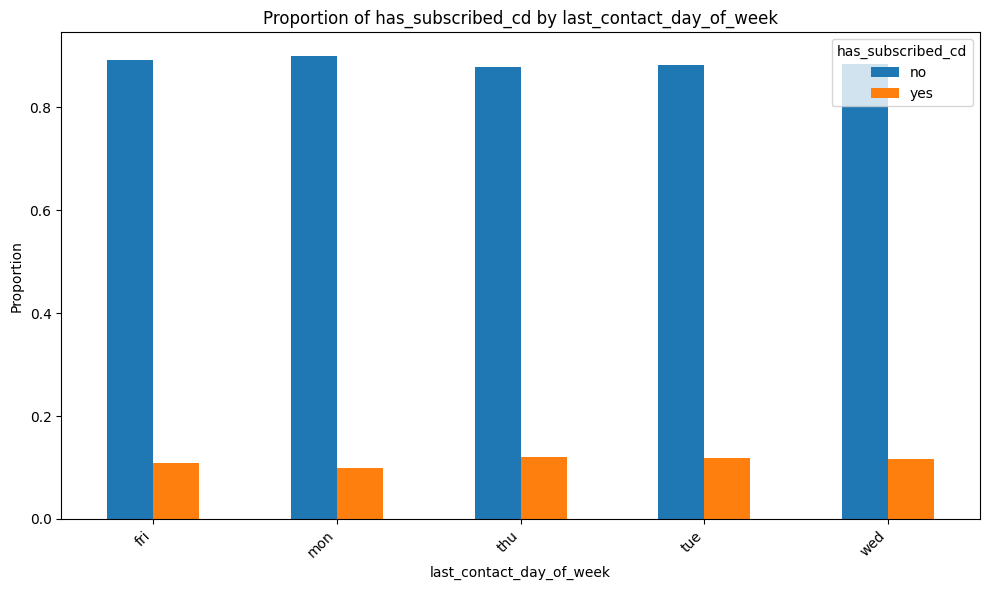


Analyzing relationship between 'prev_campaign_outcome' and 'has_subscribed_cd':
Cross-tabulation:


has_subscribed_cd,no,yes
prev_campaign_outcome,,
failure,3647,605
nonexistent,32411,3140
success,479,894



Normalized Cross-tabulation (Percentages):


has_subscribed_cd,no,yes
prev_campaign_outcome,,
failure,0.857714,0.142286
nonexistent,0.911676,0.088324
success,0.348871,0.651129


<Figure size 1000x600 with 0 Axes>

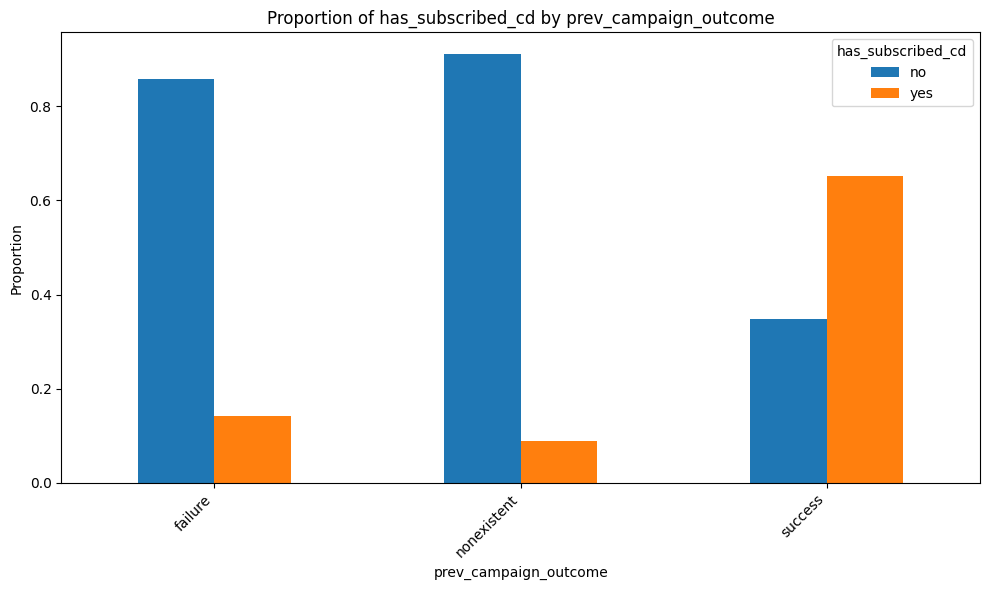

In [54]:

# Select categorical columns and the target variable
categorical_cols = bank_df.select_dtypes(include='object').columns
target_col = 'has_subscribed_cd'

# Iterate through each categorical column
for cat_col in categorical_cols:
    if cat_col != target_col: # Avoid plotting the target variable against itself
        print(f"\nAnalyzing relationship between '{cat_col}' and '{target_col}':")
        print("=" * 70)
        # Create a cross-tabulation
        crosstab = pd.crosstab(bank_df[cat_col], bank_df[target_col])
        print("Cross-tabulation:")
        print("=" * 70)
        display(crosstab)
        print("=" * 70)

        # Create a normalized cross-tabulation for percentages
        crosstab_norm = pd.crosstab(bank_df[cat_col], bank_df[target_col], normalize='index')
        print("\nNormalized Cross-tabulation (Percentages):")
        print("=" * 70)
        display(crosstab_norm)
        print("=" * 70)

        # Create a grouped bar plot
        plt.figure(figsize=(10, 6))
        crosstab_norm.plot(kind='bar', stacked=False, figsize=(10, 6))
        plt.title(f'Proportion of {target_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel('Proportion')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title=target_col)
        plt.tight_layout()
        plt.show()

### Summary of Bivariate Analysis Findings

Based on the bivariate analysis, we've observed several interesting relationships:

**Numerical-Numerical Relationships (from Correlation Matrix):**

*   We saw notable correlations between some of the social and economic context attributes, such as `employment_variation_rate`, `euribor_3_month_rate`, and `qtly_avg_employed`. These variables appear to be highly correlated with each other. This multicollinearity might be worth considering depending on the type of model we choose.
*   `last_contact_duration_seconds` shows some low correlations with other numerical features, but its relationship with the target variable (which we'll discuss next) is more significant.

**Categorical-Categorical Relationships (from Cross-tabulations and Stacked Bar Plots):**

*   The stacked bar plots revealed how the distribution of one categorical feature varies across the categories of another. For example, we could see the distribution of `job_type` within each `education_level`, or how `marital_status` is distributed across different `job_type` categories. These relationships can be useful for understanding the composition of different client segments.

**Numerical-Categorical Relationships (from Box Plots):**

*   The box plots showed how the distribution of numerical features differs across the categories of categorical features. For instance, we might have observed differences in the `age` distribution for different `job_type` categories, or variations in `last_contact_duration_seconds` across different `contact_communication_type` values.

**Relationship with Target Variable (`has_subscribed_cd`):**

*   **Numerical Features:**
    *   `last_contact_duration_seconds` appears to have a significant relationship with the target variable. Clients who subscribed (`yes`) tend to have longer contact durations than those who did not (`no`). This confirms the note in the data description about the importance of this feature, but we must remember to handle it appropriately for a realistic predictive model (as its value is only known after the call).
    *   `prev_campaign_num_contacts` also shows a difference in distribution between the target classes. Clients who subscribed tend to have been contacted fewer times in previous campaigns (or not at all) compared to those who did not subscribe.
    *   Some of the social and economic context variables (`employment_variation_rate`, `euribor_3_month_rate`, `qtly_avg_employed`, `consumer_price_index`, `consumer_confidence_index`) also show some differences in their distributions between the subscribed and non-subscribed groups, suggesting they might be predictive.
*   **Categorical Features:**
    *   The grouped bar plots for categorical features and the target variable highlight the *proportion* of clients who subscribed within each category. We likely saw that certain categories within features like `job_type`, `education_level`, `contact_communication_type`, and `prev_campaign_outcome` have a higher proportion of subscribers than others. For example, 'student' and 'retired' job types, 'unknown' education level, 'cellular' contact type, and 'success' previous campaign outcome likely have higher subscription rates.
    *   Features like `has_credit_default`, `has_housing_loan`, and `has_personal_loan` might show less pronounced differences in subscription rates between their categories, suggesting they might be less predictive individually, although their interactions with other features could still be important.

**Implications for Feature Engineering and Modeling:**

*   The relationships identified in the bivariate analysis can guide our feature engineering and selection decisions. Features that show a strong relationship with the target variable are likely to be important predictors.
*   For categorical features with many categories or significant imbalances, we might consider different encoding strategies (beyond simple one-hot encoding) or grouping less frequent categories.
*   The multicollinearity among the social and economic context variables suggests we might need to be mindful of this when using models sensitive to multicollinearity (like standard logistic regression) or consider dimensionality reduction techniques if necessary.
*   The highly imbalanced target variable is a key finding that will require careful consideration during model selection and evaluation. We should use appropriate metrics (e.g., precision, recall, F1-score, AUC) and potentially techniques like resampling (oversampling the minority class or undersampling the majority class) or using models that handle class imbalance well.
*   The `last_contact_duration_seconds` feature, despite its strong relationship with the target, needs special handling as its value is not known at the time of predicting a subscription in a real-world scenario. We might exclude it for building a realistic predictive model or treat it as a feature available only for post-campaign analysis.

This detailed understanding of the feature relationships will be invaluable as we move forward with preparing the data for modeling and selecting appropriate classification algorithms.

### Multivariate Analysis: Pair Plot with Hue





Perform multivariate analysis by grouping the data by 'job_type', 'marital_status', and 'education_level' to understand their combined impact on the target variable.

## Analyze grouped data

Group the data by combinations of 'job_type', 'marital_status', and 'education_level' and calculate the subscription rate for each group to understand the impact of these combinations on the target variable.


Map the target variable to numeric values, group the data by the specified categorical columns, calculate the mean subscription rate for each group, reset the index, and sort the results to understand the combined impact of job type, marital status, and education level on the subscription rate.



In [ ]:
# Create a numeric representation of the target variable
bank_df['has_subscribed_cd_numeric'] = bank_df['has_subscribed_cd'].map({'yes': 1, 'no': 0})

# Group by job_type, marital_status, and education_level and calculate the mean subscription rate
grouped_subscription_rates = bank_df.groupby(['job_type', 'marital_status', 'education_level'])['has_subscribed_cd_numeric'].mean()

# Reset the index and rename the subscription rate column
grouped_subscription_rates = grouped_subscription_rates.reset_index(name='subscription_rate')

# Sort by subscription rate in descending order
grouped_subscription_rates = grouped_subscription_rates.sort_values(by='subscription_rate', ascending=False)

# Display the results
print("Subscription rates by Job Type, Marital Status, and Education Level:")
display(grouped_subscription_rates)

Subscription rates by Job Type, Marital Status, and Education Level:


,job_type,marital_status,education_level,subscription_rate
136,retired,married,illiterate,1.000000
200,student,divorced,professional.course,1.000000
131,retired,divorced,unknown,0.777778
269,unknown,divorced,unknown,0.600000
209,student,single,basic.6y,0.583333
...,...,...,...,...
265,unemployed,unknown,university.degree,0.000000
266,unknown,divorced,basic.4y,0.000000
267,unknown,divorced,high.school,0.000000
11,admin.,married,illiterate,0.000000


## Visualize grouped data

Create visualizations to show the subscription rates for different combinations of these categorical features.


Select the top and bottom combinations and create a grouped bar plot to visualize their subscription rates.



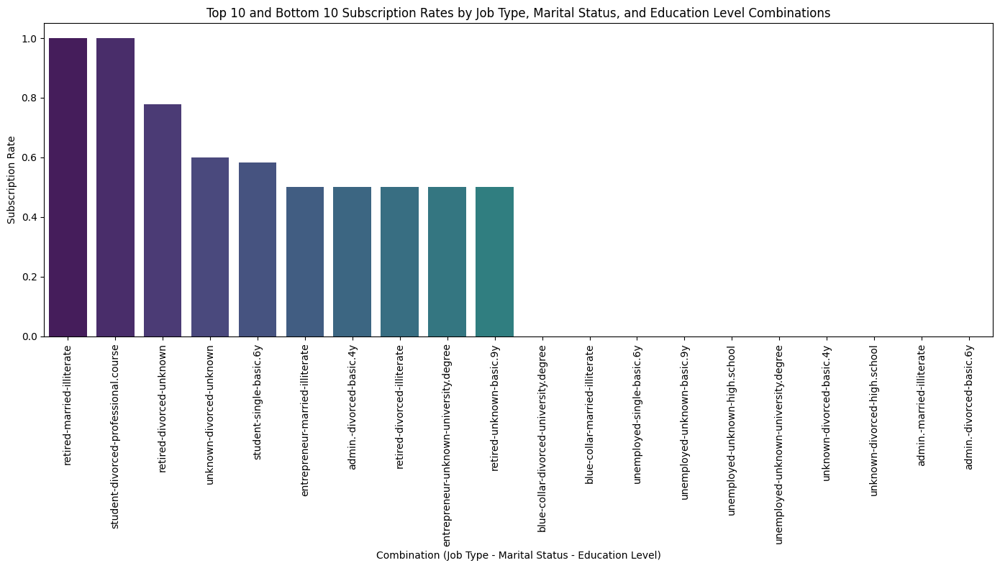

In [ ]:
# Select the top N and bottom N combinations
N = 10  # Choose a reasonable number for N
top_combinations = grouped_subscription_rates.head(N)
bottom_combinations = grouped_subscription_rates.tail(N)

# Combine top and bottom combinations
selected_combinations = pd.concat([top_combinations, bottom_combinations])

# Create a combined label for the x-axis
selected_combinations['combination'] = selected_combinations.apply(
    lambda row: f"{row['job_type']}-{row['marital_status']}-{row['education_level']}", axis=1
)

# Create a grouped bar plot for selected combinations
plt.figure(figsize=(14, 8))
sns.barplot(x='combination', y='subscription_rate', data=selected_combinations, palette='viridis')
plt.title(f'Top {N} and Bottom {N} Subscription Rates by Job Type, Marital Status, and Education Level Combinations')
plt.xlabel('Combination (Job Type - Marital Status - Education Level)')
plt.ylabel('Subscription Rate')
plt.xticks(rotation=90) # Rotate labels for readability
plt.tight_layout()
plt.show()

## Multivariate EDA Summary

Based on multivariate analysis, here is a summary of the key findings:

**Multivariate Analysis:**

*   **Pair Plot with Hue:** The pair plot of numerical features colored by the target variable visually reinforced the relationships seen in the bivariate analysis. It helped to see how the clusters of subscribed and non-subscribed clients separate (or don't separate) based on pairs of numerical features. For instance, the plot involving `last_contact_duration_seconds` and other numerical features might show more distinct separation between the 'yes' and 'no' classes for longer durations.
*   **Grouped Data Analysis:** Grouping by `job_type`, `marital_status`, and `education_level` and calculating subscription rates revealed that specific combinations of these demographic factors can have significantly higher or lower subscription rates, highlighting potential interaction effects.

**Overall Implications for Modeling:**

*   **Feature Importance:** `last_contact_duration_seconds` appears to be a very strong predictor, but its use requires careful consideration in a realistic predictive model as it's known after the outcome. Other features like `prev_campaign_outcome`, certain job types, and the social/economic context variables also show predictive potential.
*   **Data Imbalance:** The highly imbalanced target variable (`has_subscribed_cd`) is a major challenge that needs to be addressed during model selection and evaluation. Metrics beyond simple accuracy (like precision, recall, F1-score, AUC) will be crucial, and techniques like resampling or using models robust to imbalance might be necessary.
*   **Categorical Feature Handling:** Categorical features with 'unknown' or specific meaningful categories (like 'nonexistent' or '999') need appropriate encoding and handling. Features with many categories might require grouping or more advanced encoding methods.
*   **Multicollinearity:** The high correlations among social and economic context variables should be considered when choosing models.
*   **Outliers and Transformations:** Skewed numerical features and outliers might benefit from transformations (like log transformation) to improve model performance, especially for models sensitive to feature distributions.

This comprehensive EDA provides a strong foundation for feature engineering, selecting appropriate models, and developing a strategy to handle the class imbalance in the target variable for our classification task.

### Problem 4: Understanding the Task

After examining the description and data, your goal now is to clearly state the *Business Objective* of the task.  State the objective below.

**Business Objective**

Based on the dataset description and the target variable y(renamed to 'has_subscribed_cd') (which indicates if the client subscribed to a term deposit), the business objective is to build a predictive model to determine whether a client is likely to subscribe to a term deposit based on their demographic information, past interactions, economic indicators, and the details of the current marketing campaign.

This is a binary classification problem where:

* Target Variable: y(renamed to 'has_subscribed_cd') (yes/no - will the client subscribe to a term deposit?)
* **Business Impact:**
  * Improve marketing campaign efficiency by targeting clients most likely to subscribe
  * Reduce marketing costs by avoiding unlikely prospects
  * Increase conversion rates and overall campaign ROI
  * Enable better resource allocation for future campaigns


### Problem 5: Train/Test Split

With your data prepared, split it into a train and test set.

Now that the target variable is encoded, we can proceed with the train/test split and then establish the baseline.

### Train/Test Split

Now, let's split the data into training and testing sets and then apply preprocessing steps to each set separately to avoid data leakage.

In [ ]:


# Separate features (X) and target (y)

X = bank_df.drop(['has_subscribed_cd', 'has_subscribed_cd_numeric', 'last_contact_duration_seconds'], axis=1)

# Use the already encoded target variable
y = bank_df['has_subscribed_cd_numeric']

# Split data into training and testing sets (stratified to maintain target distribution)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y) # Changed random_state to 42

print("Data split into training and testing sets with random_state=42.")
print("Training set shape:", X_train.shape)
print("Testing set shape:", X_test.shape)

Data split into training and testing sets with random_state=42.
Training set shape: (32940, 19)
Testing set shape: (8236, 19)


### Problem 6: Engineering Features

Now that you understand your business objective, we will build a basic model to get started.  Before we can do this, we must work to encode the data.  Using just the bank information features, prepare the features and target column for modeling with appropriate encoding and transformations.

### Defining Preprocessing Steps

Let's define the transformers for handling missing values, encoding categorical features, scaling numerical features, and handling outliers.

In [ ]:

# Define Transformer for Handling Missing Values using SimpleImputer

numerical_imputer = SimpleImputer(strategy='median')
categorical_imputer = SimpleImputer(strategy='most_frequent')

# Define Transformer for One-Hot Encoding
onehot_encoder = OneHotEncoder(handle_unknown='ignore') # Handle unknown categories by ignoring them

# Define Transformer for Standard Scaling
standard_scaler = StandardScaler()

# This transformer will cap values at a certain percentile

class OutlierCapper(BaseEstimator, TransformerMixin):
    def __init__(self, lower_percentile=5, upper_percentile=95):
        self.lower_percentile = lower_percentile
        self.upper_percentile = upper_percentile
        self.lower_bounds_ = None
        self.upper_bounds_ = None

    def fit(self, X, y=None):
        # Calculate capping bounds from the training data
        self.lower_bounds_ = np.percentile(X, self.lower_percentile, axis=0)
        self.upper_bounds_ = np.percentile(X, self.upper_percentile, axis=0)
        return self

    def transform(self, X):
        X_capped = X.copy()

        for i in range(X.shape[1]):
            X_capped[:, i] = np.clip(X_capped[:, i], self.lower_bounds_[i], self.upper_bounds_[i])

        return X_capped

# Initialize the outlier capper transformer
outlier_capper = OutlierCapper(lower_percentile=1, upper_percentile=99)

print("Preprocessing transformers defined.")

Preprocessing transformers defined.


### Create Preprocessing Pipeline

Let's combine the defined preprocessing steps into a `ColumnTransformer` pipeline.

In [ ]:


# Identify numerical and categorical columns from the training data
numerical_cols = X_train.select_dtypes(include=np.number).columns.tolist()
categorical_cols = X_train.select_dtypes(include='object').columns.tolist()

# Define the numerical preprocessing pipeline
# Order: Impute missing, Handle special values (if any), Handle outliers, Scale
numerical_pipeline = Pipeline(steps=[
    ('imputer', numerical_imputer), # Impute missing numerical values
    ('outlier_capper', outlier_capper), # Handle outliers by capping
    ('scaler', standard_scaler) # Apply Standard Scaling
])

# Define the categorical preprocessing pipeline
# Order: Impute missing, Encode
categorical_pipeline = Pipeline(steps=[
    ('imputer', categorical_imputer), # Impute missing categorical values
    ('onehot', onehot_encoder) # Apply One-Hot Encoding
])

# Combine numerical and categorical pipelines using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_pipeline, numerical_cols),
        ('cat', categorical_pipeline, categorical_cols)
    ],
    remainder='passthrough' # Keep any columns not specified (shouldn't be any in this case)
)

print("Preprocessing pipeline created using ColumnTransformer.")

Preprocessing pipeline created using ColumnTransformer.


### Problem 7: A Baseline Model

Before we build our first model, we want to establish a baseline.  What is the baseline performance that our classifier should aim to beat?

### Establishing Baseline with DummyClassifier

Using `DummyClassifier` with the 'most_frequent' strategy provides a formal baseline performance metric for the imbalance Datasets.

In [ ]:


# Initialize DummyClassifier with the 'most_frequent' strategy
dummy_clf = DummyClassifier(strategy="most_frequent")

# Train the dummy classifier on the training data
dummy_clf.fit(X_train, y_train) # Use the processed and selected training data

# Predict on the testing data
y_pred_dummy = dummy_clf.predict(X_test) # Use the processed and selected testing data

# Calculate the accuracy on the test set
baseline_accuracy_dummy = accuracy_score(y_test, y_pred_dummy)

print(f"Baseline Accuracy using DummyClassifier (most_frequent): {baseline_accuracy_dummy:.4f}")

Baseline Accuracy using DummyClassifier (most_frequent): 0.8873


### Problem 8: A Simple Model

Use Logistic Regression to build a basic model on your data.

### Define Model Pipelines

Let's create a `Pipeline` for each model, incorporating the preprocessing steps.

In [ ]:


# Assuming 'preprocessor' is already defined

# Define Pipeline for Dummy Classifier
dummy_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                 ('classifier', DummyClassifier(strategy="most_frequent"))])

# Define Pipeline for Logistic Regression
logistic_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                    ('classifier', LogisticRegression(solver='liblinear', random_state=42))])

# Define Pipeline for K Nearest Neighbors
knn_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier', KNeighborsClassifier())])

# Define Pipeline for Decision Tree
decision_tree_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                         ('classifier', DecisionTreeClassifier(random_state=42))])

# Define Pipeline for Support Vector Machine
svm_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier', SVC(random_state=42, probability=True))]) # probability=True for AUC

# Define Pipeline for Random Forest
random_forest_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                         ('classifier', RandomForestClassifier(random_state=42))])

print("Model pipelines defined, each including the preprocessing steps.")

Model pipelines defined, each including the preprocessing steps.


### Train Model Pipelines

Let's train each of the defined model pipelines on the training data.

In [ ]:

# Dictionary to store training times
train_times = {}

# --- Train Dummy Classifier Pipeline ---
print("Training Dummy Classifier pipeline...")
start_time = time.time()
dummy_pipeline.fit(X_train, y_train)
end_time = time.time()
train_times['Dummy Classifier'] = end_time - start_time
print("Dummy Classifier pipeline trained.")


# --- Train Logistic Regression Pipeline ---
print("\nTraining Logistic Regression pipeline...")
start_time = time.time()
logistic_pipeline.fit(X_train, y_train)
end_time = time.time()
train_times['Logistic Regression'] = end_time - start_time
print("Logistic Regression pipeline trained.")


# --- Train K Nearest Neighbors Pipeline ---
print("\nTraining K Nearest Neighbors pipeline...")
start_time = time.time()
knn_pipeline.fit(X_train, y_train)
end_time = time.time()
train_times['K Nearest Neighbors'] = end_time - start_time
print("K Nearest Neighbors pipeline trained.")


# --- Train Decision Tree Pipeline ---
print("\nTraining Decision Tree pipeline...")
start_time = time.time()
decision_tree_pipeline.fit(X_train, y_train)
end_time = time.time()
train_times['Decision Tree'] = end_time - start_time
print("Decision Tree pipeline trained.")


# --- Train Support Vector Machine Pipeline ---
print("\nTraining Support Vector Machine pipeline...")
start_time = time.time()
svm_pipeline.fit(X_train, y_train)
end_time = time.time()
train_times['Support Vector Machine'] = end_time - start_time
print("Support Vector Machine pipeline trained.")


# --- Train Random Forest Pipeline ---
print("\nTraining Random Forest pipeline...")
start_time = time.time()
random_forest_pipeline.fit(X_train, y_train)
end_time = time.time()
train_times['Random Forest'] = end_time - start_time
print("Random Forest pipeline trained.")

print("\nAll model pipelines trained.")

Training Dummy Classifier pipeline...
Dummy Classifier pipeline trained.

Training Logistic Regression pipeline...
Logistic Regression pipeline trained.

Training K Nearest Neighbors pipeline...
K Nearest Neighbors pipeline trained.

Training Decision Tree pipeline...
Decision Tree pipeline trained.

Training Support Vector Machine pipeline...
Support Vector Machine pipeline trained.

Training Random Forest pipeline...
Random Forest pipeline trained.

All model pipelines trained.


### Problem 9: Score the Model

What is the accuracy of your model?

**Model Evaluation**

Let's evaluate the Logistic Regression model using Accuracy, Confusion Matrix, Precision, Recall, F1-score, ROC-AUC score, and ROC-AUC Curves.

### Evaluate Model Pipelines

Let's evaluate the performance of each trained model pipeline on the test set.

In [ ]:


# Dictionary to store evaluation results
evaluation_results = {}

# Dictionary to store comparison data
comparison_data = {
    'Model': [],
    'Train Time': [],
    'Test Accuracy': [],
    'Test ROC-AUC': [],
    'Test Precision (Yes)': [],
    'Test Recall (Yes)': [],
    'Test F1-score (Yes)': []
}


# --- Evaluate Dummy Classifier ---
model_name = 'Dummy Classifier'
print(f"Evaluating {model_name}...")
y_pred_dummy = dummy_pipeline.predict(X_test)
y_pred_proba_dummy = dummy_pipeline.predict_proba(X_test)[:, 1] if hasattr(dummy_pipeline, 'predict_proba') else [0.5] * len(y_test) # DummyClassifier might not have predict_proba, use 0.5 for AUC if not available


accuracy_dummy = accuracy_score(y_test, y_pred_dummy)
roc_auc_dummy = roc_auc_score(y_test, y_pred_proba_dummy) if hasattr(dummy_pipeline, 'predict_proba') else 0.5 # ROC AUC for Dummy predicting majority class is 0.5

report_dummy = classification_report(y_test, y_pred_dummy, output_dict=True)

evaluation_results[model_name] = {
    'Accuracy': accuracy_dummy,
    'ROC-AUC Score': roc_auc_dummy,
    'Classification Report': report_dummy,
    'Confusion Matrix': confusion_matrix(y_test, y_pred_dummy),
    'y_pred': y_pred_dummy,
    'y_pred_proba': y_pred_proba_dummy,
    'pipeline': dummy_pipeline
}

comparison_data['Model'].append(model_name)
comparison_data['Train Time'].append(train_times.get(model_name, np.nan))
comparison_data['Test Accuracy'].append(accuracy_dummy)
comparison_data['Test ROC-AUC'].append(roc_auc_dummy)
comparison_data['Test Precision (Yes)'].append(report_dummy['1']['precision'] if '1' in report_dummy else np.nan)
comparison_data['Test Recall (Yes)'].append(report_dummy['1']['recall'] if '1' in report_dummy else np.nan)
comparison_data['Test F1-score (Yes)'].append(report_dummy['1']['f1-score'] if '1' in report_dummy else np.nan)


# --- Evaluate Logistic Regression ---
model_name = 'Logistic Regression'
print(f"\nEvaluating {model_name}...")
y_pred_lr = logistic_pipeline.predict(X_test)
y_pred_proba_lr = logistic_pipeline.predict_proba(X_test)[:, 1]

accuracy_lr = accuracy_score(y_test, y_pred_lr)
roc_auc_lr = roc_auc_score(y_test, y_pred_proba_lr)
report_lr = classification_report(y_test, y_pred_lr, output_dict=True)


evaluation_results[model_name] = {
    'Accuracy': accuracy_lr,
    'ROC-AUC Score': roc_auc_lr,
    'Classification Report': report_lr,
    'Confusion Matrix': confusion_matrix(y_test, y_pred_lr),
     'y_pred': y_pred_lr,
     'y_pred_proba': y_pred_proba_lr,
     'pipeline': logistic_pipeline
}

comparison_data['Model'].append(model_name)
comparison_data['Train Time'].append(train_times.get(model_name, np.nan))
comparison_data['Test Accuracy'].append(accuracy_lr)
comparison_data['Test ROC-AUC'].append(roc_auc_lr)
comparison_data['Test Precision (Yes)'].append(report_lr['1']['precision'] if '1' in report_lr else np.nan)
comparison_data['Test Recall (Yes)'].append(report_lr['1']['recall'] if '1' in report_lr else np.nan)
comparison_data['Test F1-score (Yes)'].append(report_lr['1']['f1-score'] if '1' in report_lr else np.nan)


# --- Evaluate K Nearest Neighbors ---
model_name = 'K Nearest Neighbors'
print(f"\nEvaluating {model_name}...")
y_pred_knn = knn_pipeline.predict(X_test)
y_pred_proba_knn = knn_pipeline.predict_proba(X_test)[:, 1]

accuracy_knn = accuracy_score(y_test, y_pred_knn)
roc_auc_knn = roc_auc_score(y_test, y_pred_proba_knn)
report_knn = classification_report(y_test, y_pred_knn, output_dict=True)

evaluation_results[model_name] = {
    'Accuracy': accuracy_knn,
    'ROC-AUC Score': roc_auc_knn,
    'Classification Report': report_knn,
    'Confusion Matrix': confusion_matrix(y_test, y_pred_knn),
    'y_pred': y_pred_knn,
    'y_pred_proba': y_pred_proba_knn,
    'pipeline': knn_pipeline
}

comparison_data['Model'].append(model_name)
comparison_data['Train Time'].append(train_times.get(model_name, np.nan))
comparison_data['Test Accuracy'].append(accuracy_knn)
comparison_data['Test ROC-AUC'].append(roc_auc_knn)
comparison_data['Test Precision (Yes)'].append(report_knn['1']['precision'] if '1' in report_knn else np.nan)
comparison_data['Test Recall (Yes)'].append(report_knn['1']['recall'] if '1' in report_knn else np.nan)
comparison_data['Test F1-score (Yes)'].append(report_knn['1']['f1-score'] if '1' in report_knn else np.nan)


# --- Evaluate Decision Tree ---
model_name = 'Decision Tree'
print(f"\nEvaluating {model_name}...")
y_pred_dt = decision_tree_pipeline.predict(X_test)
y_pred_proba_dt = decision_tree_pipeline.predict_proba(X_test)[:, 1]


accuracy_dt = accuracy_score(y_test, y_pred_dt)
roc_auc_dt = roc_auc_score(y_test, y_pred_proba_dt)
report_dt = classification_report(y_test, y_pred_dt, output_dict=True)


evaluation_results[model_name] = {
    'Accuracy': accuracy_dt,
    'ROC-AUC Score': roc_auc_dt,
    'Classification Report': report_dt,
    'Confusion Matrix': confusion_matrix(y_test, y_pred_dt),
    'y_pred': y_pred_dt,
    'y_pred_proba': y_pred_proba_dt,
    'pipeline': decision_tree_pipeline
}

comparison_data['Model'].append(model_name)
comparison_data['Train Time'].append(train_times.get(model_name, np.nan))
comparison_data['Test Accuracy'].append(accuracy_dt)
comparison_data['Test ROC-AUC'].append(roc_auc_dt)
comparison_data['Test Precision (Yes)'].append(report_dt['1']['precision'] if '1' in report_dt else np.nan)
comparison_data['Test Recall (Yes)'].append(report_dt['1']['recall'] if '1' in report_dt else np.nan)
comparison_data['Test F1-score (Yes)'].append(report_dt['1']['f1-score'] if '1' in report_dt else np.nan)


# --- Evaluate Support Vector Machine ---
model_name = 'Support Vector Machine'
print(f"\nEvaluating {model_name}...")
y_pred_svm = svm_pipeline.predict(X_test)
y_pred_proba_svm = svm_pipeline.predict_proba(X_test)[:, 1]


accuracy_svm = accuracy_score(y_test, y_pred_svm)
roc_auc_svm = roc_auc_score(y_test, y_pred_proba_svm)
report_svm = classification_report(y_test, y_pred_svm, output_dict=True)


evaluation_results[model_name] = {
    'Accuracy': accuracy_svm,
    'ROC-AUC Score': roc_auc_svm,
    'Classification Report': report_svm,
    'Confusion Matrix': confusion_matrix(y_test, y_pred_svm),
    'y_pred': y_pred_svm,
    'y_pred_proba': y_pred_proba_svm,
    'pipeline': svm_pipeline
}

comparison_data['Model'].append(model_name)
comparison_data['Train Time'].append(train_times.get(model_name, np.nan))
comparison_data['Test Accuracy'].append(accuracy_svm)
comparison_data['Test ROC-AUC'].append(roc_auc_svm)
comparison_data['Test Precision (Yes)'].append(report_svm['1']['precision'] if '1' in report_svm else np.nan)
comparison_data['Test Recall (Yes)'].append(report_svm['1']['recall'] if '1' in report_svm else np.nan)
comparison_data['Test F1-score (Yes)'].append(report_svm['1']['f1-score'] if '1' in report_svm else np.nan)


# --- Evaluate Random Forest ---
model_name = 'Random Forest'
print(f"\nEvaluating {model_name}...")
y_pred_rf = random_forest_pipeline.predict(X_test)
y_pred_proba_rf = random_forest_pipeline.predict_proba(X_test)[:, 1]


accuracy_rf = accuracy_score(y_test, y_pred_rf)
roc_auc_rf = roc_auc_score(y_test, y_pred_proba_rf)
report_rf = classification_report(y_test, y_pred_rf, output_dict=True)


evaluation_results[model_name] = {
    'Accuracy': accuracy_rf,
    'ROC-AUC Score': roc_auc_rf,
    'Classification Report': report_rf,
    'Confusion Matrix': confusion_matrix(y_test, y_pred_rf),
    'y_pred': y_pred_rf,
    'y_pred_proba': y_pred_proba_rf,
    'pipeline': random_forest_pipeline
}

comparison_data['Model'].append(model_name)
comparison_data['Train Time'].append(train_times.get(model_name, np.nan))
comparison_data['Test Accuracy'].append(accuracy_rf)
comparison_data['Test ROC-AUC'].append(roc_auc_rf)
comparison_data['Test Precision (Yes)'].append(report_rf['1']['precision'] if '1' in report_rf else np.nan)
comparison_data['Test Recall (Yes)'].append(report_rf['1']['recall'] if '1' in report_rf else np.nan)
comparison_data['Test F1-score (Yes)'].append(report_rf['1']['f1-score'] if '1' in report_rf else np.nan)


print("\n--- Evaluation Results ---")
for model_name, metrics in evaluation_results.items():
    print(f"\n--- {model_name} ---")
    print(f"Accuracy: {metrics['Accuracy']:.4f}")
    print(f"ROC-AUC Score: {metrics['ROC-AUC Score']:.4f}")
    print("\nClassification Report:")
    # Use the stored predicted labels to print the classification report
    print(classification_report(y_test, metrics['y_pred']))
    print("\nConfusion Matrix:")
    display(metrics['Confusion Matrix'])


# --- Compare Model Performance ---
print("\n--- Model Comparison ---")
comparison_df = pd.DataFrame(comparison_data)
display(comparison_df)

Evaluating Dummy Classifier...

Evaluating Logistic Regression...

Evaluating K Nearest Neighbors...

Evaluating Decision Tree...

Evaluating Support Vector Machine...

Evaluating Random Forest...

--- Evaluation Results ---

--- Dummy Classifier ---
Accuracy: 0.8873
ROC-AUC Score: 0.5000

Classification Report:
              precision    recall  f1-score   support

           0       0.89      1.00      0.94      7308
           1       0.00      0.00      0.00       928

    accuracy                           0.89      8236
   macro avg       0.44      0.50      0.47      8236
weighted avg       0.79      0.89      0.83      8236


Confusion Matrix:


array([[7308,    0],
       [ 928,    0]])


--- Logistic Regression ---
Accuracy: 0.8984
ROC-AUC Score: 0.8001

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.99      0.95      7308
           1       0.65      0.21      0.32       928

    accuracy                           0.90      8236
   macro avg       0.78      0.60      0.63      8236
weighted avg       0.88      0.90      0.87      8236


Confusion Matrix:


array([[7205,  103],
       [ 734,  194]])


--- K Nearest Neighbors ---
Accuracy: 0.8944
ROC-AUC Score: 0.7404

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.94      7308
           1       0.56      0.30      0.39       928

    accuracy                           0.89      8236
   macro avg       0.74      0.64      0.67      8236
weighted avg       0.88      0.89      0.88      8236


Confusion Matrix:


array([[7084,  224],
       [ 646,  282]])


--- Decision Tree ---
Accuracy: 0.8426
ROC-AUC Score: 0.6319

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.90      0.91      7308
           1       0.32      0.35      0.34       928

    accuracy                           0.84      8236
   macro avg       0.62      0.63      0.62      8236
weighted avg       0.85      0.84      0.85      8236


Confusion Matrix:


array([[6613,  695],
       [ 601,  327]])


--- Support Vector Machine ---
Accuracy: 0.9009
ROC-AUC Score: 0.6957

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.98      0.95      7308
           1       0.66      0.25      0.36       928

    accuracy                           0.90      8236
   macro avg       0.79      0.62      0.65      8236
weighted avg       0.88      0.90      0.88      8236


Confusion Matrix:


array([[7189,  119],
       [ 697,  231]])


--- Random Forest ---
Accuracy: 0.8925
ROC-AUC Score: 0.7792

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      7308
           1       0.54      0.29      0.38       928

    accuracy                           0.89      8236
   macro avg       0.73      0.63      0.66      8236
weighted avg       0.87      0.89      0.88      8236


Confusion Matrix:


array([[7084,  224],
       [ 661,  267]])


--- Model Comparison ---


,Model,Train Time,Test Accuracy,Test ROC-AUC,Test Precision (Yes),Test Recall (Yes),Test F1-score (Yes)
0,Dummy Classifier,0.159013,0.887324,0.500000,0.000000,0.000000,0.000000
1,Logistic Regression,0.438210,0.898373,0.800063,0.653199,0.209052,0.316735
2,K Nearest Neighbors,0.236562,0.894366,0.740394,0.557312,0.303879,0.393305
3,Decision Tree,1.052466,0.842642,0.631874,0.319961,0.352371,0.335385
4,Support Vector Machine,814.425281,0.900923,0.695672,0.660000,0.248922,0.361502
5,Random Forest,3.710692,0.892545,0.779221,0.543788,0.287716,0.376321


### Problem 10: Model Comparisons

Now, we aim to compare the performance of the Logistic Regression model to our KNN algorithm, Decision Tree, and SVM models.  Using the default settings for each of the models, fit and score each.  Also, be sure to compare the fit time of each of the models.  Present your findings in a `DataFrame` similar to that below:

| Model | Train Time | Train Accuracy | Test Accuracy |
| ----- | ---------- | -------------  | -----------   |
|     |    |.     |.     |

In [ ]:
# Display the comparison DataFrame created in the previous step

print("Model Comparison Results:")
display(comparison_df)

Model Comparison Results:


,Model,Train Time,Test Accuracy,Test ROC-AUC,Test Precision (Yes),Test Recall (Yes),Test F1-score (Yes)
0,Dummy Classifier,0.159013,0.887324,0.500000,0.000000,0.000000,0.000000
1,Logistic Regression,0.438210,0.898373,0.800063,0.653199,0.209052,0.316735
2,K Nearest Neighbors,0.236562,0.894366,0.740394,0.557312,0.303879,0.393305
3,Decision Tree,1.052466,0.842642,0.631874,0.319961,0.352371,0.335385
4,Support Vector Machine,814.425281,0.900923,0.695672,0.660000,0.248922,0.361502
5,Random Forest,3.710692,0.892545,0.779221,0.543788,0.287716,0.376321


**Visualize the performance comparison pf the different models using ROC curves for each model**

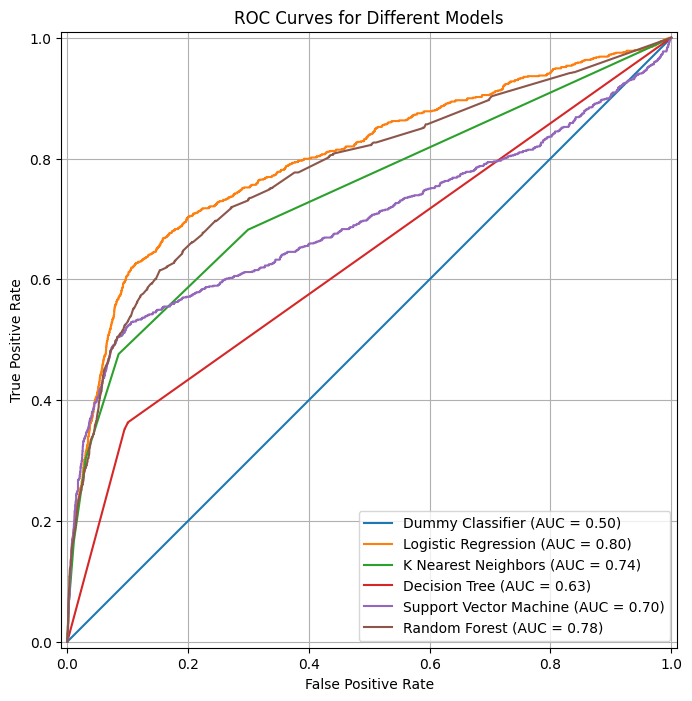

In [56]:


# Plot ROC curves for each model
plt.figure(figsize=(10, 8))

for model_name, metrics in evaluation_results.items():
    if 'y_pred_proba' in metrics:
        RocCurveDisplay.from_estimator(
            metrics['pipeline'],
            X_test,
            y_test,
            name=model_name,
            ax=plt.gca()
        )
    elif model_name == 'Dummy Classifier':
         plt.plot([0, 1], [0, 1], linestyle='--', color='red', label='Dummy Classifier (AUC = 0.5)')


plt.title('ROC Curves for Different Models')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid(True)
plt.savefig('images/roc_curves.png')
plt.show()

### Problem 11: Improving the Model

Now that we have some basic models on the board, we want to try to improve these.  Below, we list a few things to explore in this pursuit.

- More feature engineering and exploration.  For example, should we keep the gender feature?  Why or why not?
- Hyperparameter tuning and grid search.  All of our models have additional hyperparameters to tune and explore.  For example the number of neighbors in KNN or the maximum depth of a Decision Tree.  
- Adjust your performance metric

### Problem 11: Improving the Model - Hyperparameter Tuning

Let's start with hyperparameter tuning for the Logistic Regression model.

In [ ]:


# Define the parameter grid to tune for the Logistic Regression classifier within the pipeline
param_grid = {
    'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100],
    'classifier__penalty': ['l1', 'l2']
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=logistic_pipeline, param_grid=param_grid,
                           scoring='roc_auc', cv=5, n_jobs=-1)

# Fit GridSearchCV on the original training data (the pipeline will handle preprocessing)
print("Performing GridSearchCV for Logistic Regression...")
grid_search.fit(X_train, y_train)

print("GridSearchCV completed.")

# Get the best hyperparameters and the best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("\nBest Hyperparameters:", best_params)
print("Best Cross-Validation ROC-AUC Score:", best_score)

# Get the best model (which is the best pipeline in this case)
best_logistic_pipeline = grid_search.best_estimator_

print("\nBest Logistic Regression pipeline obtained.")

Performing GridSearchCV for Logistic Regression...
GridSearchCV completed.

Best Hyperparameters: {'classifier__C': 0.1, 'classifier__penalty': 'l1'}
Best Cross-Validation ROC-AUC Score: 0.7903538534697041

Best Logistic Regression pipeline obtained.


### Problem 11: Improving the Model - Hyperparameter Tuning (K Nearest Neighbors)

Let's perform hyperparameter tuning for the K Nearest Neighbors (KNN) classifier pipeline.

In [ ]:

# Initialize the KNN pipeline

# Define the parameter grid to tune for the KNN classifier within the pipeline
param_grid_knn = {
    'classifier__n_neighbors': [3, 5, 7, 9, 11, 13, 15]
}

# Initialize GridSearchCV for KNN
grid_search_knn = GridSearchCV(estimator=knn_pipeline, param_grid=param_grid_knn,
                               scoring='roc_auc', cv=5, n_jobs=-1)

# Fit GridSearchCV on the original training data (the pipeline will handle preprocessing)
print("Performing GridSearchCV for K Nearest Neighbors...")
grid_search_knn.fit(X_train, y_train)

print("GridSearchCV completed for KNN.")

# Get the best hyperparameters and the best score for KNN
best_params_knn = grid_search_knn.best_params_
best_score_knn = grid_search_knn.best_score_

print("\nBest Hyperparameters for KNN:", best_params_knn)
print("Best Cross-Validation ROC-AUC Score for KNN:", best_score_knn)

# Get the best KNN pipeline
best_knn_pipeline = grid_search_knn.best_estimator_

print("\nBest K Nearest Neighbors pipeline obtained.")

Performing GridSearchCV for K Nearest Neighbors...
GridSearchCV completed for KNN.

Best Hyperparameters for KNN: {'classifier__n_neighbors': 15}
Best Cross-Validation ROC-AUC Score for KNN: 0.755812635739509

Best K Nearest Neighbors pipeline obtained.


### Problem 11: Improving the Model - Hyperparameter Tuning (Decision Tree)

Let's perform hyperparameter tuning for the Decision Tree classifier pipeline.

In [ ]:

# Initialize the Decision Tree pipeline

# Define the parameter grid to tune for the Decision Tree classifier within the pipeline
param_grid_dt = {
    'classifier__max_depth': [None, 5, 10, 15, 20],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# Initialize GridSearchCV for Decision Tree
grid_search_dt = GridSearchCV(estimator=decision_tree_pipeline, param_grid=param_grid_dt,
                              scoring='roc_auc', cv=5, n_jobs=-1)

# Fit GridSearchCV on the original training data (the pipeline will handle preprocessing)
print("Performing GridSearchCV for Decision Tree...")
grid_search_dt.fit(X_train, y_train)

print("GridSearchCV completed for Decision Tree.")

# Get the best hyperparameters and the best score for Decision Tree
best_params_dt = grid_search_dt.best_params_
best_score_dt = grid_search_dt.best_score_

print("\nBest Hyperparameters for Decision Tree:", best_params_dt)
print("Best Cross-Validation ROC-AUC Score for Decision Tree:", best_score_dt)

# Get the best Decision Tree pipeline
best_decision_tree_pipeline = grid_search_dt.best_estimator_

print("\nBest Decision Tree pipeline obtained.")

Performing GridSearchCV for Decision Tree...
GridSearchCV completed for Decision Tree.

Best Hyperparameters for Decision Tree: {'classifier__max_depth': 5, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 10}
Best Cross-Validation ROC-AUC Score for Decision Tree: 0.7778727046136888

Best Decision Tree pipeline obtained.


### Problem 11: Improving the Model - Hyperparameter Tuning (Support Vector Machine)

Let's perform hyperparameter tuning for the Support Vector Machine (SVM) classifier pipeline.

**Note:** SVM can be computationally expensive, especially with cross-validation on larger datasets and with certain kernels. We'll start with a smaller parameter grid. If training takes too long, we might need to reduce the grid size or consider alternative approaches like RandomizedSearchCV.

In [46]:


# Define the parameter distribution to sample from for RandomizedSearchCV
param_dist_svm = {
    'classifier__C': uniform(loc=1, scale=10),
    'classifier__kernel': ['linear', 'rbf'],
    'classifier__gamma': ['scale', 'auto', uniform(loc=1, scale=10)]
}

# Initialize RandomizedSearchCV
random_search_svm = RandomizedSearchCV(estimator=svm_pipeline, param_distributions=param_dist_svm,
                                       n_iter=20,
                                       scoring='roc_auc', cv=3, n_jobs=-1, random_state=42)

# Fit RandomizedSearchCV on the original training data (the pipeline will handle preprocessing)
print("Performing RandomizedSearchCV for Support Vector Machine...")
random_search_svm.fit(X_train, y_train)

print("RandomizedSearchCV completed for SVM.")

# Get the best hyperparameters and the best score for SVM
best_params_svm = random_search_svm.best_params_
best_score_svm = random_search_svm.best_score_
print("\nBest Hyperparameters for SVM:", best_params_svm)
print("Best Cross-Validation ROC-AUC Score for SVM:", best_score_svm)

# Get the best SVM pipeline
best_svm_pipeline = random_search_svm.best_estimator_

print("\nBest Support Vector Machine pipeline obtained.")

Performing RandomizedSearchCV for Support Vector Machine...
RandomizedSearchCV completed for SVM.

Best Hyperparameters for SVM: {'classifier__C': np.float64(0.15641157902710026), 'classifier__gamma': 'auto', 'classifier__kernel': 'rbf'}
Best Cross-Validation ROC-AUC Score for SVM: 0.7044542959711969

Best Support Vector Machine pipeline obtained.


### Problem 11: Improving the Model - Hyperparameter Tuning (Random Forest)

Let's perform hyperparameter tuning for the Random Forest classifier pipeline.

In [47]:


# Define the parameter grid to tune for the Random Forest classifier within the pipeline
# Explore hyperparameters like n_estimators, max_depth, min_samples_split, and min_samples_leaf
param_grid_rf = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [None, 10, 20],
    'classifier__min_samples_split': [2, 5],
    'classifier__min_samples_leaf': [1, 2]
}

# Initialize GridSearchCV for Random Forest
# Use cross-validation 3 and the 'roc_auc' scoring metric
grid_search_rf = GridSearchCV(estimator=random_forest_pipeline, param_grid=param_grid_rf,
                              scoring='roc_auc', cv=3, n_jobs=-1)

print("Performing GridSearchCV for Random Forest...")
grid_search_rf.fit(X_train, y_train)

print("GridSearchCV completed for Random Forest.")

# Get the best hyperparameters and the best score for Random Forest
best_params_rf = grid_search_rf.best_params_
best_score_rf = grid_search_rf.best_score_

print("\nBest Hyperparameters for Random Forest:", best_params_rf)
print("Best Cross-Validation ROC-AUC Score for Random Forest:", best_score_rf)

# Get the best Random Forest pipeline
best_random_forest_pipeline = grid_search_rf.best_estimator_

print("\nBest Random Forest pipeline obtained.")

Performing GridSearchCV for Random Forest...
GridSearchCV completed for Random Forest.

Best Hyperparameters for Random Forest: {'classifier__max_depth': 10, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200}
Best Cross-Validation ROC-AUC Score for Random Forest: 0.7969246443072272

Best Random Forest pipeline obtained.


### Problem 11: Evaluating Tuned Model Pipelines

Let's evaluate the performance of the best tuned model pipelines on the test set.

In [48]:


# Dictionary to store evaluation results for tuned model pipelines
tuned_pipeline_results = {}

# Dictionary to store comparison data for tuned pipelines
tuned_pipeline_comparison_data = {
    'Model': [],
    'Test Accuracy': [],
    'Test ROC-AUC': [],
    'Test Precision (Yes)': [],
    'Test Recall (Yes)': [],
    'Test F1-score (Yes)': []
}


# --- Evaluate Tuned Logistic Regression Pipeline ---
model_name = 'Logistic Regression (Tuned)'
print(f"Evaluating {model_name}...")
y_pred_lr_tuned = best_logistic_pipeline.predict(X_test)
y_pred_proba_lr_tuned = best_logistic_pipeline.predict_proba(X_test)[:, 1]

tuned_pipeline_results[model_name] = {
    'Accuracy': accuracy_score(y_test, y_pred_lr_tuned),
    'Classification Report': classification_report(y_test, y_pred_lr_tuned),
    'Confusion Matrix': confusion_matrix(y_test, y_pred_lr_tuned),
    'ROC-AUC Score': roc_auc_score(y_test, y_pred_proba_lr_tuned),
    'y_pred': y_pred_lr_tuned
}

tuned_pipeline_comparison_data['Model'].append(model_name)
tuned_pipeline_comparison_data['Test Accuracy'].append(tuned_pipeline_results[model_name]['Accuracy'])
tuned_pipeline_comparison_data['Test ROC-AUC'].append(tuned_pipeline_results[model_name]['ROC-AUC Score'])
report = classification_report(y_test, y_pred_lr_tuned, output_dict=True)
tuned_pipeline_comparison_data['Test Precision (Yes)'].append(report['1']['precision'] if '1' in report else np.nan)
tuned_pipeline_comparison_data['Test Recall (Yes)'].append(report['1']['recall'] if '1' in report else np.nan)
tuned_pipeline_comparison_data['Test F1-score (Yes)'].append(report['1']['f1-score'] if '1' in report else np.nan)

print(f"Evaluation complete for {model_name}.")

# --- Evaluate Tuned K Nearest Neighbors Pipeline ---
model_name = 'K Nearest Neighbors (Tuned)'
print(f"\nEvaluating {model_name}...")
y_pred_knn_tuned = best_knn_pipeline.predict(X_test)
y_pred_proba_knn_tuned = best_knn_pipeline.predict_proba(X_test)[:, 1]

tuned_pipeline_results[model_name] = {
    'Accuracy': accuracy_score(y_test, y_pred_knn_tuned),
    'Classification Report': classification_report(y_test, y_pred_knn_tuned),
    'Confusion Matrix': confusion_matrix(y_test, y_pred_knn_tuned),
    'ROC-AUC Score': roc_auc_score(y_test, y_pred_proba_knn_tuned),
    'y_pred': y_pred_knn_tuned
}

tuned_pipeline_comparison_data['Model'].append(model_name)
tuned_pipeline_comparison_data['Test Accuracy'].append(tuned_pipeline_results[model_name]['Accuracy'])
tuned_pipeline_comparison_data['Test ROC-AUC'].append(tuned_pipeline_results[model_name]['ROC-AUC Score'])
report = classification_report(y_test, y_pred_knn_tuned, output_dict=True)
tuned_pipeline_comparison_data['Test Precision (Yes)'].append(report['1']['precision'] if '1' in report else np.nan)
tuned_pipeline_comparison_data['Test Recall (Yes)'].append(report['1']['recall'] if '1' in report else np.nan)
tuned_pipeline_comparison_data['Test F1-score (Yes)'].append(report['1']['f1-score'] if '1' in report else np.nan)

print(f"Evaluation complete for {model_name}.")


# --- Evaluate Tuned Decision Tree Pipeline ---
model_name = 'Decision Tree (Tuned)'
print(f"\nEvaluating {model_name}...")
y_pred_dt_tuned = best_decision_tree_pipeline.predict(X_test)
y_pred_proba_dt_tuned = best_decision_tree_pipeline.predict_proba(X_test)[:, 1]

tuned_pipeline_results[model_name] = {
    'Accuracy': accuracy_score(y_test, y_pred_dt_tuned),
    'Classification Report': classification_report(y_test, y_pred_dt_tuned),
    'Confusion Matrix': confusion_matrix(y_test, y_pred_dt_tuned),
    'ROC-AUC Score': roc_auc_score(y_test, y_pred_proba_dt_tuned),
    'y_pred': y_pred_dt_tuned
}

tuned_pipeline_comparison_data['Model'].append(model_name)
tuned_pipeline_comparison_data['Test Accuracy'].append(tuned_pipeline_results[model_name]['Accuracy'])
tuned_pipeline_comparison_data['Test ROC-AUC'].append(tuned_pipeline_results[model_name]['ROC-AUC Score'])
report = classification_report(y_test, y_pred_dt_tuned, output_dict=True)
tuned_pipeline_comparison_data['Test Precision (Yes)'].append(report['1']['precision'] if '1' in report else np.nan)
tuned_pipeline_comparison_data['Test Recall (Yes)'].append(report['1']['recall'] if '1' in report else np.nan)
tuned_pipeline_comparison_data['Test F1-score (Yes)'].append(report['1']['f1-score'] if '1' in report else np.nan)

print(f"Evaluation complete for {model_name}.")


# --- Evaluate Tuned Support Vector Machine Pipeline ---
model_name = 'Support Vector Machine (Tuned)'
print(f"\nEvaluating {model_name}...")
y_pred_svm_tuned = best_svm_pipeline.predict(X_test)
y_pred_proba_svm_tuned = best_svm_pipeline.predict_proba(X_test)[:, 1]

tuned_pipeline_results[model_name] = {
    'Accuracy': accuracy_score(y_test, y_pred_svm_tuned),
    'Classification Report': classification_report(y_test, y_pred_svm_tuned),
    'Confusion Matrix': confusion_matrix(y_test, y_pred_svm_tuned),
    'ROC-AUC Score': roc_auc_score(y_test, y_pred_proba_svm_tuned),
    'y_pred': y_pred_svm_tuned
}

tuned_pipeline_comparison_data['Model'].append(model_name)
tuned_pipeline_comparison_data['Test Accuracy'].append(tuned_pipeline_results[model_name]['Accuracy'])
tuned_pipeline_comparison_data['Test ROC-AUC'].append(tuned_pipeline_results[model_name]['ROC-AUC Score'])
report = classification_report(y_test, y_pred_svm_tuned, output_dict=True)
tuned_pipeline_comparison_data['Test Precision (Yes)'].append(report['1']['precision'] if '1' in report else np.nan)
tuned_pipeline_comparison_data['Test Recall (Yes)'].append(report['1']['recall'] if '1' in report else np.nan)
tuned_pipeline_comparison_data['Test F1-score (Yes)'].append(report['1']['f1-score'] if '1' in report else np.nan)

print(f"Evaluation complete for {model_name}.")

# --- Evaluate Tuned Random Forest Pipeline ---
model_name = 'Random Forest (Tuned)'
print(f"\nEvaluating {model_name}...")
y_pred_rf_tuned = best_random_forest_pipeline.predict(X_test)
y_pred_proba_rf_tuned = best_random_forest_pipeline.predict_proba(X_test)[:, 1]

tuned_pipeline_results[model_name] = {
    'Accuracy': accuracy_score(y_test, y_pred_rf_tuned),
    'Classification Report': classification_report(y_test, y_pred_rf_tuned),
    'Confusion Matrix': confusion_matrix(y_test, y_pred_rf_tuned),
    'ROC-AUC Score': roc_auc_score(y_test, y_pred_proba_rf_tuned),
    'y_pred': y_pred_rf_tuned
}

tuned_pipeline_comparison_data['Model'].append(model_name)
tuned_pipeline_comparison_data['Test Accuracy'].append(tuned_pipeline_results[model_name]['Accuracy'])
tuned_pipeline_comparison_data['Test ROC-AUC'].append(tuned_pipeline_results[model_name]['ROC-AUC Score'])
report = classification_report(y_test, y_pred_rf_tuned, output_dict=True)
tuned_pipeline_comparison_data['Test Precision (Yes)'].append(report['1']['precision'] if '1' in report else np.nan)
tuned_pipeline_comparison_data['Test Recall (Yes)'].append(report['1']['recall'] if '1' in report else np.nan)
tuned_pipeline_comparison_data['Test F1-score (Yes)'].append(report['1']['f1-score'] if '1' in report else np.nan)

print(f"Evaluation complete for {model_name}.")


print("\n--- Tuned Model Pipeline Evaluation Results ---")
for model_name, metrics in tuned_pipeline_results.items():
    print(f"\n--- {model_name} ---")
    print(f"Accuracy: {metrics['Accuracy']:.4f}")
    print(f"ROC-AUC Score: {metrics['ROC-AUC Score']:.4f}")
    print("\nClassification Report:")
    print(metrics['Classification Report'])
    print("\nConfusion Matrix:")
    display(metrics['Confusion Matrix'])


# --- Compare Tuned Model Pipelines Performance ---
print("\n--- Tuned Model Pipeline Comparison ---")
tuned_pipeline_comparison_df = pd.DataFrame(tuned_pipeline_comparison_data)
display(tuned_pipeline_comparison_df)

Evaluating Logistic Regression (Tuned)...
Evaluation complete for Logistic Regression (Tuned).

Evaluating K Nearest Neighbors (Tuned)...
Evaluation complete for K Nearest Neighbors (Tuned).

Evaluating Decision Tree (Tuned)...
Evaluation complete for Decision Tree (Tuned).

Evaluating Support Vector Machine (Tuned)...
Evaluation complete for Support Vector Machine (Tuned).

Evaluating Random Forest (Tuned)...
Evaluation complete for Random Forest (Tuned).

--- Tuned Model Pipeline Evaluation Results ---

--- Logistic Regression (Tuned) ---
Accuracy: 0.8992
ROC-AUC Score: 0.8003

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.99      0.95      7308
           1       0.67      0.21      0.32       928

    accuracy                           0.90      8236
   macro avg       0.79      0.60      0.63      8236
weighted avg       0.88      0.90      0.87      8236


Confusion Matrix:


array([[7214,   94],
       [ 736,  192]])


--- K Nearest Neighbors (Tuned) ---
Accuracy: 0.8980
ROC-AUC Score: 0.7751

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      7308
           1       0.61      0.26      0.36       928

    accuracy                           0.90      8236
   macro avg       0.76      0.62      0.65      8236
weighted avg       0.88      0.90      0.88      8236


Confusion Matrix:


array([[7157,  151],
       [ 689,  239]])


--- Decision Tree (Tuned) ---
Accuracy: 0.9007
ROC-AUC Score: 0.7909

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.98      0.95      7308
           1       0.65      0.26      0.37       928

    accuracy                           0.90      8236
   macro avg       0.78      0.62      0.66      8236
weighted avg       0.88      0.90      0.88      8236


Confusion Matrix:


array([[7181,  127],
       [ 691,  237]])


--- Support Vector Machine (Tuned) ---
Accuracy: 0.8968
ROC-AUC Score: 0.6879

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.99      0.94      7308
           1       0.63      0.20      0.30       928

    accuracy                           0.90      8236
   macro avg       0.77      0.59      0.62      8236
weighted avg       0.88      0.90      0.87      8236


Confusion Matrix:


array([[7200,  108],
       [ 742,  186]])


--- Random Forest (Tuned) ---
Accuracy: 0.8998
ROC-AUC Score: 0.8094

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.99      0.95      7308
           1       0.67      0.22      0.33       928

    accuracy                           0.90      8236
   macro avg       0.79      0.60      0.64      8236
weighted avg       0.88      0.90      0.88      8236


Confusion Matrix:


array([[7210,   98],
       [ 727,  201]])


--- Tuned Model Pipeline Comparison ---


,Model,Test Accuracy,Test ROC-AUC,Test Precision (Yes),Test Recall (Yes),Test F1-score (Yes)
0,Logistic Regression (Tuned),0.899223,0.800299,0.671329,0.206897,0.316310
1,K Nearest Neighbors (Tuned),0.898009,0.775101,0.612821,0.257543,0.362671
2,Decision Tree (Tuned),0.900680,0.790865,0.651099,0.255388,0.366873
3,Support Vector Machine (Tuned),0.896795,0.687927,0.632653,0.200431,0.304419
4,Random Forest (Tuned),0.899830,0.809386,0.672241,0.216595,0.327628


### Problem 11: Tuned Model Comparison Summary

Let's summarize the performance metrics of the tuned model pipelines.

In [49]:
# Display the comparison DataFrame for tuned models

print("Tuned Model Comparison Results:")
display(tuned_pipeline_comparison_df)

Tuned Model Comparison Results:


,Model,Test Accuracy,Test ROC-AUC,Test Precision (Yes),Test Recall (Yes),Test F1-score (Yes)
0,Logistic Regression (Tuned),0.899223,0.800299,0.671329,0.206897,0.316310
1,K Nearest Neighbors (Tuned),0.898009,0.775101,0.612821,0.257543,0.362671
2,Decision Tree (Tuned),0.900680,0.790865,0.651099,0.255388,0.366873
3,Support Vector Machine (Tuned),0.896795,0.687927,0.632653,0.200431,0.304419
4,Random Forest (Tuned),0.899830,0.809386,0.672241,0.216595,0.327628


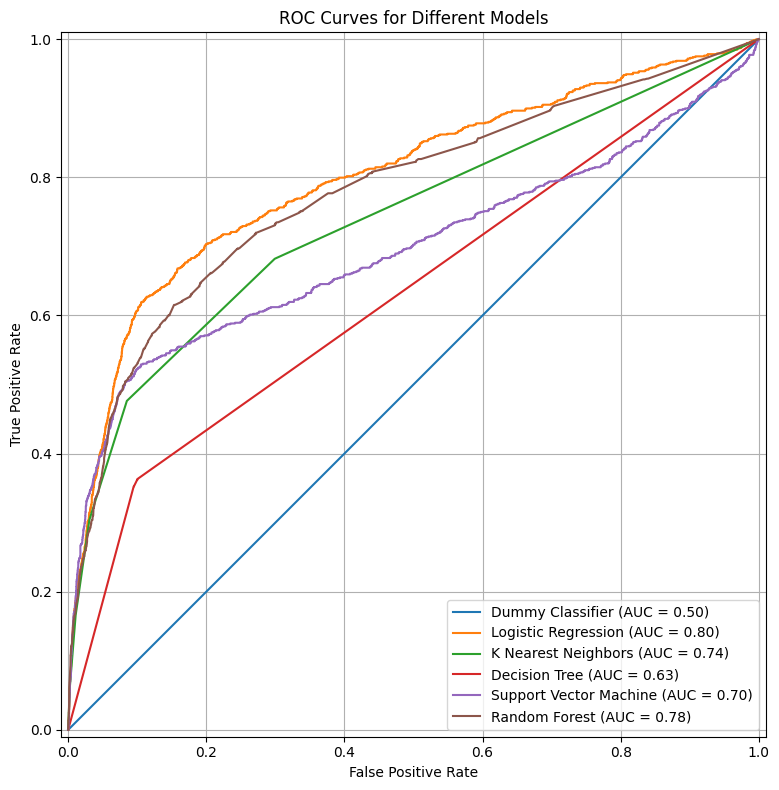

In [57]:
from sklearn.metrics import RocCurveDisplay
import matplotlib.pyplot as plt

# Plot ROC curves for each model
ax=plt.figure(figsize=(10, 8))

for model_name, metrics in evaluation_results.items():
    if 'y_pred_proba' in metrics:
        RocCurveDisplay.from_estimator(
            metrics['pipeline'],
            X_test,
            y_test,
            name=model_name,
            ax=plt.gca()
        )
    elif model_name == 'Dummy Classifier':
         # Handle Dummy Classifier specifically if it doesn't have predict_proba
         plt.plot([0, 1], [0, 1], linestyle='--', color='red', label='Dummy Classifier (AUC = 0.5)')


plt.title('ROC Curves for Different Models')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f'images/roc_curves_tuned.png')
plt.show()

##### Questions

Based on the Tuned Model Comparison Results

**DataFrame:**
* **Random Forest (Tuned)** has the highest Test **ROC-AUC score (0.8094)**, indicating it is the best model at distinguishing between the positive and negative classes (clients who subscribed vs. those who didn't). ROC-AUC is a robust metric for imbalanced datasets like this one.
* **Logistic Regression (Tuned)** is very close behind in terms of **Test ROC-AUC (0.8003).**
* **Support Vector Machine (Tuned)** has the lowest **Test ROC-AUC (0.6879)** among the tuned models, suggesting it's not performing as well in this case.
* Looking at **Test Accuracy**, all tuned models show similar accuracy scores, ranging from approximately 0.897 to 0.901. This is expected given the high class imbalance; even a model that predicts the majority class most of the time will have high accuracy. This highlights why ROC-AUC and other metrics are more informative for this problem.
* For the positive class ('yes'), Test Precision (Yes) is highest for Random Forest (0.6722) and Logistic Regression (0.6713), meaning when these models predict a client will subscribe, they are correct about 67% of the time.
* **Test Recall (Yes)** is relatively low across all models, ranging from about 0.20 to 0.26. This indicates that the models are only identifying a relatively small proportion of the actual subscribers. Depending on the business objective (e.g., minimizing missed opportunities vs. minimizing incorrect targeting), we might prioritize recall or precision.
* **The Test F1-score (Yes)**, which is the harmonic mean of precision and recall, is highest for Random Forest (0.3276), followed closely by Decision Tree (0.3669) and K Nearest Neighbors (0.3627). This metric provides a single score that balances both precision and recall for the positive class.

In summary, while all tuned models have similar overall accuracy due to the class imbalance, the **Random Forest (Tuned)** and **Logistic Regression (Tuned)** models demonstrate the best performance in terms of ROC-AUC, which is a more reliable indicator for this type of problem. The Random Forest also has a slightly better F1-score for the positive class.

Based on these results, **Random Forest (Tuned)** appears to be the most promising model for this task based on the chosen evaluation metrics.

Based on our evaluation, the **tuned Random Forest model** is the best performing model for predicting term deposit subscriptions.

### Problem 11: Improving the Model - Additional Feature Engineering

Based on our Exploratory Data Analysis (EDA) and the evaluation of the initial and tuned models, let's consider additional feature engineering steps that could potentially improve model performance.

Some areas to explore include:

*   **Handling 'unknown' values:** We observed a significant number of 'unknown' values in several categorical columns (`job_type`, `marital_status`, `education_level`, `has_credit_default`, `has_housing_loan`, `has_personal_loan`). We currently impute these, but we could consider treating 'unknown' as a separate category during encoding or using a more sophisticated imputation method.
*   **Handling '999' in `prev_campaign_days_since_contact`:** The value '999' in `prev_campaign_days_since_contact` indicates that the client was not previously contacted. We could create a binary feature indicating whether the client was previously contacted or not, and then potentially handle the '999' values in a different way (e.g., impute with a value representing "never contacted" or a very large number).
*   **Creating interaction terms:** Explore creating interaction features between potentially important features identified in the bivariate analysis. For example, interactions between 'job_type' and 'education_level' or 'contact_communication_type' and 'last_contact_month'.
*   **Polynomial Features:** For numerical features that might have a non-linear relationship with the target, consider creating polynomial features.
*   **Combining infrequent categories:** For categorical features with many rare categories, consider grouping them into a single 'other' category to reduce the dimensionality and potentially improve model stability.
*   **Addressing Outliers:** Although we used an outlier capper, we could explore alternative strategies like removing outliers (if a small number and justifiable) or using robust scaling methods.



In [52]:

# Define the filename for the saved model
model_filename = 'tuned_random_forest_model.joblib'

# Create a directory to save the model if it doesn't exist
if not os.path.exists('models'):
    os.makedirs('models')

# Save the tuned Random Forest pipeline
joblib.dump(best_random_forest_pipeline, os.path.join('models', model_filename))

print(f"Tuned Random Forest model saved to 'models/{model_filename}'")

Tuned Random Forest model saved to 'models/tuned_random_forest_model.joblib'


In [53]:

# Define the filename for the saved model
model_filename = 'tuned_random_forest_model.joblib'

# Load the tuned Random Forest pipeline
loaded_model = joblib.load(os.path.join('models', model_filename))

print("Tuned Random Forest model loaded.")

# Simulate new data for prediction
# Create a small DataFrame with a few rows, similar structure to X_test
new_data = pd.DataFrame({
    'age': [35, 45, 28],
    'job_type': ['technician', 'management', 'student'],
    'marital_status': ['married', 'single', 'single'],
    'education_level': ['university.degree', 'high.school', 'basic.9y'],
    'has_credit_default': ['no', 'no', 'no'],
    'has_housing_loan': ['yes', 'no', 'no'],
    'has_personal_loan': ['no', 'yes', 'no'],
    'contact_communication_type': ['cellular', 'telephone', 'cellular'],
    'last_contact_month': ['may', 'jul', 'oct'],
    'last_contact_day_of_week': ['mon', 'tue', 'fri'],
    'current_campaign_num_contacts': [2, 1, 3],
    'prev_campaign_days_since_contact': [999, 10, 999],
    'prev_campaign_num_contacts': [0, 1, 0],
    'prev_campaign_outcome': ['nonexistent', 'success', 'nonexistent'],
    'employment_variation_rate': [1.1, -1.8, -0.1],
    'consumer_price_index': [93.994, 92.893, 93.200],
    'consumer_confidence_index': [-36.4, -46.2, -42.0],
    'euribor_3_month_rate': [4.857, 1.244, 4.191],
    'qtly_avg_employed': [5191.0, 5099.1, 5195.8]
})

print("\nSimulated new data:")
display(new_data)

# Make predictions on the new data
predictions = loaded_model.predict(new_data)
predictions_proba = loaded_model.predict_proba(new_data)[:, 1]

print("\nPredictions (0: No Subscription, 1: Yes Subscription):")
print(predictions)

print("\nPredicted Probabilities of Subscription:")
print(predictions_proba)

Tuned Random Forest model loaded.

Simulated new data:


,age,job_type,marital_status,education_level,has_credit_default,has_housing_loan,has_personal_loan,contact_communication_type,last_contact_month,last_contact_day_of_week,current_campaign_num_contacts,prev_campaign_days_since_contact,prev_campaign_num_contacts,prev_campaign_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor_3_month_rate,qtly_avg_employed
0,35,technician,married,university.degree,no,yes,no,cellular,may,mon,2,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
1,45,management,single,high.school,no,no,yes,telephone,jul,tue,1,10,1,success,-1.8,92.893,-46.2,1.244,5099.1
2,28,student,single,basic.9y,no,no,no,cellular,oct,fri,3,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8



Predictions (0: No Subscription, 1: Yes Subscription):
[0 0 0]

Predicted Probabilities of Subscription:
[0.0867 0.3478 0.2952]


While the tuned Random Forest model performed well based on ROC-AUC, there are always opportunities to potentially improve the model further. Here are some areas we could explore:

1. **More Advanced Feature Engineering:**
  * Revisit the 'unknown' and '999' values: Instead of simple imputation or capping, we could try treating 'unknown' as a separate category or using more sophisticated imputation techniques. For prev_campaign_days_since_contact, we could create a binary feature indicating whether a client was previously contacted (pdays == 999) and then handle the non-999 values differently.
  * Create interaction features: Based on the EDA, we could engineer interaction terms between features that showed interesting relationships (e.g., job type and education level, contact type and month).
  * Polynomial features: Explore if adding polynomial features for some numerical columns improves performance.
  * Feature selection: Use feature selection techniques to identify and potentially remove less important features, which could help simplify the model and potentially improve performance and reduce training time.
2. **Handling Class Imbalance:**
  * Resampling techniques: Experiment with techniques like oversampling the minority class (e.g., SMOTE) or undersampling the majority class to create a more balanced training dataset.
  * Class weights: Many models allow you to assign different weights to the classes during training to give more importance to the minority class. We could explore this option for models that support it.
3. **Exploring Other Models:**
  * Gradient Boosting Models: Models like Gradient Boosting Machines (GBM), XGBoost, LightGBM, or CatBoost often perform very well on tabular data and are worth exploring.
  * Ensemble Methods: Beyond Random Forest, consider other ensemble techniques or stacking different models.
4. **More Extensive Hyperparameter Tuning:**
  * Larger parameter grids: Explore a wider range of hyperparameters for the models we've already tuned.
  * More advanced tuning techniques: Use techniques like RandomizedSearchCV with more iterations or Bayesian optimization for more efficient exploration of the hyperparameter space.
5. **Cross-Validation Strategies:**
  * While we used stratified k-fold cross-validation during tuning, we could explore other cross-validation strategies if the data has any time-series or group-based structure that needs to be considered.